In [1]:
import numpy as np
from scipy.stats import norm
import numpy as np
import astropy
from astropy.io import fits
from astropy import units as u
from astropy import units as u
from astropy.coordinates import SkyCoord
import astropy.coordinates as coord
import healpy as hp
import pandas as pd
import math
import scipy
import statistics as st
from scipy import stats
import matplotlib
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
from IPython.display import Image

%matplotlib inline

NSIDE=2048
Npix=12*NSIDE**2

pi=math.pi

import warnings
warnings.filterwarnings('ignore')

---

### Read in MMF3

In [19]:
amfFull = pd.read_csv('amfFull.tsv',sep='|')

c = SkyCoord(amfFull['RAJ2000'],amfFull['DEJ2000'],frame='icrs',unit='deg')

amfFull['GLAT'] = c.galactic.b.degree
amfFull['GLON'] = c.galactic.l.degree

amfFull['GLAT'] = np.around(amfFull['GLAT'].values,1)
amfFull['GLON'] = np.around(amfFull['GLON'].values,1)
print(amfFull.iloc[0,11]) # glat
print(amfFull.iloc[0,12]) # glon
amfFull

-40.9
136.7


,ID,AMF9,RAJ2000,DEJ2000,z,Lk,Lambda200,r200,rc,c,str-rh,GLAT,GLON
0,4,J013539.1+204447,23.9128,20.7465,0.0601,176.9125,219.3663,1.946,0.925,2.104,73.0001,-40.9,136.7
1,5,J172231.8+320823,260.6324,32.1398,0.2252,222.1219,200.7117,1.784,0.625,2.856,35.0001,31.8,55.6
2,6,J131131.1-012008,197.8796,-1.3356,0.2042,171.6872,192.0829,1.773,0.227,7.792,9.0001,61.1,313.4
3,7,J164035.6+464130,250.1485,46.6917,0.2248,225.9874,182.3373,1.725,0.495,3.483,36.0001,41.4,72.6
4,8,J230521.6+210216,346.3402,21.0378,0.1453,121.0124,182.2769,1.775,0.440,4.034,72.0001,-35.4,92.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46474,54273,J212414.7-053519,321.0614,-5.5885,0.4036,7.3319,20.0008,0.734,0.260,2.823,85.1216,-36.3,46.9
46475,54274,J104720.5-025526,161.7603,-2.9238,0.2064,11.9584,20.0006,0.790,0.090,8.781,9.1111,47.5,253.1
46476,54275,J213855.7+153523,324.7319,15.5898,0.1964,8.6750,20.0005,0.793,0.180,4.404,73.0886,-26.7,69.5
46477,54276,J085114.6+015313,132.8109,1.8870,0.2697,12.2539,20.0002,0.772,0.260,2.971,12.1012,27.3,225.8


### Check against intersection mask

In [22]:
mask = hp.read_map('HFI_PCCS_SZ-selfunc-inter-cosmo_2.02.fits')

# Get the nside and number of pixels in your map
nside = hp.get_nside(mask)
npix = hp.nside2npix(nside)
maskedPixels, = np.where(mask == 0)

# Use pix2ang to get the (l, b) coordinates for each pixel
glons, glats = hp.pix2ang(nside, maskedPixels, lonlat=True)
maskedArray = pd.DataFrame({'glon': np.around(glons,1), 'glat': np.around(glats,1)})
maskedArray = maskedArray[(maskedArray.glat > 10)|((maskedArray.glat<-10) & ((maskedArray.glon<210)))].reset_index()

NSIDE = 2048
ORDERING = RING in fits file
INDXSCHM = IMPLICIT


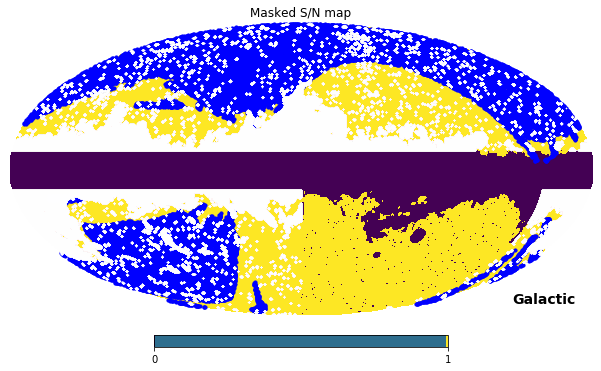

In [23]:
hp.mollview(mask,norm='hist',coord=['G'],title='Masked S/N map')
hp.visufunc.projscatter(amfFull['GLON'],amfFull['GLAT'],c='b',lonlat=True,s=10)
hp.visufunc.projscatter(maskedArray.glon,maskedArray.glat,c='w',lonlat=True,s=0.1)

In [ ]:
interLons = []
interLats = []

for i in range(amfFull.shape[0]):
    matchFlag=False
    for j in range(11): # Within 1 degree
        print(i,amfFull.iloc[i][12],amfFull.iloc[i][11])
        if not maskedArray.loc[np.logical_and(maskedArray.glon == amfFull.iloc[i][12]+j/10, maskedArray.glat == amfFull.iloc[i][11]+j/10)].empty:
            print("MATCH")
            matchFlag=True
            interLons.append(amfFull.iloc[i][12])
            interLats.append(amfFull.iloc[i][11])
            break
    if not matchFlag:
        for j in range(11): # Within 1 degree
            print(i,amfFull.iloc[i][12],amfFull.iloc[i][11])
            if not maskedArray.loc[np.logical_and(maskedArray.glon == amfFull.iloc[i][12]-j/10, maskedArray.glat == amfFull.iloc[i][11]-j/10)].empty:
                print("MATCH")
                matchFlag=True
                interLons.append(amfFull.iloc[i][12])
                interLats.append(amfFull.iloc[i][11])
                break
masked = pd.DataFrame({'glon': interLons, 'glat': interLats})

0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
0 136.7 -40.9
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
1 55.6 31.8
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
2 313.4 61.1
3 72.6 41.4
3 72.6 41.4
3 72.6 41.4
3 72.6 41.4
3 72.6 41.4
MATCH
4 92.2 -35.4
MATCH
5 116.5 -44.5
5 116.5 -44.5
5 116.5 -44.5
5 116.5 -44.5
5

33 229.7 78.0
33 229.7 78.0
34 89.8 -39.5
MATCH
35 155.2 -14.6
MATCH
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
36 50.1 -27.3
37 91.4 -51.0
37 91.4 -51.0
37 91.4 -51.0
37 91.4 -51.0
MATCH
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
38 133.5 69.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
39 180.9 31.0
3

64 140.5 -40.9
64 140.5 -40.9
64 140.5 -40.9
64 140.5 -40.9
64 140.5 -40.9
64 140.5 -40.9
64 140.5 -40.9
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
65 90.6 -45.2
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
66 134.7 53.4
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
67 181.0 34.6
MATCH
68 155.8 70.4
68 155.8 70.4
68 155.8 70.4
68 155.

97 7.0 71.2
97 7.0 71.2
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
98 215.6 22.6
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
99 227.1 41.0
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
100 209.6 43.3
101 37.0 47.1
101 37.0 47.1
10

125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
125 187.8 20.6
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
126 92.2 -55.7
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
127 138.0 -39.9
128 59.8 -46.3
128 59.8 -46.3
128 59.8 -46.3
128

154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
154 46.7 -35.9
MATCH
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
155 89.3 -47.7
MATCH
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
156 100.5 -36.5
157 53.5 -36.3
157 53.5 -36.3
157 53.5 -36.3
157 53.5 -36.3
157 53.5 -36.3
157 53.5 -36.3
157 53.5 -36.3
157 53

185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
185 149.1 -68.6
186 219.9 22.8
186 219.9 22.8
186 219.9 22.8
186 219.9 22.8
186 219.9 22.8
186 219.9 22.8
MATCH
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
187 119.9 -41.4
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
188 57.7 51.6
189 44.4 48.7
189 44.4 48.7
189 44.4

213 75.9 -43.5
214 190.3 38.6
MATCH
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
215 285.8 82.3
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
216 122.5 -38.4
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23.2
217 216.3 23

245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
245 198.2 46.4
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
246 172.2 -53.3
247 68.5 -39.1
MATCH
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 128.6 -34.3
248 12

270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
270 200.4 35.6
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
271 91.2 -53.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
272 233.7 36.1
273 209.8 16.2
273 209.8 16.2
273 209.8 16.2
273 209.8 16.2
273 209.8 

299 260.5 58.9
299 260.5 58.9
299 260.5 58.9
299 260.5 58.9
299 260.5 58.9
299 260.5 58.9
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
300 181.5 21.4
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
301 70.1 -33.6
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 25.3
302 224.8 

326 91.0 -27.9
326 91.0 -27.9
326 91.0 -27.9
326 91.0 -27.9
326 91.0 -27.9
326 91.0 -27.9
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
327 224.1 69.3
328 195.0 54.1
328 195.0 54.1
328 195.0 54.1
328 195.0 54.1
MATCH
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
329 231.8 30.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.5 -34.8
330 127.

357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
357 226.1 30.1
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
358 80.4 -33.2
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
359 37.5 71.5
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
360 72.6 -38.3
36

386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
386 90.4 -41.3
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
387 98.5 -29.8
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
388 103.9 -34.2
MATCH
389 129.2 -47.4
389 129.2 -47.4
389 129.2 -47.4
389 129.2 -47.4
389 129.2 -47.4
389 129.2 -47.4
389 129.2 -47.4
389 129.2 -47.4
389 129.2 -47.4
MATCH
390 48.9 -25.6
390

414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
414 113.1 -58.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
415 12.0 59.6
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
416 67.0 -20.8
MATCH
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -58.2
417 153.1 -5

444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
444 145.3 -67.7
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
445 127.6 -49.9
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
446 7.4 50.3
447 25.1 59.9
447 25.1 59.9
447 25.1 59.9
447 25.1 59.9
447 25.1 59.9
447 25.1 59.9
447 25.1 59.9
447 25.1

475 141.8 -61.2
476 53.7 -26.8
MATCH
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
477 62.4 -45.6
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
478 32.2 60.7
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 41.6
479 145.8 

504 169.6 69.5
504 169.6 69.5
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
505 119.6 -72.1
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
506 93.9 35.0
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 72.7
507 285.5 

535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
535 57.9 -36.0
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
536 140.4 -41.6
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
537 114.2 58.9
MATCH
538 191.7 -33.1
MATCH
539 66.1 -38.3
539 66.1 -38.3
539 66.1 -38.3
539 66.1 -38.3
539 66.1 -38.3
539 66.1 -38.3
539 66.1 -38.3
539 66.1 -38.3
539 6

566 132.1 -46.7
566 132.1 -46.7
566 132.1 -46.7
566 132.1 -46.7
566 132.1 -46.7
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
567 275.2 64.2
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
568 152.4 81.3
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 81.2 -41.9
569 8

594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
594 64.1 -53.7
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
595 174.4 -57.3
596 93.6 -31.9
MATCH
597 151.6 69.3
597 151.6 69.3
597 151.6 69.3
597 151.6 69.3
597 151.6 69.3
597 151.6 69.3
597 151.6 69.3
597 151.6 69.3
597 151.6 69.3
MATCH
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598 103.6 -34.0
598

625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
625 146.7 55.7
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
626 167.9 -59.9
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
627 7.4 74.7
628 212.7 38.6
628 212.7 38.6
628 212.7 38.6
62

656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
656 174.4 34.5
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
657 223.1 36.8
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
658 130.0 59.1
659 194.4 52.5
MATCH
660 42.9 59.8
660 42.9 59.8
660 42.9 59.8
660 42.9 59.8
660 42.9 59.8
660 42.9 59.8
660 42.9 59.8
660 42.9 59

688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
688 242.2 71.9
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
689 222.0 19.0
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
690 108.2 -28.1
691 102.5 -35.1
691 102.5 -35.1
691 102.5 -35.1
691 102.5 -35.1

715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
715 206.1 63.9
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
716 88.2 -44.1
MATCH
717 89.2 -41.0
MATCH
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
718 89.1 -49.0
719 81.0 -64.

747 127.9 -69.2
747 127.9 -69.2
747 127.9 -69.2
747 127.9 -69.2
747 127.9 -69.2
MATCH
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
748 144.9 -29.8
749 44.7 -34.0
749 44.7 -34.0
749 44.7 -34.0
749 44.7 -34.0
749 44.7 -34.0
MATCH
750 92.2 -35.6
MATCH
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
751 49.2 30.9
MATCH
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
752 184.2 -42.5
75

777 18.1 45.5
777 18.1 45.5
777 18.1 45.5
777 18.1 45.5
777 18.1 45.5
777 18.1 45.5
777 18.1 45.5
777 18.1 45.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
778 85.0 -57.5
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
779 172.3 53.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780 286.7 83.0
780

804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
804 210.1 50.9
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
805 90.0 -37.4
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
806 170.2 79.1
807 68.8 43.7
807 68.8 43.7
807 68.8 43.7
807 68.8 43.7
807 68.8 43.7
807 68.8 43.7
807 68.8 43.7
807 68.8 43.7
807

832 24.7 67.4
832 24.7 67.4
832 24.7 67.4
832 24.7 67.4
832 24.7 67.4
832 24.7 67.4
832 24.7 67.4
832 24.7 67.4
832 24.7 67.4
833 219.0 51.2
833 219.0 51.2
833 219.0 51.2
833 219.0 51.2
833 219.0 51.2
833 219.0 51.2
833 219.0 51.2
833 219.0 51.2
833 219.0 51.2
MATCH
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
834 117.7 59.6
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
835 55.7 60.1
836 144.2 -29.4
836 144.2 -29.4
836 144.2 -29.4
836 144.2 -29.4
836 144.2 -29.4
836 144.2 -29.4

864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
864 223.2 18.3
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
865 115.5 -49.5
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
866 186.2 71.7
867 155.9 -14.1
MATCH
868 116.6 -50.5
868 116.6 -50.5
868 116.6 -50.5
868 116.6 -50.5
868 116.6 -50.5
868 116.6 -50.5
868 116.6 -50.5
868 116.6 -50.5
868 116.6 -50.5
86

893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
893 109.6 -30.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
894 61.7 -45.6
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
895 100.2 -37.5
MATCH
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 195.4 39.4
896 1

922 229.0 58.8
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
923 92.3 -68.1
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
924 341.0 77.5
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 52.8
925 230.9 

952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
952 64.6 -29.7
953 89.8 -40.1
MATCH
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
954 135.1 -51.2
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
955 2.5 53.9
956 136.3 -28.8
956 136.3 -28.8
956 136.3 -28.8
956 136.3 -28.8
956 136.3 -28.8
956 136.3 -28.8
956 136.3 -28.8
956 136.3 -28.8
956 136.3 -28.8
95

979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
979 198.5 -36.6
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
980 154.4 -68.2
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
981 90.0 -43.9
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.7 25.7
982 194.

1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1006 208.0 81.3
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1007 168.0 -65.0
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25.8 62.6
1008 25

1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1032 152.4 -57.8
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1033 100.7 -68.9
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1034 107.4 -31.6
1035 59.5 -29.

1058 199.9 29.3
1058 199.9 29.3
1058 199.9 29.3
1058 199.9 29.3
1058 199.9 29.3
1058 199.9 29.3
MATCH
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1059 14.8 51.1
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1060 57.6 34.9
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.5
1061 84.8 46.

1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1083 80.6 -24.8
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1084 192.2 -47.3
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
1085 140.0 59.6
10

1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
1111 93.8 -30.2
MATCH
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1112 61.9 80.7
1113 81.4 -45.7
1113 81.4 -45.7
MATCH
1114 89.4 -41.5
MATCH
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1115 289.6 79.0
1116 141.6 -39.4
1116 141.6 -39.4
1116 141.6 -39.4
1116 141.

1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1140 322.1 83.1
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1141 39.8 54.4
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.7
1142 327.3 58.

1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1168 84.6 -36.1
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1169 99.1 50.3
1170 190.5 -38.3
MATCH
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1171 30.6 57.6
1172 49.9 -44

1194 189.8 73.6
1194 189.8 73.6
1194 189.8 73.6
1194 189.8 73.6
1194 189.8 73.6
1194 189.8 73.6
1194 189.8 73.6
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1195 179.4 -47.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1196 48.2 44.2
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.1 -50.6
1197 70.

1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1221 136.5 -52.1
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1222 349.8 77.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.9 38.8
1223 70.

1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1247 288.4 69.7
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1248 134.3 85.4
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1249 79.8 63.5
1250 4.2 56.8
1250 4.2 56.8
1250 4.2 56.8
1250 4.2 56.8
1250 4.2 56.8
1250 4.2 56.8
1250 4.2 56.8
1250 4.2 56.8
1250 4.2 56.8


1273 187.5 62.7
1273 187.5 62.7
1273 187.5 62.7
1273 187.5 62.7
1273 187.5 62.7
1273 187.5 62.7
1273 187.5 62.7
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1274 82.5 -59.3
1275 156.1 -14.4
MATCH
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1276 103.3 -57.3
1277 137.0 -48.6
1277 137.0 -48.6
1277 137.0 -48.6
1277 137.0 -48.6
1277 137.0 -48.6
1277 137.0 -48.6
1277 137.0 -48.6
1277 137.0 -48.6
127

1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1301 339.5 63.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1302 25.4 82.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.6
1303 209.0 28.

1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1331 91.4 61.4
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
1332 106.1 75.0
MATCH
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1333 48.0 31.3
1334 101.3 -34.6
1334 101.3 -34.6
1334 101.3 -

1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1359 102.1 -43.9
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
1360 194.5 52.5
MATCH
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
1361 67.6 -29.6
MATCH
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1362 156.9 -59.1
1363 49.8 30.3
1363 49.8 30.3
1363 49.8 30.

1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1389 189.3 59.2
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1390 82.8 48.1
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1391 192.1 -67.4
1392 81.3 -42.5
1392 81.3 -42.5
1392 81.3 -42.5
1392 81.

1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
1416 135.2 -44.2
MATCH
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1417 50.3 34.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1418 62.8 69.3
1419 187.6 61.9
1419 187.6 61.9
1419 187.6 61.9
1419 187.6 61.

1442 49.8 65.0
1442 49.8 65.0
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1443 118.9 52.4
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1444 184.8 40.1
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 -49.7
1445 114.1 

1469 130.9 -62.9
1469 130.9 -62.9
1469 130.9 -62.9
1469 130.9 -62.9
1469 130.9 -62.9
1469 130.9 -62.9
1469 130.9 -62.9
1469 130.9 -62.9
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
1470 132.1 -47.4
MATCH
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1471 214.7 29.6
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 204.6 28.8
1472 20

1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1497 215.9 75.6
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1498 121.1 57.0
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1499 218.9 45.6
1500 138

1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1523 53.4 -34.6
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1524 107.1 65.5
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1525 195.1 38.9
1526 107.0 -52.2
MATCH
1527 57.7 -46.7
1527 57.7 -46.7
1527 57.7 -46.7
1527 57.7 -46.7
1527 57.7 -46.7
1527 57.7 -46.7
1

1552 105.0 -54.8
1552 105.0 -54.8
MATCH
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1553 227.1 57.3
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1554 131.0 -28.9
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 -38.3
1555 95.6 

1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1579 110.9 -30.2
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
1580 112.9 -59.6
MATCH
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1581 182.9 75.5
1582 182.6 32.2
1582 182.6 32.2
1582 182.6 32.2
1582 182.6 32.2
1582 182.6 32.2
1582 182.6 32.2
15

1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1607 96.1 -39.6
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1608 135.5 -30.9
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
1609 309.3 80.7
16

1631 257.8 63.3
1631 257.8 63.3
1631 257.8 63.3
1631 257.8 63.3
1631 257.8 63.3
1631 257.8 63.3
1631 257.8 63.3
1631 257.8 63.3
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1632 88.2 -70.2
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1633 336.6 63.3
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
1634 20.8 36.0
163

1656 19.7 38.5
1656 19.7 38.5
1656 19.7 38.5
1656 19.7 38.5
1656 19.7 38.5
1656 19.7 38.5
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1657 73.3 43.7
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
1658 70.2 -48.6
MATCH
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.5
1659 287.2 83.

1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1685 119.0 -32.5
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1686 216.4 26.1
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1687 150.9 -63.9
1688 78.5 40.6
1688 78.5 40.6
1688 78.5 40.6
1688 78.5 40.6
1688 78.5 

1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1711 152.5 55.4
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1712 89.7 -34.0
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 140.1 -42.6
1713 1

1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1739 39.2 40.8
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
1740 122.8 -32.4
MATCH
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
1741 100.2 -37.4
MATCH
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1742 77.1 -22.0
1743 115.8 -36.0
1

1767 68.6 -38.2
1767 68.6 -38.2
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1768 148.3 42.7
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1769 90.4 -54.6
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217.6 18.5
1770 217

1796 94.9 84.6
1796 94.9 84.6
1796 94.9 84.6
1796 94.9 84.6
1796 94.9 84.6
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1797 113.5 69.9
1798 189.4 -36.1
MATCH
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1799 210.2 16.4
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 97.2 -35.2
1800 9

1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1824 120.5 -42.2
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1825 126.4 -37.5
1826 12.1 35.6
MATCH
1827 130.7 -61.8
1827 130.7 -61.8
1827 130.7 -61.8
1827 130.7 -61.8
1827 130.7 -61.8
1827 130.7 -61.8
1827 130.7 -61.8
1827 130.7 -61.8
1827 130.7 -61.8
MATCH
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.0
1828 79.3 87.

1851 218.5 46.7
1851 218.5 46.7
1852 73.2 41.6
MATCH
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1853 51.7 -44.7
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1854 133.6 76.1
1855 76.5 -23.6
MATCH
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53.6
1856 97.0 -53

1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1881 76.7 60.3
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1882 184.4 -71.6
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1883 119.8 -71.0
1

1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1909 54.9 32.5
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
1910 220.8 23.6
MATCH
1911 235.7 68.1
MATCH
1912 138.6 -33.7
1912 138.6 -33.7
MATCH
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1913 223.9 69.0
1914 106.9 -37.6
1914 106.9 -37.6
1914 106.9 -37.6
1914 106.9 -37.6
1914 106.9 -37.6
1914 106.9 -37.6
1914 106.9 -37.6
1914 106.9 -37.6
1914 106.

1935 228.5 68.4
1935 228.5 68.4
1935 228.5 68.4
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1936 48.8 27.3
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1937 350.1 77.6
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1
1938 37.7 73.1


1959 8.8 49.2
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1960 125.7 -45.9
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1961 338.7 73.8
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962 163.1 74.9
1962

1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1987 112.7 -47.5
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1988 136.8 -28.2
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67.1
1989 97.4 -67

2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2012 87.9 -46.8
2013 57.2 -40.1
MATCH
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2014 119.9 -36.1
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2015 143.5 53.7
2016 108.3 58.1
2016 108.3 58.1
2016 108.3 5

2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2045 261.7 53.0
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
2046 96.7 -37.6
MATCH
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2047 13.3 44.0
2048 58.5 -41.1
2048 58.5 -41.1
2048 58.5 -41.1
2048 58.5 -41.1
2048 58.5 -41.1
2048 58.

2069 59.5 60.3
2069 59.5 60.3
2069 59.5 60.3
2069 59.5 60.3
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2070 37.4 69.0
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2071 74.0 59.9
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 32.2
2072 44.2 

2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2096 138.1 -30.3
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2097 69.2 -39.4
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2098 170.9 40.7
2099 69

2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2123 76.4 -43.3
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2124 211.7 79.1
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
2125 146.6 -15.4
MATCH
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
2126 45.9 -32.9
MATCH
21

2149 223.7 55.5
2149 223.7 55.5
2149 223.7 55.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2150 53.0 30.5
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2151 99.4 55.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
2152 181.7 -44.7
215

2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2174 99.4 -29.8
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2175 75.9 -66.9
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.3 -64.5
2176 94.

2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2201 113.3 -28.0
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2202 256.6 50.1
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2203 238.6 55.5
2204 42.4 38.6
2204 42.4 38.6
2204 42.4 38.6
2204 42.4 38.6
2204 42.4 38.6
2204 42.4 38.6
22

2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2230 130.5 -38.3
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
2231 142.7 58.5
MATCH
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2232 197.2 -58.4
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
2233 164.8 43.1
22

2256 152.2 49.7
2256 152.2 49.7
2256 152.2 49.7
2256 152.2 49.7
2256 152.2 49.7
2256 152.2 49.7
2256 152.2 49.7
2256 152.2 49.7
2256 152.2 49.7
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2257 78.0 -49.3
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
2258 95.4 -54.4
MATCH
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 100.1 -68.0
2259 10

2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2281 165.9 66.4
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2282 134.1 -39.8
2283 150.6 -15.8
MATCH
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2284 59.7 -37.5
2285 20.0 35.6
2285 20.0 35

2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2306 188.1 37.6
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2307 70.5 -60.7
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2308 75.2 -65.0
2309 91.3 -36.1
MATCH
2310 138.0 -44.1
2310 138.0 -44.1
2310 138.0 -44.1
2310 138.0 -44.1
2310 138.0 -44.1
2310 138.0 -4

2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2334 163.9 49.0
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2335 184.5 55.9
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2336 21.3 54.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 111.3 -27.1
2337 

2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2362 114.5 -60.9
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2363 115.7 -26.7
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2364 196.5 78.1
2365 45.0 41.3
2365 45.0 41.3
2365 45.0 41.3
2365 45.

2389 216.0 28.5
2389 216.0 28.5
2389 216.0 28.5
2389 216.0 28.5
2389 216.0 28.5
2389 216.0 28.5
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2390 17.2 59.7
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2391 130.8 -35.8
2392 103.7 -34.5
MATCH
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67.8
2393 73.9 67

2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2415 221.5 62.1
2416 44.5 -35.0
MATCH
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2417 98.7 49.5
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418 200.2 -51.1
2418

2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2443 82.7 -50.2
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2444 80.7 -55.8
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2445 260.8 58.5
2446 181.4 51.6
2446 181.4 51.6
2446 181.4 51.6
2446 181.4 51.6
2446 181.4 51.6
2446 181.4 51.6
2446 181

2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2470 119.0 -73.4
2471 141.6 -48.9
2471 141.6 -48.9
2471 141.6 -48.9
2471 141.6 -48.9
2471 141.6 -48.9
MATCH
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2472 183.8 -43.2
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.1 65.1
2473 156.

2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2497 227.6 81.2
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2498 21.0 46.7
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 -34.6
2499 102.9 

2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2522 60.9 -37.2
2523 103.8 -31.3
MATCH
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2524 132.1 -65.1
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2 -33.0
2525 101.2

2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2549 20.5 35.5
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2550 228.5 75.4
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2551 199.3 42.8
2552 146.2 58.8
2552 146.2 58.8
2552 146.2 58.8
2552 146.2 58.8
2552 146.2 58.8
2552 146.2 58.8
2552 146.2 58.8
2552 146.2 58.8
2552 146.2 58.8
25

2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
2575 235.7 49.5
MATCH
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2576 163.3 53.9
2577 91.6 -33.8
MATCH
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -40.7
2578 120.1 -4

2602 45.7 -32.8
2602 45.7 -32.8
2602 45.7 -32.8
2602 45.7 -32.8
2602 45.7 -32.8
2602 45.7 -32.8
2602 45.7 -32.8
MATCH
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2603 192.5 30.7
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2604 86.5 -33.0
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
2605 155.0 67.4
26

2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2628 223.1 23.0
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2629 28.7 48.3
2630 10.5 32.1
MATCH
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.7 41.9
2631 191.

2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2653 82.3 -38.7
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2654 53.4 -29.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59.8
2655 43.9 59

2677 100.1 33.2
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2678 38.7 35.5
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2679 64.2 -44.0
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5 65.1
2680 6.5

2701 349.3 63.6
2701 349.3 63.6
2701 349.3 63.6
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2702 107.4 -49.3
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2703 234.4 39.9
2704 191.9 -33.7
MATCH
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0
2705 102.7 -61.0

2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2732 254.7 59.6
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2733 124.3 -67.5
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734 49.1 33.9
2734

2759 262.5 52.4
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2760 331.6 85.0
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2761 342.1 62.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159.7 42.2
2762 159

2785 124.6 -58.8
2785 124.6 -58.8
2785 124.6 -58.8
2785 124.6 -58.8
2785 124.6 -58.8
2785 124.6 -58.8
2785 124.6 -58.8
2785 124.6 -58.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2786 144.7 -63.8
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2787 19.2 55.2
2788 101.9 -38.0
2788 101.9 -38.0
2788 101.9 -38.0
2788 101.9 -38.0
2788 101.9 -38.0
2788 101.9 -38.0
2788 101.9 -38.0
2788 101.9 -38.0
2788 101.9 -38.0
2788 10

2810 126.9 -48.3
2810 126.9 -48.3
2810 126.9 -48.3
2810 126.9 -48.3
2810 126.9 -48.3
2810 126.9 -48.3
2810 126.9 -48.3
2810 126.9 -48.3
2810 126.9 -48.3
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2811 60.8 55.5
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2812 213.4 51.1
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 214.1 49.6
2813 

2835 50.5 32.3
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2836 158.5 38.5
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2837 188.2 20.2
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.7 -56.7
2838 142.

2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2859 155.3 -68.4
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2860 77.8 -62.7
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2861 110.1 -28.8
2862 70.3 52.0
2862 70.3 52.0
2862 70.3 52.0
2862 70.

2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2884 33.7 77.2
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2885 139.1 80.0
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2886 149.4 -70.5
2887 58.9 -37.0
2887 58.9 -37.0
2887 58.9 -37.0
2887 58.9 -37.0
2887 58.9 -37.0

2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2911 115.0 -34.3
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2912 95.2 52.9
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2913 195.0 -42.5
2914 188.4 -37.8
MATCH
2915 102.0 -46.7
2915 102.0 -46.7
2915 102.0 -46.7
2915 102.0 -46.7
2

2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2937 305.1 85.4
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2938 71.8 57.2
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2939 26.0 45.1
2940 119.7 -40.5
2940 119.7 -40.5
2940 119.7 -40.5
2940 119.7 -40.5
2940 119.7 -40.5
2940 119.7 -40.5
2940 119.7 -40.5
2940 119.7 -40.5
2940 119.7 -

2963 212.5 79.1
2963 212.5 79.1
2963 212.5 79.1
2963 212.5 79.1
2963 212.5 79.1
2963 212.5 79.1
2963 212.5 79.1
2963 212.5 79.1
2964 196.0 42.6
2964 196.0 42.6
2964 196.0 42.6
2964 196.0 42.6
MATCH
2965 68.2 35.8
2965 68.2 35.8
2965 68.2 35.8
MATCH
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2966 44.9 57.2
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2967 216.2 37.3
2968 193.0 -47.0
2968 193.0 -47.0
2968 193.0 -47.0
2968 193.0 -47.0
2

2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2990 226.9 56.7
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2991 20.4 64.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2992 221.5 55.5
2993 88.3 -29.2
2993 88.3 -29.2
2993 88.3 -29.2
2993 88.3 -29.2
2993 88.3 -29.2
2993 88.3 -29.

3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3018 4.5 72.3
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3019 348.4 68.5
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
3020 157.9 70.4
30

3041 127.1 -33.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3042 47.7 52.1
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3043 205.6 42.3
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33.9
3044 98.5 -33

3068 240.5 40.7
3068 240.5 40.7
3068 240.5 40.7
3068 240.5 40.7
3068 240.5 40.7
3068 240.5 40.7
3068 240.5 40.7
3068 240.5 40.7
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3069 186.4 19.2
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3070 127.9 54.3
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
3071 51.9 50.2
307

3095 215.4 55.2
3095 215.4 55.2
3095 215.4 55.2
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3096 141.2 -48.5
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3097 190.8 27.7
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 178.1 -54.0
3098 

3121 106.8 72.6
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3122 84.1 -32.5
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3123 136.2 -33.7
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
3124 35.9 47.8
312

3149 175.6 35.4
3149 175.6 35.4
3149 175.6 35.4
3149 175.6 35.4
3149 175.6 35.4
3149 175.6 35.4
3149 175.6 35.4
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3150 113.5 -55.3
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
3151 165.4 -67.7
MATCH
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 -24.5
3152 74.5 

3177 89.2 -38.5
3177 89.2 -38.5
3177 89.2 -38.5
3177 89.2 -38.5
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3178 151.6 -54.3
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3179 140.0 -59.1
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.5 51.7
3180 58.

3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3204 24.8 59.4
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3205 187.4 21.3
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3206 29.1 71.2
3207 182.4 30.3
3207 182.4 30.3
3

3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3232 95.7 49.8
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3233 196.0 44.2
3234 88.9 59.8
3234 88.9 59.8
3234 88.9 59.8
3234 88.9 59.8
3234 88.9 59.8
3234 88.9 59.8
MATCH
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179.9 38.0
3235 179

3258 86.1 55.0
3258 86.1 55.0
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3259 32.7 56.8
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3260 90.1 42.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 191.3 41.4
3261 1

3285 59.6 82.2
3285 59.6 82.2
3285 59.6 82.2
3285 59.6 82.2
3285 59.6 82.2
3285 59.6 82.2
3285 59.6 82.2
3285 59.6 82.2
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3286 133.5 -38.5
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3287 79.8 -25.2
3288 10.5 34.0
MATCH
3289 334.6 81.0
3289 334.6 81.0
3289 334.6 81.0
3289 334.6 81.0
3289 334.6 81.0
3289 334.6 81.0
3289 334.6 81.0
3289 334.6 81.0
3289 

3317 245.6 80.9
3317 245.6 80.9
3317 245.6 80.9
3317 245.6 80.9
3317 245.6 80.9
3317 245.6 80.9
3317 245.6 80.9
3317 245.6 80.9
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3318 48.8 37.2
3319 149.5 -13.2
MATCH
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3320 69.9 32.4
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
3321 142.3 -33.8
33

3342 113.2 -42.5
3342 113.2 -42.5
3342 113.2 -42.5
3342 113.2 -42.5
3342 113.2 -42.5
3342 113.2 -42.5
3342 113.2 -42.5
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3343 167.2 40.7
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3344 188.1 -49.6
3345 126.0 -35.7
3345 126.0 -35.7
3345 126.0 -35.7
3345 126.0 -35.7
3345 126.0 -35.7
3345 126.0 -35.7
3345 126.0 -35.7
3345 126.0 -35.7
3345 126.0 -35.7
33

3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3367 120.1 -55.1
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3368 219.3 58.2
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3369 243.0 71.4
3370 79.3 -32.8
3370 79.3 -32.8
3370 79.3 -32.8
3370 79.3 -32.8
3370 79.3 -32.8
3370 79.3 -32.8
3370 79.3 -32

3394 195.3 -44.1
3394 195.3 -44.1
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
3395 155.1 -51.7
MATCH
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3396 15.0 32.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3397 232.2 54.5
3398 3

3422 114.1 -50.3
3422 114.1 -50.3
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3423 78.0 -44.7
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3424 50.7 -28.1
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 140.6 88.5
3425 1

3449 143.0 -31.0
3449 143.0 -31.0
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3450 192.3 72.8
3451 110.1 -51.6
MATCH
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3452 108.4 -61.6
3453 91.3 -35.3
MATCH
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
3454 65.1 -44.4
345

3477 191.0 27.6
3477 191.0 27.6
3477 191.0 27.6
3477 191.0 27.6
3477 191.0 27.6
3478 79.6 -30.1
MATCH
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3479 107.4 70.6
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3480 205.5 50.0
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
3481 77.6 -41.7
34

3506 166.2 -51.3
3506 166.2 -51.3
3506 166.2 -51.3
3506 166.2 -51.3
3506 166.2 -51.3
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3507 126.1 -48.5
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3508 221.2 36.9
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52.2
3509 90.1 -52

3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3533 223.9 60.0
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3534 203.9 62.5
3535 88.9 -41.4
MATCH
3536 92.3 -31.6
3536 92.3 -31.6
3536 92.3 -31.6
3536 92.3 -31.6
MATCH
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
3537 93.6 -54.0
MATCH
3538 80.9 42.1
3538 80.9 42.1
3538 80.9 42.1
3538 80.9 42.1
3538 80.9 42.1
3538 80.9 42.1
3538 80.9 42.1
3538 80.9 42.

3563 321.6 59.6
3563 321.6 59.6
3563 321.6 59.6
3563 321.6 59.6
3563 321.6 59.6
3563 321.6 59.6
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3564 194.2 36.1
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3565 49.9 28.4
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3566 189.0 -52.7
3

3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3591 158.9 -58.5
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3592 187.6 -54.1
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3593 179.2 -55.5
3594 43.5 57.5
3594 43.5 57.5
3594 43.5 57.5
359

3618 76.6 81.3
3618 76.6 81.3
3618 76.6 81.3
3618 76.6 81.3
3618 76.6 81.3
3618 76.6 81.3
3618 76.6 81.3
3618 76.6 81.3
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3619 107.7 53.8
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3620 88.6 -44.6
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2
3621 166.7 69.2


3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3643 215.6 67.6
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3644 25.2 50.2
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3645 198.1 45.1
3646 157.1 -14.3
MATCH
3647 12

3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3669 19.5 39.3
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3670 196.5 42.0
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3671 117.1 -39.9
3672 98.9 -42.7
3672 98.9 -42.7
3672 98.9 -42.7
3672 98.9 -42.7


3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3695 183.5 22.3
3696 220.4 22.8
3696 220.4 22.8
3696 220.4 22.8
MATCH
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3697 190.0 80.4
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3698 225.5 52.3
3699 97.0 -66.2
3699 97.0 -66.2
3699 97.0 -66.2
36

3720 86.6 -38.5
3720 86.6 -38.5
3720 86.6 -38.5
3720 86.6 -38.5
3720 86.6 -38.5
3720 86.6 -38.5
3721 106.4 -53.7
MATCH
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3722 20.9 33.0
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3723 83.7 -36.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 151.5 44.8
3724 15

3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3745 32.8 40.6
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3746 75.8 67.4
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
3747 356.8 45.7
MATCH
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
3748 153.9 39.4
374

3770 169.0 53.5
3770 169.0 53.5
3770 169.0 53.5
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
3771 40.8 64.0
MATCH
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3772 301.2 69.6
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225.1 32.1
3773 225

3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3799 81.8 -42.0
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3800 320.8 62.8
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134.5 50.0
3801 134

3828 114.1 -29.2
3828 114.1 -29.2
3828 114.1 -29.2
3828 114.1 -29.2
3828 114.1 -29.2
3828 114.1 -29.2
3828 114.1 -29.2
3828 114.1 -29.2
3828 114.1 -29.2
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3829 163.9 -60.0
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
3830 58.2 -42.3
MATCH
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 3.2 51.4
3831 

3856 50.2 -28.4
3856 50.2 -28.4
3856 50.2 -28.4
3856 50.2 -28.4
3856 50.2 -28.4
3856 50.2 -28.4
3856 50.2 -28.4
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3857 333.2 56.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3858 224.4 41.6
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
3859 102.3 -40.5
MATCH
3860 109

3885 205.3 34.3
3885 205.3 34.3
3885 205.3 34.3
3885 205.3 34.3
3885 205.3 34.3
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3886 285.7 63.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3887 200.3 35.2
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246.4 58.5
3888 246

3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3912 53.6 -30.0
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3913 60.8 -46.3
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192.9 40.5
3914 192

3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3940 3.7 76.5
3941 68.0 -39.0
3941 68.0 -39.0
3941 68.0 -39.0
MATCH
3942 92.1 -39.0
MATCH
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3943 142.5 -28.8
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155.5 79.3
3944 155

3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3971 183.1 43.1
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3972 144.0 -29.9
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
3973 187.6 31.6
39

3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3997 186.6 -53.8
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3998 222.8 45.2
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
3999 94.1 -54.6
MATCH
4000 79.1 40.9
4000 79.1 40.9
4000 79.1 40.9
4000 79.1 40.9
4000 79.1 40.9
4000 79.1 40.9
4000 79.1

4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4026 80.6 -32.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4027 47.9 46.2
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.8
4028 169.3 36.

4052 108.2 -27.7
4052 108.2 -27.7
4052 108.2 -27.7
4052 108.2 -27.7
4052 108.2 -27.7
4052 108.2 -27.7
4052 108.2 -27.7
4052 108.2 -27.7
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4053 176.9 -47.4
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4054 207.8 28.1
4055 285.1 78.1
4055 285.1 78.1
4055 285.1 78.1
4055 285.1 78.1
4055 285.1 78.1
4055 285.1 78.1
4055 285.1 78.1
4055 285.1 78.1
4055 285.1

4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4078 105.6 80.3
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4079 151.4 58.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4080 145.3 -43.4
4081 274.9 56.4
4081 274.9 56.4
40

4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4105 168.1 65.5
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4106 145.9 62.8
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4107 229.3 41.0
4108 116.3 -51.4
4108 116.3 -51.4
4108 116.3 -51.4
4108 

4131 87.5 -61.4
4131 87.5 -61.4
4131 87.5 -61.4
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4132 270.1 60.3
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4133 83.4 -33.7
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126.5 64.3
4134 126

4158 114.1 -30.8
4158 114.1 -30.8
4158 114.1 -30.8
4158 114.1 -30.8
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4159 54.4 -25.6
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4160 87.4 -50.2
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161 118.8 72.5
4161

4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4183 90.1 -33.4
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4184 79.9 -44.1
4185 196.5 30.9
4185 196.5 30.9
4185 196.5 30.9
4185 196.5 30.9
4185 196.5 30.9
4185 196.5 30.9
4185 196.5 30.9
4185 196.5 30.9
4185 196.5 30.9
MATCH
4186 48.9 -27.5
4186 48.9 -27.5
4186 48.9 -27.5
4186 48.9 -27.5
4186 48.9 -27.5
4186 48.9 -27.5
4186 48.9 -27.5
4186 48.9 -27.5
4186 48.9 -27.5
41

4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4208 51.7 -36.2
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4209 21.7 45.5
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4210 93.3 -49.1
4211 246.1 60.6
4211 246.1 60.6
4211 246.1 60.6
4211 246.1 60.6
4211 246.1 60.

4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4235 214.7 51.5
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4236 221.1 51.3
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4237 201.5 63.6
4238 45.

4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4259 198.2 -36.9
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4260 125.2 -28.4
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4261 56.9 60.3
4262 234.2 64.4
4262 234.2 64.4
4262 234.2 64.4
4262 234.2 64.4
4262 234.2 64.4
4262 234.2 6

4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4285 66.1 33.6
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4286 48.5 -43.1
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4287 144.9 -36.7
4288 50.0 33.8
4288 50.0 33.8
4288

4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4312 199.5 79.9
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4313 107.3 -29.4
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4314 193.6 58.0
4315 197.0 78.1
4315 197.0 78.1
4315 197.0 78.1
4315 197.0 78.1
43

4338 201.0 18.6
4338 201.0 18.6
4338 201.0 18.6
4338 201.0 18.6
4338 201.0 18.6
4338 201.0 18.6
4338 201.0 18.6
4338 201.0 18.6
4338 201.0 18.6
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4339 4.5 45.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4340 254.6 66.4
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341 142.2 59.1
4341

4364 49.0 -34.1
4364 49.0 -34.1
4365 138.4 -33.5
MATCH
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4366 43.6 33.6
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4367 272.3 60.4
4368 235.7 38.1
MATCH
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4369 165.5 69.0
4

4394 111.8 -36.6
4394 111.8 -36.6
4394 111.8 -36.6
4394 111.8 -36.6
4394 111.8 -36.6
4394 111.8 -36.6
4394 111.8 -36.6
4394 111.8 -36.6
4394 111.8 -36.6
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4395 19.4 58.0
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4396 31.6 47.1
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -28.2
4397 73.7 -

4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
4420 52.7 -36.0
MATCH
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
4421 81.2 -26.9
MATCH
4422 105.8 -31.0
MATCH
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4423 140.8 -31.1
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8
4424 130.2 53.8

4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4446 47.3 -38.1
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4447 250.4 56.6
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4448 192.7 61.7
4449 204.9 62.6
4449 204.9 62.6
4449 204.9 62.6
4449 204

4472 230.5 32.5
4472 230.5 32.5
4472 230.5 32.5
4472 230.5 32.5
4472 230.5 32.5
4472 230.5 32.5
4472 230.5 32.5
4472 230.5 32.5
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
4473 165.3 -67.2
MATCH
4474 168.9 -44.9
MATCH
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4475 237.2 70.7
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9
4476 185.8 52.9


4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4502 175.4 41.9
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4503 168.6 -59.6
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4
4504 109.6 -31.4

4525 176.8 -46.8
4525 176.8 -46.8
4525 176.8 -46.8
4525 176.8 -46.8
4525 176.8 -46.8
4525 176.8 -46.8
4525 176.8 -46.8
4525 176.8 -46.8
4525 176.8 -46.8
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4526 252.1 48.6
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4527 113.4 74.1
4528 207.4 69.3
4528 207.4 69.3
4528 207.4 69.3
4528 207.4 69.3
4528 207.4 69.3
4528 207.4 69.3
4528 207.4 69.3
4528 207.4 69.3
4528 207.4 69.3

4551 123.3 -70.7
4551 123.3 -70.7
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4552 81.4 -37.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4553 23.4 68.0
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -67.2
4554 150.4 -

4576 60.6 -46.1
4576 60.6 -46.1
4576 60.6 -46.1
4576 60.6 -46.1
4576 60.6 -46.1
4576 60.6 -46.1
4576 60.6 -46.1
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4577 60.8 69.0
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4578 123.9 -39.8
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64.5
4579 151.4 -64

4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4605 75.2 -26.3
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4606 258.7 66.8
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4607 100.0 66.0
4608 92.5 -34.8
MATCH
46

4630 113.6 64.7
4630 113.6 64.7
4630 113.6 64.7
4630 113.6 64.7
4630 113.6 64.7
4630 113.6 64.7
4630 113.6 64.7
4630 113.6 64.7
4630 113.6 64.7
4631 39.4 -14.5
MATCH
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4632 86.2 -25.1
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4633 103.6 -36.6
4634 51.5 -42.0
4634 51.5 -42.0
4634 51.5 -42.0
4634 51.5 -42.0
4634 51.5 -42.0
4634 51.5 -42.0
4634 51.5 -4

4659 74.5 59.4
4659 74.5 59.4
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
4660 148.7 -47.2
MATCH
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4661 20.4 39.5
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4662 123.0 -31.7
4663 270.2 63.7
4663 270.2 63.7
4663 270.2 63.7
4663 270.2 63.7
4663 270.

4687 42.6 80.2
4687 42.6 80.2
4687 42.6 80.2
4687 42.6 80.2
4687 42.6 80.2
4687 42.6 80.2
4687 42.6 80.2
4687 42.6 80.2
MATCH
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4688 90.6 -41.4
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4689 144.2 66.5
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 -45.4
4690 75.6 

4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4715 144.3 -36.2
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4716 193.6 37.0
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4717 48.1 35.7
4718 191.9 17.8
4718 191.9 17

4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4744 94.1 45.4
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4745 111.0 50.3
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4746 69.3 40.4
4747 59.9 49.6
474

4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4772 230.9 69.5
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4773 241.5 40.8
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4774 195.2 35.0
4775 86.8 -42.3
MATCH
4776 3.9 45.1
4776

4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4799 239.7 56.3
4800 94.8 -34.1
MATCH
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4801 251.5 65.1
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -34.4
4802 127.9 -3

4825 52.8 32.2
4825 52.8 32.2
4825 52.8 32.2
4825 52.8 32.2
4825 52.8 32.2
4825 52.8 32.2
4825 52.8 32.2
4825 52.8 32.2
4825 52.8 32.2
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4826 209.9 25.5
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4827 128.4 57.9
4828 57.3 -35.1
4828 57.3 -35.1
4828 57.3 -35.1
MATCH
4829 86.8 -25.2
4829 86.8 -25.2
4829 86.8 -25.2
4829 86.8 -25.2
4829 86.8 -25.2
4829 86.8 -25.2
4829 86.8 -

4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4852 88.5 45.5
4853 190.8 -35.1
MATCH
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4854 71.9 -38.7
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4855 69.3 -40.4
4856 121.6 -29.2
4856 121.6 -29.2

4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4879 216.5 25.9
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4880 48.1 46.2
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4881 57.5 -31.6
4882 220.5 18.6
MATCH
4883 88.0 -44.7
4883 88.0 -44.7
4883 88.0 -44.7
4883 88.0 -44.7
4883 88.0 -44.7
4883 88.0 -44.7
4883 88.0 -44.7
4883 88.0 -44.7
4883 88.

4906 164.2 -59.2
4906 164.2 -59.2
4906 164.2 -59.2
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4907 282.2 58.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4908 36.9 63.9
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29.0
4909 55.9 29

4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4934 153.4 53.0
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4935 54.3 29.9
4936 104.4 -38.5
MATCH
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4937 145.2 55.4
4938 167.9 55.7
4938 167.9 55.7
4938 16

4959 89.3 -34.4
4959 89.3 -34.4
4959 89.3 -34.4
4959 89.3 -34.4
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4960 90.1 -55.5
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4961 259.1 50.4
4962 88.9 -41.2
MATCH
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
4963 99.1 -65.9
49

4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4986 197.6 21.1
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4987 21.8 67.4
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4988 179.1 -49.9
4989 10.4 57.8
4989 10.4 57.8
4989 10.4 57.8
4989 10.4 57.8
4989 10.4 57.8
4989 10.4 57.8
4989 10.4 57.8
4989 10.4 57.8


5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5013 196.9 -39.4
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5014 63.3 46.8
5015 56.8 -41.3
MATCH
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 227.6 43.4
5016 

5041 201.4 26.3
5041 201.4 26.3
5041 201.4 26.3
5041 201.4 26.3
5041 201.4 26.3
5041 201.4 26.3
5041 201.4 26.3
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5042 54.6 -29.4
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5043 97.6 32.6
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
5044 143.4 -46.7
50

5067 129.2 -56.7
5067 129.2 -56.7
5067 129.2 -56.7
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5068 42.4 38.9
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5069 117.9 -70.4
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 131.7 54.6
5070 

5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5092 334.8 71.1
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5093 206.4 46.8
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5094 90.6 -58.9
5095 142.2 67.3
5095 142.2 67.3
5095 142

5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5118 33.4 58.6
5119 189.6 -36.0
MATCH
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5120 67.8 -30.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5121 264.2 68.2
5122 102.1 -31.0
5122 102.1 -31.0
5122 102.1 -31.0
MATCH
5123 6

5145 73.2 74.1
5145 73.2 74.1
5145 73.2 74.1
5145 73.2 74.1
5145 73.2 74.1
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5146 21.2 69.5
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5147 112.6 -58.0
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58.2
5148 285.0 58

5172 224.9 75.8
5172 224.9 75.8
5172 224.9 75.8
5172 224.9 75.8
5172 224.9 75.8
5172 224.9 75.8
5172 224.9 75.8
5172 224.9 75.8
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5173 84.3 50.4
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5174 130.4 73.7
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
5175 156.1 -57.0
517

5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5201 214.3 26.4
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5202 76.8 -60.7
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
5203 197.4 -27.8
MATCH
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
5204 226.1 57.3
520

5228 188.5 78.7
5228 188.5 78.7
5228 188.5 78.7
5228 188.5 78.7
5228 188.5 78.7
5228 188.5 78.7
5228 188.5 78.7
5228 188.5 78.7
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5229 59.2 88.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5230 150.1 53.1
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.7
5231 178.5 57.

5254 92.9 -68.7
5254 92.9 -68.7
5254 92.9 -68.7
5254 92.9 -68.7
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5255 128.6 -58.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5256 110.9 -55.4
5257 232.6 54.3
MATCH
5258 298.1 62.9
MATCH
5259 27.1 47.1
5259 27.1 47.1
5259 27.1 47.1
5259 27.1 47.1
5259 27.1 47.1
5259 27.1 47.1
5259 27.1 47.1
5259 27.1 47.1
5259 27.1 47.1
5259 27.1

5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5283 118.7 -43.0
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5284 91.5 -48.3
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5285 200.3 55.0
5286 307.4 69.7
5286 307.4 69.7
5286 307.4 69.7
5286 307.4 69.7
5286 307.4 

5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5309 46.2 -30.9
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5310 228.7 36.4
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 71.8
5311 92.5 7

5333 64.3 -44.3
5333 64.3 -44.3
5333 64.3 -44.3
5333 64.3 -44.3
5333 64.3 -44.3
5333 64.3 -44.3
5333 64.3 -44.3
5333 64.3 -44.3
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5334 182.7 21.7
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5335 114.1 -43.8
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 55.1
5336 15.3 5

5360 156.3 -60.1
5360 156.3 -60.1
5360 156.3 -60.1
5361 235.0 66.2
5361 235.0 66.2
5361 235.0 66.2
5361 235.0 66.2
5361 235.0 66.2
5361 235.0 66.2
5361 235.0 66.2
MATCH
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
5362 4.3 81.8
MATCH
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5363 98.0 -35.2
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9
5364 67.0 45.9


5387 147.4 69.5
5387 147.4 69.5
5387 147.4 69.5
5387 147.4 69.5
5387 147.4 69.5
5387 147.4 69.5
5387 147.4 69.5
5387 147.4 69.5
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5388 88.1 -52.2
5389 85.8 -42.5
MATCH
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5390 227.4 27.5
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 70.7
5391 19.0 7

5414 129.6 -62.0
5414 129.6 -62.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5415 214.5 52.0
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5416 208.4 16.9
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24.9 37.7
5417 24

5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5440 214.6 34.4
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5441 194.3 39.8
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5442 124.5 58.1
5443 153.2 59.0
5443 153

5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5466 139.7 -38.0
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5467 345.1 58.6
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
5468 141.1 -56.3
54

5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5491 161.8 -65.4
5492 130.9 -46.0
MATCH
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5493 192.1 31.7
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5494 212.4 23.1
5495 331.0 75.2
5495 331.0 75.2
549

5517 52.1 48.8
5517 52.1 48.8
5517 52.1 48.8
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5518 122.2 -28.2
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5519 114.7 -28.7
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44.5
5520 64.0 44

5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5544 59.0 61.9
5545 39.4 62.8
MATCH
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5546 53.1 41.6
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5547 14.3 33.4
5548 84.0 42.8
5548 84.0 42.8
5548 84.0 42.8
5548 84.0 42.8
5548 84.0 42.8
5548

5569 55.3 -44.2
5569 55.3 -44.2
5569 55.3 -44.2
5569 55.3 -44.2
5569 55.3 -44.2
5569 55.3 -44.2
5569 55.3 -44.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5570 48.1 31.2
5571 95.1 -33.7
MATCH
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5572 40.0 44.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.3
5573 106.1 69.

5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5600 16.4 44.8
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5601 112.9 -58.9
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5602 51.8 -38.8
5603 115.4 -57.0
5603 115.4 -57.0


5626 111.1 -27.4
5626 111.1 -27.4
5626 111.1 -27.4
5626 111.1 -27.4
5626 111.1 -27.4
5626 111.1 -27.4
5627 95.3 -33.6
MATCH
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5628 293.6 64.4
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5629 125.6 -56.0
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7
5630 86.3 48.7


5652 106.6 -32.7
5652 106.6 -32.7
5652 106.6 -32.7
5652 106.6 -32.7
5652 106.6 -32.7
5652 106.6 -32.7
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5653 128.2 -46.2
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5654 121.1 63.9
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 41.1
5655 241.9 4

5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5679 242.1 39.5
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5680 260.4 78.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40.2
5681 65.7 40

5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5707 55.9 31.7
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
5708 112.3 -33.1
MATCH
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7
5709 333.2 68.7


5733 187.8 67.1
5733 187.8 67.1
5733 187.8 67.1
5733 187.8 67.1
5733 187.8 67.1
5733 187.8 67.1
5733 187.8 67.1
5734 91.7 -39.6
5734 91.7 -39.6
5734 91.7 -39.6
5734 91.7 -39.6
5734 91.7 -39.6
5734 91.7 -39.6
5734 91.7 -39.6
MATCH
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5735 25.4 42.0
5736 186.7 -39.2
MATCH
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5737 128.8 -65.8
5738 162.7 -57.8
5738 162.7 -57.8
5738 162.

5760 45.2 -61.8
5760 45.2 -61.8
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5761 136.0 -46.3
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5762 160.0 39.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
5763 61.0 68.6
57

5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5786 176.2 27.5
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5787 352.9 51.7
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163.7 37.3
5788 163

5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5810 39.8 41.5
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5811 333.3 81.4
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -25.5
5812 49.1 -2

5838 73.3 67.5
5838 73.3 67.5
5838 73.3 67.5
5838 73.3 67.5
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5839 195.1 37.4
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5840 203.6 33.3
5841 147.2 -13.3
MATCH
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 165.1 68.0
5842 

5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5866 225.5 45.4
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5867 131.3 -49.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5868 182.5 33.5
5869 53.8 -24.9
5869 53.8 -24.9
5869 53.8 -24.9
5869 53.8 -24.9
58

5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5892 261.5 69.1
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5893 224.6 25.2
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5894 119.3 -48.8
5895 259.1 63.6
5895 259.1 63.6
5895 259.1 63.6
58

5919 244.6 43.4
5919 244.6 43.4
5919 244.6 43.4
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5920 98.3 -41.5
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5921 167.4 43.2
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.1 -43.9
5922 80.

5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5945 114.5 -54.1
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5946 138.8 -37.7
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0
5947 179.2 42.0

5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5970 199.1 32.2
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5971 73.5 -37.7
5972 88.5 -40.6
MATCH
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
5973 192.7 33.1
59

5996 192.4 28.7
5996 192.4 28.7
5996 192.4 28.7
5997 89.6 -26.4
5997 89.6 -26.4
5997 89.6 -26.4
5997 89.6 -26.4
5997 89.6 -26.4
MATCH
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5998 79.1 -49.1
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
5999 214.7 67.9
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.1 -40.6
6000 144.

6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6024 84.1 -22.5
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6025 151.9 45.4
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 133.0 -38.1
6026 1

6048 119.0 -38.8
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6049 104.5 -45.7
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
6050 69.8 -53.2
MATCH
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 61.6
6051 77.7 6

6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6075 62.7 -50.1
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6076 19.8 38.7
6077 92.7 -32.2
MATCH
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215.0 55.4
6078 215

6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6101 104.4 -73.1
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6102 150.8 55.6
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6103 112.8 64.5
6104 39.4 59.6
6104 39.4 59.6
6104 39.4 59.6
6104 39.4 59.6
6104 39.4 59.6


6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6126 81.8 -29.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6127 69.8 37.3
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6128 31.4 65.4
6129

6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6150 135.0 70.9
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6151 123.0 -32.5
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6152 215.9 24.1
6153 189.7 67.3
6153 189.7 67.3
6153 189.7 67.3
6153 189.7 67.3
61

6175 11.9 42.7
6175 11.9 42.7
6175 11.9 42.7
6175 11.9 42.7
6175 11.9 42.7
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6176 42.6 42.3
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6177 186.1 54.8
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 131.1 -62.5
6178 

6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6202 90.1 58.9
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6203 73.0 -59.0
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6204 87.2 -66.9
6205 219.9 37.0
6205 219.9 37.0
6205 219.9 37.0
6205 219.9 37.0
6205 21

6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6228 82.2 -32.1
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6229 90.4 -41.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6230 217.3 48.5
6231 86.2 76.2
6231 86.2 76.2
6231 86.2 76.2
6231 86.2 76.2
6231 86.2 76.2
6231 86.2 76.

6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6255 221.7 14.4
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6256 246.4 49.1
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6257 152.5 -58.8
6258 179.7 -55.5
6258 179.7 -55.5


6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6281 350.8 48.5
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6282 41.1 34.6
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6283 161.6 57.1
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.9 46.9
6284 62.

6308 29.5 52.7
6308 29.5 52.7
6309 152.1 -68.6
6309 152.1 -68.6
6309 152.1 -68.6
6309 152.1 -68.6
6309 152.1 -68.6
6309 152.1 -68.6
6309 152.1 -68.6
6309 152.1 -68.6
6309 152.1 -68.6
MATCH
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6310 222.5 16.7
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6311 120.3 -55.2
6312 89.6 -31.0
6312 89.6 -31.0
6312 89.6 -31.0
6312 89.6 -31.0
6312 89.6 -31.0
6312 

6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6333 90.8 -52.9
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6334 96.3 45.7
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
6335 108.3 -54.6
MATCH
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.0
6336 66.6 -58.

6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6361 124.3 -48.6
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6362 199.4 43.2
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363 16.8 30.5
6363

6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6386 215.5 71.6
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6387 163.8 -48.1
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 49.3 40.7
6388 

6411 253.8 64.2
6411 253.8 64.2
6411 253.8 64.2
6411 253.8 64.2
6411 253.8 64.2
6411 253.8 64.2
6411 253.8 64.2
6411 253.8 64.2
6411 253.8 64.2
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6412 50.9 72.6
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6413 84.6 -80.9
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414 116.4 -43.5
6414

6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6438 180.8 -54.0
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
6439 164.0 66.7
MATCH
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6440 136.6 -31.8
6441 103.7 33.2
6441 103.7 33.2
6441 103.7 33.2
6441 103.7 33.2
6441 103.7

6466 208.0 26.7
6466 208.0 26.7
6466 208.0 26.7
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6467 70.9 -46.8
6468 73.7 -43.0
6468 73.7 -43.0
6468 73.7 -43.0
6468 73.7 -43.0
6468 73.7 -43.0
6468 73.7 -43.0
6468 73.7 -43.0
6468 73.7 -43.0
6468 73.7 -43.0
MATCH
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6469 115.6 -38.7
6470 118.6 -43.7
6470 118.6 -43.7
6470 118.6 -43.7
6470 118.6 -43.7
6470 118

6493 139.4 53.8
6493 139.4 53.8
6493 139.4 53.8
6493 139.4 53.8
6493 139.4 53.8
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6494 237.8 44.4
6495 93.9 -35.3
MATCH
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6496 216.5 23.9
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
6497 180.6 43.0
64

6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6521 349.8 52.8
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6522 66.0 64.4
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
6523 132.5 -68.3
MATCH
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.7 -66.5
6524 81.

6546 128.0 -60.5
6546 128.0 -60.5
6546 128.0 -60.5
6546 128.0 -60.5
6546 128.0 -60.5
6546 128.0 -60.5
6546 128.0 -60.5
6546 128.0 -60.5
6546 128.0 -60.5
6547 188.5 -37.6
MATCH
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6548 90.4 -55.2
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6549 99.8 -33.5
6550 115.3 -45.2
6550 115.3 -45.2
6550 115.3 -45.2
6550 115.3 -45.2
6550 115.3 -45.2
6550 115.3 -45.2
6550 115.3 -45.2
6

6571 162.0 41.5
6571 162.0 41.5
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6572 232.4 76.0
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6573 206.5 88.2
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144.7 48.0
6574 144

6599 82.7 -59.6
6599 82.7 -59.6
6599 82.7 -59.6
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6600 47.2 77.5
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6601 203.3 8.8
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602 227.2 44.9
6602

6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6626 237.8 61.0
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6627 222.6 56.9
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6628 88.1 62.6
6629 75.0 -29.4
6629 75.0 -29.4
6629 75.0 -29.4
6629 75.0 -29.4
6629 75.0 -29.

6652 213.3 45.7
6653 118.7 -45.7
6653 118.7 -45.7
6653 118.7 -45.7
6653 118.7 -45.7
6653 118.7 -45.7
6653 118.7 -45.7
6653 118.7 -45.7
6653 118.7 -45.7
MATCH
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6654 222.8 24.8
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6655 126.0 -37.2
6656 128.5 -35.7
6656 128.5 -35.7
6656 128.5 -35.7
6656 128.5 -35.7
6656 128.5 -35.7
6656 128.5 -35.7
6656 128.5 -35

6680 87.4 52.4
6680 87.4 52.4
6680 87.4 52.4
6680 87.4 52.4
6680 87.4 52.4
6680 87.4 52.4
6680 87.4 52.4
6680 87.4 52.4
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6681 190.4 59.5
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6682 69.2 36.7
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
6683 42.1 62.6
668

6704 114.2 -57.4
6704 114.2 -57.4
6704 114.2 -57.4
6704 114.2 -57.4
6704 114.2 -57.4
6704 114.2 -57.4
6704 114.2 -57.4
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6705 33.9 36.7
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6706 102.3 -43.3
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6707 175.2 65.9
6

6727 234.3 67.7
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6728 49.7 46.4
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6729 250.8 71.3
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.8
6730 225.2 55.

6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6754 98.2 -46.2
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6755 302.6 65.6
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6756 234.3 74.9
6757 46.4 43.1
6757 46.4

6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6778 151.0 -59.7
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6779 182.1 29.4
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6780 54.9 85.3
6781 123.1 -42.2
6781 123.1 -42.2
6781 123.1 -42.2
6781 123.1 -42.2
6781 123.1 -

6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6806 121.5 -30.6
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6807 145.2 -60.1
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6808 123.1 -36.5
6809 221.8 28.8
6809 221.8 28.8
6809 221.8 28.8
6809 221.8 28.8
6809 221.8 28.8
68

6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6835 62.9 -18.7
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6836 274.8 71.9
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
6837 116.0 -69.2
683

6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6859 93.5 56.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6860 132.9 -34.8
6861 198.1 33.3
6861 198.1 33.3
6861 198.1 33.3
6861 198.1 33.3
6861 198.1 33.3
6861 198.1 33.3
6861 198.1 33.3
MATCH
6862 136.5 57.1
MATCH
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 65.7
6863 207.5 6

6884 171.3 56.7
6884 171.3 56.7
6884 171.3 56.7
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6885 60.1 -29.9
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6886 195.4 51.8
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253.5 79.1
6887 253

6909 105.5 67.4
6909 105.5 67.4
6909 105.5 67.4
6909 105.5 67.4
6909 105.5 67.4
6909 105.5 67.4
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6910 69.6 41.9
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6911 82.8 41.0
6912 93.1 -33.6
MATCH
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45.9
6913 31.6 45

6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6939 132.9 67.2
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6940 228.7 50.9
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6941 118.5 -33.4
6942 122.0 -39.4
6942 122.0 -39.4


6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6965 230.7 42.8
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6966 240.1 72.9
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318.4 70.7
6967 318

6990 94.6 -47.9
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6991 145.1 -56.7
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6992 186.9 64.2
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
6993 155.2 75.3
MATCH
6994 47.1 -29.3
6994 47.1 -29.3
6994 47.1 -2

7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7016 67.1 -36.4
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7017 143.4 -53.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
7018 190.7 34.9
70

7040 115.6 -36.4
7040 115.6 -36.4
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7041 78.6 -44.2
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7042 141.0 -14.8
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9
7043 42.7 34.9


7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7066 145.4 -57.7
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7067 177.9 40.8
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
7068 69.9 57.9
MATCH
7069 79.6 -63.4
7069 79.6 -63.4
7069 79.6 -63.4
7069 79.6 -63.4
7069 79.6 -63.4
MATCH
7070 91.5 -6

7092 62.1 -47.7
7092 62.1 -47.7
7092 62.1 -47.7
7092 62.1 -47.7
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
7093 111.5 -33.9
MATCH
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7094 98.8 -57.0
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095 254.2 50.4
7095

7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7119 75.7 -28.1
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7120 226.4 45.3
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7121 5.1 45.0
7122 197.0 -29.1
7122 197.0 -29.1
7122 197.0 -29.1
7122 197.0 -29.1
MATCH
7123 139.7 57.6
7123 139.7 57.6
7123 139.7 57.6
7123 139.7 57.6
7123 139.7 57.6
7123 139.7 57.6
7123 139.7

7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7147 250.6 45.4
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7148 171.0 -53.8
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7149 115.7 -69.4
7150 119.2 -30.3
7150 119.2 -30.3
7150 119.2

7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7171 171.6 72.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
7172 358.6 45.9
MATCH
7173 168.9 -46.7
MATCH
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7174 77.9 57.9
7175 322.5 67.9
7175 322.5 67.9
7175 322.5 67.9
7175 322.5 67.9
7

7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7203 159.2 50.5
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7204 236.8 43.1
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 35.5
7205 27.3 3

7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
7228 92.9 -29.1
MATCH
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7229 48.7 -39.1
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
7230 6.0 39.7
MATCH
7231 88.1 -39.7
7231 88.1 -39.7
7231 88.1 -39.7
7231 88.1 -39.7
7231 88.1 -39.7
7231 88.1 -39.7
7231 88.1 -39.

7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7256 165.1 -58.3
7257 64.1 39.0
MATCH
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7258 227.9 59.8
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5
7259 70.4 -51.5

7282 98.2 32.1
7282 98.2 32.1
7282 98.2 32.1
7282 98.2 32.1
7282 98.2 32.1
7282 98.2 32.1
7282 98.2 32.1
7282 98.2 32.1
7282 98.2 32.1
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7283 55.4 29.4
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7284 153.8 -70.1
7285 126.9 -48.6
7285 126.9 -48.6
7285 126.9 -48.6
7285 126.9 -48.6
7285 126.9 -48.6
7285 126.9 -48.6
7285 126.9 -48.6
7285 126.9 -48.6
7285 126.9 -48.6
7285 126

7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7308 124.1 70.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7309 135.4 -35.4
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7310 189.5 39.6
7311 89.0 -48.5
73

7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7333 58.5 -44.9
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7334 94.1 53.2
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7335 178.1 60.7
7336 131.6 46.4
7336 131.6 46.4
7336 131.6 46.4
7336 131.6 46.4
7336 131.6 46.4
7336 131.6 46.

7357 58.6 -35.2
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7358 247.9 66.8
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7359 123.5 -67.6
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
7360 89.9 -47.0
73

7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7386 210.6 32.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7387 71.0 -53.7
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7388 43.0 37.0
7389 35.3 75.1
7389 35.3 75.1
7389 35.3 75.1
7389 35.3 75.1
7389 35.3 75.1
7389 35.3 75.1
7389

7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7411 110.9 -62.0
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7412 68.6 -49.3
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7413 99.6 32.0
7414 353.1 71.7
7414 353.1 71

7438 199.1 -25.6
7438 199.1 -25.6
7438 199.1 -25.6
7438 199.1 -25.6
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7439 137.0 54.0
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7440 223.4 18.7
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
7441 48.8 56.2
744

7465 75.8 -63.3
7465 75.8 -63.3
7465 75.8 -63.3
7465 75.8 -63.3
7465 75.8 -63.3
7465 75.8 -63.3
7465 75.8 -63.3
7465 75.8 -63.3
7465 75.8 -63.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7466 202.1 80.3
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7467 23.8 67.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1 60.5
7468 81.1

7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
7492 146.0 65.4
MATCH
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7493 112.0 -34.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7494 58.0 29.6
7495 93.2 -32.8
MATCH
7496 92.3 -37.9
MATCH
7497 69.0 -42.7
MATCH
7498 99.7 -48.5
7498 99.7 -48.5
7498 99.7 -48.5


7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7520 61.3 -35.3
7521 128.3 -70.1
7521 128.3 -70.1
7521 128.3 -70.1
7521 128.3 -70.1
7521 128.3 -70.1
7521 128.3 -70.1
MATCH
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7522 227.9 77.7
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 44.2
7523 89.8 

7545 151.4 -56.9
7545 151.4 -56.9
7545 151.4 -56.9
7545 151.4 -56.9
7545 151.4 -56.9
7545 151.4 -56.9
7545 151.4 -56.9
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7546 225.3 40.3
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7547 169.2 33.4
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7548 85.6 -66.8
7

7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7574 192.5 20.0
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7575 154.7 -61.4
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7576 111.8 33.2
7577 141.7 -59.6
7577 141.7 -59.6


7601 353.2 77.0
7601 353.2 77.0
7601 353.2 77.0
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7602 124.5 48.5
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
7603 109.2 -37.1
MATCH
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.9
7604 99.7 -35.

7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7627 144.2 -29.9
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
7628 104.2 -26.3
MATCH
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7629 121.8 51.5
7630 40.8 72.5
7630 40.8 72.5
7630 40.8 72.5
7630 40.8 72.5
7630

7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7654 128.5 -32.8
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7655 51.0 32.0
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7656 39.5 35.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 25.1 51.8
7657 

7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7681 51.8 -40.0
7682 174.6 81.8
7682 174.6 81.8
7682 174.6 81.8
7682 174.6 81.8
7682 174.6 81.8
7682 174.6 81.8
7682 174.6 81.8
7682 174.6 81.8
7682 174.6 81.8
MATCH
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7683 147.4 70.2
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
7684 77.2 -63.7
76

7707 118.6 -34.7
7708 169.4 -48.9
7708 169.4 -48.9
MATCH
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7709 63.5 -50.2
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7710 130.8 -66.1
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.2 76.5
7711 213.

7732 129.2 -60.9
MATCH
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7733 36.8 56.3
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7734 288.9 61.5
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 321.9 66.2
7735 32

7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7757 95.9 -26.6
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7758 65.5 -39.9
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7759 76.0 -63.4
7760 222

7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7784 150.9 42.7
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7785 356.1 51.1
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786 108.9 -56.2
7786

7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7811 198.2 -55.9
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7812 102.0 -33.8
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7813 198.9 41.2
7

7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7835 85.1 -31.5
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
7836 96.8 -36.0
MATCH
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
7837 223.1 21.0
78

7859 101.8 -46.3
7859 101.8 -46.3
7859 101.8 -46.3
7859 101.8 -46.3
7859 101.8 -46.3
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7860 171.4 48.9
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7861 148.4 74.6
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 143.5 -68.0
7862 14

7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7887 125.2 -29.1
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7888 95.7 -57.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7889 302.8 70.9
7890 93.0 -29.0
7890 93.

7918 103.1 -66.4
7918 103.1 -66.4
7918 103.1 -66.4
7918 103.1 -66.4
7918 103.1 -66.4
7918 103.1 -66.4
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7919 115.7 -68.6
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7920 62.2 -35.4
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45.8 74.0
7921 45

7945 190.0 55.1
7945 190.0 55.1
7945 190.0 55.1
7945 190.0 55.1
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7946 198.7 53.5
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7947 115.9 -52.1
7948 192.0 -36.9
MATCH
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -34.3
7949 88.6 -

7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7976 136.7 -37.5
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7977 223.4 61.2
7978 55.1 72.8
7978 55.1 72.8
7978 55.1 72.8
7978 55.1 72.8
7978 55.1 72.8
7978 55.1 72.8
7978 55.1 72.8
7978 55.1 72.8
7978 55.1 72.8
MATCH
7979 123.1 -42.5
7979 123.1 -42.5
7979 123.1 -42.5
7979 123.1 -42.5
7979 123.1 -42.5
7979 123.1 -42.5
7979 123.1 -42.5
7979 123.1 -42.5
7979 123.1 -42

8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8001 221.1 41.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8002 107.0 68.9
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8003 315.0 73.1
8004 127.4 -51.6
8004 127.4 -51.6
8004 127.4 -51.6
8004 127.4 -51.6
8004 127.4 -51.6
800

8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
8028 96.9 -28.5
MATCH
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8029 127.5 70.6
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.2
8030 106.2 -68.

8052 131.4 -42.4
8052 131.4 -42.4
8052 131.4 -42.4
8052 131.4 -42.4
8052 131.4 -42.4
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8053 69.8 83.8
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8054 116.9 -55.5
8055 297.2 66.9
MATCH
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44.4
8056 249.1 44

8078 120.5 -35.6
8078 120.5 -35.6
8078 120.5 -35.6
8078 120.5 -35.6
8078 120.5 -35.6
8078 120.5 -35.6
8078 120.5 -35.6
8079 153.5 69.1
8079 153.5 69.1
8079 153.5 69.1
MATCH
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8080 116.1 71.1
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8081 88.0 71.8
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 44.4
8082 26.4 

8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8105 111.3 75.2
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8106 272.4 59.8
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
8107 43.9 66.2
MATCH
8108 61.4 -37.4
8108 61.4 -37.4
8108 61.4 -37.4
8108 61.4 -37.4
8108 6

8132 332.6 69.1
8132 332.6 69.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8133 16.5 61.1
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
8134 108.5 -50.8
MATCH
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
8135 122.7 -37.3
813

8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8158 323.2 81.7
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8159 55.7 -33.2
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111.1 49.5
8160 111

8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8185 51.6 33.2
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
8186 90.1 61.4
MATCH
8187 102.1 -31.5
8187 102.1 -31.5
8187 102.1 -31.5
8187 102.1 -31.5
8187 102.1 -31.5
MATCH
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8188 95.7 53.4
8189 129.1 63.4
8189 129.1 63.4
8189 129.1 63.4


MATCH
8214 106.7 54.9
8214 106.7 54.9
8214 106.7 54.9
8214 106.7 54.9
8214 106.7 54.9
8214 106.7 54.9
8214 106.7 54.9
MATCH
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8215 102.1 -34.2
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8216 49.9 43.0
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217 7.2 54.5
8217

8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8240 75.1 -22.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8241 245.6 49.7
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8242 90.3 -53.3
8243 190.9 -49.0
8243 190.9 -49.0
8243 190.9 -49.0
8243 190.9 -49.0
8243 190.9 -49.0
8243 190.9 -49.0
8243 190.9 -49.0
8243 190.9 -49.0


8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8268 157.9 -66.3
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8269 108.0 -62.5
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8270 190.9 27.0
8271 68.9 64.7
8271 68.9 64.7
8271 68.9 64.7
8271 68.9 64.7
8271 68.9 64.7
8271 68.9 64

8296 132.3 -62.7
8296 132.3 -62.7
8296 132.3 -62.7
8296 132.3 -62.7
8296 132.3 -62.7
8296 132.3 -62.7
8296 132.3 -62.7
8296 132.3 -62.7
8296 132.3 -62.7
8297 82.2 -43.0
8297 82.2 -43.0
8297 82.2 -43.0
MATCH
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8298 177.7 28.9
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8299 227.8 50.6
8300 114.0 62.1
8300 114.0 62.1
8300 114.0 62.1
8300 114.0 62.1
8300 114.0 62.1
8300 114.

8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8322 187.5 23.2
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8323 287.3 59.5
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
8324 110.6 -50.2
MATCH
8325 95.9 -57.2
8325 95.9 -57.2
8325 95.9 -57.2
8325 95.9 -57.2
8325 95.9 -57.2
8325 95.9 -57.2
8325 95.9 -57.

8347 131.9 -57.9
8347 131.9 -57.9
8347 131.9 -57.9
8347 131.9 -57.9
8347 131.9 -57.9
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8348 77.5 -54.2
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8349 125.9 -36.5
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
8350 111.4 -29.0
83

8372 91.8 -46.8
8372 91.8 -46.8
8372 91.8 -46.8
8372 91.8 -46.8
MATCH
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8373 47.4 33.1
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8374 93.5 41.8
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7
8375 31.4 36.7


8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8398 160.7 -61.2
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8399 155.5 -56.5
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.0
8400 247.7 70.

8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8422 15.3 63.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8423 153.8 54.3
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
8424 128.6 49.1
MATCH
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 103.8 -30.1
8425 

8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8453 131.4 -52.8
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8454 49.6 55.4
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252.5 81.8
8455 252

8479 96.5 64.4
8479 96.5 64.4
8479 96.5 64.4
8479 96.5 64.4
8479 96.5 64.4
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8480 72.5 49.2
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8481 197.2 60.6
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
8482 97.2 -29.3
MATCH
8483 45.8 27.

8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8505 39.1 56.2
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8506 110.0 -33.8
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8507 40.8 60.4
8508 105.9 -26.9
8508 105.9 -26.9
8508 10

8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8530 59.2 -36.2
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8531 51.3 -31.8
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8532 74.3 -37.4
8533 57.6 -37.5
8533 57.6 -37.5
8533 57.

8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8556 147.4 -48.8
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8557 340.9 60.3
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8558 55.2 52.5
8559 54.2 30.2
8559 54.2 30.2
8559 54.2 30.2
8

8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8580 178.7 -56.4
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8581 242.6 43.2
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8582 77.3 -38.1
8583 5.5 51.7
8583 5.5 51.7
8583 5.5 51.7
8583 5.5 51.7
8583 5.5 51.7
8583 5.5 51.7
8583 5.5 51.7
8583 5.5 51.7
8583 5.5 51.7


8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8607 216.8 87.3
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8608 3.9 57.4
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8609 140.0 -15.5
8610 147.6 -66.1
8610 147.6 -66.1
8610 147.6 -66.1
8610 147.6 -66.1
8610 147.6 -66.1
8610 147.

8631 98.8 51.9
8631 98.8 51.9
8631 98.8 51.9
8631 98.8 51.9
8631 98.8 51.9
8631 98.8 51.9
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8632 131.3 -58.6
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8633 9.7 54.1
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634 202.5 16.5
8634

8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8658 73.9 -32.3
8659 347.3 69.9
MATCH
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
8660 231.3 26.6
MATCH
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8661 163.8 54.0
8662 38.3 62.6
8662 38.3 62.6
8662 38.3 62.6

8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8683 80.6 -36.5
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8684 164.4 59.2
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8685 131.3 -53.6
8686 130.1 -35.8
8686 130.1 -35.8
8686 130.1 -35.8
8686 130.1 -35.8
8686 130.1 -35

8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8709 80.2 47.9
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
8710 154.3 39.1
MATCH
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8711 147.6 51.1
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
8712 306.6 72.5
87

8734 255.1 67.7
8734 255.1 67.7
8734 255.1 67.7
8734 255.1 67.7
8734 255.1 67.7
8734 255.1 67.7
8734 255.1 67.7
8734 255.1 67.7
8735 196.6 -28.6
8735 196.6 -28.6
8735 196.6 -28.6
8735 196.6 -28.6
MATCH
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8736 198.0 -26.0
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8737 290.0 75.5
8738 158.4 -58.4
8738 158.4 -58.4
8738 158.4 -58.4
8738 158.4 -58.4
8738

8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8759 26.0 71.2
8760 147.7 -14.7
8760 147.7 -14.7
8760 147.7 -14.7
8760 147.7 -14.7
8760 147.7 -14.7
8760 147.7 -14.7
MATCH
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8761 190.8 40.0
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 59.9
8762 223.2 5

8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8786 48.4 -67.2
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8787 176.2 77.1
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8788 224.6 56.5
8789 31.8 23.8
MATCH
8790 214.5 44.8
8790 214.5 44.8
879

8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8812 266.1 67.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8813 208.3 52.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8814 197.6 -57.6
8815 83.4 53.2
881

8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8837 249.3 79.3
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8838 84.5 48.6
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8839 98.3 -38.9
8840 140.2 -69.5
8840 140.2 -6

8868 106.0 67.4
8868 106.0 67.4
8868 106.0 67.4
8868 106.0 67.4
8868 106.0 67.4
8868 106.0 67.4
8868 106.0 67.4
8868 106.0 67.4
8868 106.0 67.4
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8869 18.8 61.3
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8870 68.5 -20.4
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.9
8871 60.5 -45.

8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8896 114.7 -41.7
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8897 185.5 35.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8898 54.0 37.9
8899 228.6 59.1
8899 228.6 59.1
8899 228.6 59.1
8899 228.6 59.1
8899 228.6 59.1
8899 228.6 59.1
8899 228.6 59.1
88

8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8923 83.8 -45.2
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8924 122.3 -39.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8925 57.1 56.3
8926 65.2 78.4
8926 65.2 78.4
8926 65.2 

8948 197.7 54.4
8948 197.7 54.4
8948 197.7 54.4
8948 197.7 54.4
8948 197.7 54.4
8948 197.7 54.4
8948 197.7 54.4
8948 197.7 54.4
8948 197.7 54.4
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8949 88.1 -37.1
8950 104.8 -38.3
MATCH
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8951 221.0 41.5
8952 31.3 21.2
MATCH
8953 106.3 -69.3
8953 106.3 -69.3
8953 106.3 -69.3
8953 106.3 -69.3
8953 106.3 -69.3
8953 106.3 -69.3
8953 1

8975 216.0 58.7
8975 216.0 58.7
8975 216.0 58.7
8975 216.0 58.7
8975 216.0 58.7
8975 216.0 58.7
8975 216.0 58.7
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8976 76.2 42.4
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8977 238.5 50.0
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.3
8978 221.4 19.

9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9001 134.1 -40.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9002 218.2 25.0
9003 149.9 -14.5
MATCH
9004 339.8 54.3
9004 339.8 54.3
9004 339.8 54.3
MATCH
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9005 61.7 -37.2
9006 226.7 60.7
9006 226.7 60.7
9006 226.7 60.7
9

9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9029 13.1 43.3
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9030 184.6 34.6
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 18.7
9031 223.4 1

9060 105.0 -39.6
9060 105.0 -39.6
9060 105.0 -39.6
9060 105.0 -39.6
9060 105.0 -39.6
9060 105.0 -39.6
9060 105.0 -39.6
9060 105.0 -39.6
MATCH
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9061 235.9 62.8
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9062 17.9 70.3
9063 90.5 -39.6
MATCH
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064 29.8 38.7
9064

9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9090 289.8 61.6
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9091 159.7 54.4
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9092 125.5 -48.9
9093 92.7 -81.7
9093 92.7 -81.7
9093 92.7 -81.7
9093 92.7 -81.7
9093 92.7 -81.7
90

9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9116 229.8 74.7
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9117 103.2 -67.2
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -48.0
9118 147.5 -4

9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9141 260.5 73.5
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9142 79.1 41.0
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9143 106.4 -49.4
9144 70.

9170 154.0 55.7
9170 154.0 55.7
9170 154.0 55.7
9170 154.0 55.7
9170 154.0 55.7
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9171 34.1 47.1
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9172 108.1 -27.4
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 89.1 53.1
9173 8

9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9198 59.2 -29.7
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9199 130.2 -33.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9200 72.5 36.5
9201 230.3 25.8
9201 230.3 25.8
9201 230.3 25.8
9201 230.3 25.8
9201 230.3 25.8
9201 230.3 25.8
MATCH
9202 170.8 51.4
92

9227 194.6 74.9
9227 194.6 74.9
9227 194.6 74.9
9227 194.6 74.9
9227 194.6 74.9
9227 194.6 74.9
9227 194.6 74.9
9227 194.6 74.9
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9228 47.4 45.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9229 16.6 69.6
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
9230 18.7 58.2
92

9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9253 3.1 54.9
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9254 200.5 72.3
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
9255 49.0 -24.0
92

9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9280 54.7 37.4
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9281 67.0 -53.3
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9282 133.2 78.5
9283 149.5 -43.7
9283 149.

9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9306 159.8 -64.0
9307 144.8 -12.9
MATCH
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9308 168.8 -50.3
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9309 86.8 -60.2
9310 59.9 -28.8
9310 59.9 -28.

9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9332 351.6 76.4
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9333 100.0 -52.9
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
9334 98.8 -39.2
93

9359 35.4 35.8
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9360 48.7 65.1
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9361 67.0 -52.7
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5
9362 249.3 75.5

9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9384 197.5 -40.4
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9385 6.6 74.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
9386 21.8 39.8
MATCH
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20.0 42.5
9387 20

9410 133.4 -40.4
9410 133.4 -40.4
9410 133.4 -40.4
9410 133.4 -40.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9411 210.8 29.4
9412 103.2 -31.1
MATCH
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9413 73.8 -49.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56.2
9414 115.6 56

9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9438 111.1 -43.8
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9439 9.5 59.4
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9440 88.3 -30.5
9441 208.7 18.4
9441 208.7 18.4
9441 208.7 18.4
9441 208.7 18.4
9441 208.7 18.4
9441 

9467 147.6 40.9
9467 147.6 40.9
9467 147.6 40.9
9467 147.6 40.9
9467 147.6 40.9
9467 147.6 40.9
9467 147.6 40.9
9467 147.6 40.9
MATCH
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9468 37.0 41.7
9469 159.6 77.8
9469 159.6 77.8
9469 159.6 77.8
9469 159.6 77.8
MATCH
9470 137.7 -14.0
MATCH
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9471 101.7 49.4
9472 191.8 -36.2
MATCH
9473 354.8 77.8
9473 354.8 77.8
9473 354.8 77.8
9473 354.8 77.8
9473

MATCH
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9500 43.3 31.6
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9501 111.1 -30.8
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9502 160.1 -54.6
9

9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9525 107.1 54.4
9526 262.8 52.1
9526 262.8 52.1
9526 262.8 52.1
9526 262.8 52.1
9526 262.8 52.1
9526 262.8 52.1
9526 262.8 52.1
9526 262.8 52.1
9526 262.8 52.1
MATCH
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9527 196.3 48.2
9528 72.1 -43.4
MATCH
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -61.1
9529 89.0 -6

9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9551 125.1 -30.2
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9552 24.3 33.6
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
9553 123.0 -30.3
MATCH
9554 141.2 -52.4
9554 141.2 -52.4
9554 141.2 -52.4
9554 141.2 -52.4
9554 141.2 -52.4
9554 141.2 -52.4
9554 141.2 -52.4
9

9577 45.0 44.1
9577 45.0 44.1
9577 45.0 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9578 219.3 44.1
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9579 156.6 38.2
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 16.6
9580 215.7 

9605 102.2 32.6
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9606 218.3 29.9
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9607 180.9 86.0
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165.0 42.9
9608 165

9631 217.1 36.8
9631 217.1 36.8
9631 217.1 36.8
9631 217.1 36.8
9631 217.1 36.8
9631 217.1 36.8
9631 217.1 36.8
9631 217.1 36.8
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9632 239.8 45.7
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9633 163.7 -64.5
9634 142.2 55.9
9634 142.2 55.9
9634 142.2 55.9
9634 142.2 55.9
9634 142.2 55.9
9634 142.2 55.9
9634 142.2 55.9
9634 142.2 55.9
9634 142.2 55.9
96

9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9656 83.0 -31.9
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9657 247.3 56.5
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.0
9658 21.8 39.

9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9680 355.0 71.4
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9681 108.1 -61.0
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9682 56.8 36.9
9683 59.2 74.4
9683 59.2 74.4
9683 59.2 74.4
9683 59.2 74.4
9683 59.2 74

9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9708 109.8 76.9
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9709 309.1 72.4
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9710 88.4 74.2
9711 70.9 -57.9
9711 70.9 -57.9
9711 70.9 -57.

9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9736 157.8 40.8
9737 10.5 33.0
MATCH
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9738 17.7 84.2
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3 -66.4
9739 85.3

9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9763 129.2 -57.6
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9764 280.8 64.1
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9765 153.3 44.5
9766 240.4 58.0
9766 240.4 58.0
9766 240.4 58.0
9766 240.4

9786 331.4 68.9
9786 331.4 68.9
9786 331.4 68.9
9786 331.4 68.9
9786 331.4 68.9
9787 91.9 -39.1
9787 91.9 -39.1
MATCH
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9788 180.4 -55.8
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9789 248.3 58.1
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 42.0
9790 146.0 4

9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9813 330.4 69.1
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9814 193.4 32.8
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9815 59.7 64.5
9816 70.9 -41.4
9816 70.9 -41.4
9816 70.9 -41.

9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9839 83.1 -37.6
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9840 127.7 -67.4
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54.2
9841 124.3 -54

9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9864 84.5 -25.1
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9865 21.6 56.7
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9866 1.3 49.1
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 -51.8
9867 61.2 

9888 137.5 -48.2
9888 137.5 -48.2
9888 137.5 -48.2
9888 137.5 -48.2
9888 137.5 -48.2
9888 137.5 -48.2
9888 137.5 -48.2
9888 137.5 -48.2
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9889 140.1 -54.8
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9890 20.4 52.3
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5
9891 50.1 -26.5


9913 116.7 -36.1
9913 116.7 -36.1
9913 116.7 -36.1
9913 116.7 -36.1
9913 116.7 -36.1
9913 116.7 -36.1
9913 116.7 -36.1
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9914 205.9 61.5
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9915 93.9 -50.1
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9916 121.3 64.5
9

9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9940 182.2 58.6
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9941 144.8 -46.7
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
9942 221.7 22.2
99

9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9966 280.2 76.4
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
9967 147.7 68.5
MATCH
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
9968 158.4 71.1
99

9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9994 100.4 61.8
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9995 174.5 31.0
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
9996 353.9 46.8
MATCH
9997 125.9 -59.6
9997 125.9 -59.6


10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10017 119.7 -54.1
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10018 59.0 58.3
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10019 66.9 62.7
10020 223.1 21.2
10020 223

10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10043 211.5 29.5
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10044 56.2 37.7
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10045 69.5 -45.9
10046 97.7 -29.9
10046 97.7 -29.9
10046 97.7 -29.9
10

10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10066 165.6 -59.0
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10067 128.1 64.1
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10068 90.4 -65.0
10069 93.1 -31.6
MATCH
10070 67.8 39.2
10070 67.8 39.2
10070 67.8 39.2
1

10091 167.1 -54.9
10091 167.1 -54.9
10091 167.1 -54.9
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10092 16.8 38.0
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10093 157.4 -66.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 27.8 43.1
10094 

10118 59.9 -30.1
10118 59.9 -30.1
10118 59.9 -30.1
10118 59.9 -30.1
10118 59.9 -30.1
10118 59.9 -30.1
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10119 27.5 40.2
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10120 129.9 -63.1
10121 125.0 -55.1
10121 125.0 -55.1
10121 125.0 -55.1
10121 125.0 -55.1
10121 125.0 -55.1
10121 125.0 -55.1
10121 125.0 -55.1
10121 125.0 -55.1
10121 

10142 138.5 -48.9
10142 138.5 -48.9
10142 138.5 -48.9
10142 138.5 -48.9
10142 138.5 -48.9
10142 138.5 -48.9
10142 138.5 -48.9
10142 138.5 -48.9
10142 138.5 -48.9
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10143 186.6 62.2
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10144 89.1 80.8
10145 249.2 45.0
10145 249.2 45.0
10145 249.2 45.0
10145 249.2 45.0
10145 249.2 45.0
10145 249.2 45.0
10145 249.

10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10167 261.5 75.1
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
10168 160.8 -55.4
MATCH
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10169 231.3 33.0
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203.6 8.2
10170 203

10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10191 205.8 55.7
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10192 101.2 77.6
10193 89.0 -41.7
MATCH
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -45.9
10194 182.5 -

10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10214 144.6 -34.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10215 236.4 58.6
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -43.9
10216 112.5 -4

10238 351.0 51.4
10238 351.0 51.4
MATCH
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10239 165.6 47.5
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10240 355.4 58.7
10241 289.8 66.0
10241 289.8 66.0
10241 289.8 66.0
10241 289.8 66.0
MATCH
10242 163.8 -59.2
10242 163.8 -59.2
10242 163.8 -59.2
10242 163.8 -59.2
10242 163.8 -59.2
10242 163.8 -59.2
10242 163.8 -59.2
10242 163.8 

10262 330.7 60.2
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10263 310.9 71.0
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10264 147.9 -58.9
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49.0
10265 128.4 -49

10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
10290 177.5 73.4
MATCH
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10291 3.6 70.2
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10292 179.1 75.5
10293 118.3 -40.2
10293 118.3 -40.2

10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10312 75.2 -46.1
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10313 60.4 -44.8
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10314 73.0 53.9
10315 223.7 48.3
10315 223.7 48.3
10

10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10337 251.7 68.8
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10338 12.4 76.3
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
10339 223.1 46.0
MATCH
10340 107.5 -59.9
10340 107.5 -59.9
10340 107.5 -59.9
10340 107.5 -59.9
10340 107.5 -59.9
10340 107.5 -59.9
10340 1

10360 326.5 80.6
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10361 217.2 43.3
10362 32.2 23.0
MATCH
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10363 83.8 -55.4
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364 55.4 63.3
10364

10385 229.5 40.1
10385 229.5 40.1
10385 229.5 40.1
10385 229.5 40.1
10385 229.5 40.1
10385 229.5 40.1
10385 229.5 40.1
MATCH
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10386 55.6 41.0
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10387 120.0 -27.6
10388 125.5 62.5
10388 125.5 62.5
10388 125.5 62.5
10388 125.5 62.5
10388 125.5 62.5
10388 125.5 62.5
10388 125.5 62.5
10388 12

10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10408 216.5 48.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10409 222.7 55.2
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2 -36.4
10410 120.2

10431 168.6 64.2
10431 168.6 64.2
10431 168.6 64.2
10431 168.6 64.2
10431 168.6 64.2
10431 168.6 64.2
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10432 78.1 -48.3
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10433 99.0 51.4
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10434 257.7 51.2
10

10455 212.1 50.8
10455 212.1 50.8
10455 212.1 50.8
10455 212.1 50.8
10455 212.1 50.8
10455 212.1 50.8
10455 212.1 50.8
10455 212.1 50.8
10455 212.1 50.8
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
10456 183.4 -57.1
MATCH
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10457 131.1 -34.7
10458 62.6 63.7
10458 62.6 63.7
10458 62.6 63.7
10458 62.6 63.7
10458 62.6 63.7
10458

MATCH
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10482 280.2 64.7
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10483 220.4 44.8
10484 90.3 -39.9
MATCH
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10485 59.0 -35.7
10

10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10505 100.6 -27.1
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10506 114.7 -30.5
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10507 85.3 32.2
10508 136.8 -52.0
10508 136.8 -52.0


10528 134.6 -28.7
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10529 196.1 43.3
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10530 78.6 -53.7
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1
10531 134.4 -63.1


10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10553 90.5 -42.9
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
10554 197.7 -28.4
MATCH
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10555 81.1 -32.6
10556 120.4 52.9
10556 120.4 52.9
10556 120.4 52.9
10556 120.4 52.9
10556 120.4 52.9
10556 120.4 52.9
10556 120.4 52.9
10556 120.4 

10577 145.4 -59.1
10577 145.4 -59.1
10577 145.4 -59.1
10577 145.4 -59.1
10577 145.4 -59.1
10577 145.4 -59.1
10577 145.4 -59.1
10577 145.4 -59.1
10577 145.4 -59.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10578 26.0 66.1
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10579 24.6 50.4
10580 164.7 37.6
10580 164.7 37.6
10580 164.7 37.6
10580 164.7 37.6
10580 164.7 37.6
10580 164.7 37.6
10580 164.7 37.6
10580 164.7 37.

10604 295.6 77.4
10604 295.6 77.4
10604 295.6 77.4
10604 295.6 77.4
10604 295.6 77.4
10604 295.6 77.4
10604 295.6 77.4
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10605 111.0 -72.1
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
10606 150.6 41.2
MATCH
10607 70.7 -26.7
MATCH
10608 234.4 44.4
10608 234.4 44.4
10608 234.4 44.4
10608 234.4 44.4
10608 234.4 44

10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10628 28.6 44.0
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10629 98.1 50.6
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.2
10630 115.5 -34.

10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10654 126.9 -29.4
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10655 82.9 -39.9
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.4 61.3
10656 195.

10677 217.7 86.8
10677 217.7 86.8
10677 217.7 86.8
10677 217.7 86.8
10677 217.7 86.8
10677 217.7 86.8
10677 217.7 86.8
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
10678 55.4 -51.3
MATCH
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10679 184.1 -42.4
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10680 71.3 37.2
10

10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10701 188.9 77.7
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10702 169.2 42.9
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10703 298.9 82.2
10704 110.2 50.0
10704 110.2 50

10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10726 39.5 46.6
10727 210.4 53.8
10727 210.4 53.8
10727 210.4 53.8
10727 210.4 53.8
10727 210.4 53.8
10727 210.4 53.8
MATCH
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10728 174.0 -50.7
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729 351.8 60.2
10729

10750 242.0 41.5
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
10751 103.9 -30.2
MATCH
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10752 279.1 58.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122.3 -48.3
10753 122

10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10775 356.1 76.5
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10776 76.5 -26.3
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.8 -27.7
10777 123.

10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10803 187.0 20.4
10804 105.0 -30.6
MATCH
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10805 75.0 59.2
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10806 341.7 61.7
10807 236.1 

10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10831 266.7 58.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10832 219.6 71.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63.8
10833 168.1 63

10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10856 68.8 -58.0
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10857 37.4 54.4
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10858 121.9 54.3
10859 194.9 54.5
10859 194.9 54.5
10859 194.9 54.5
10

10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10885 164.0 -48.2
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10886 344.8 52.1
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -29.3
10887 108.4 -2

10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10910 35.5 64.8
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10911 260.8 78.3
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10912 200.1 49.2
10913 209.0 25.2
10913 209.0 25.2
10913 209.0 25.2
10913 209

10934 118.5 50.2
10935 209.3 37.2
10935 209.3 37.2
10935 209.3 37.2
10935 209.3 37.2
10935 209.3 37.2
10935 209.3 37.2
MATCH
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10936 68.8 -31.3
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
10937 96.8 45.0
MATCH
10938 78.2 73.3
10938 78.2 73.3
10938 78.2 73.3
10938 78.2 73.3
10938 78.2 73.3
10938 78.2 73.3
10938 78.2 73.3
10938 78.2 73.3
10938 78.2 73.3

10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10960 75.8 -23.0
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10961 115.7 -26.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2 43.9
10962 54.2

10987 153.6 39.2
10987 153.6 39.2
10987 153.6 39.2
10987 153.6 39.2
10987 153.6 39.2
10987 153.6 39.2
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10988 254.1 59.6
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10989 111.7 -54.9
10990 89.8 -39.9
MATCH
10991 66.9 -39.9
10991 66.9 -39.9
10991 66.9 -39.9
10991 66.9 -39.9
10991 66.9 -39.9
10991 66.9 -39.9
109

11013 137.3 55.1
11013 137.3 55.1
11013 137.3 55.1
11013 137.3 55.1
11013 137.3 55.1
11013 137.3 55.1
11013 137.3 55.1
11013 137.3 55.1
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11014 246.7 63.7
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
11015 96.2 -33.4
MATCH
11016 103.5 87.7
11016 103.5 87.7
11016 103.5 87.7
11016 103.5 87.7
MATCH
11017 148.3 -54.6
11017 148.3 -54.6
11017 148.3 -54.6
11017 148.3 -54.6
11017 148.3 -54.6
11017 148.3 -54.6
11017 148.3 -54.6
11017 148.3 

11039 170.7 -62.9
11039 170.7 -62.9
11039 170.7 -62.9
11039 170.7 -62.9
11039 170.7 -62.9
11039 170.7 -62.9
11039 170.7 -62.9
11039 170.7 -62.9
11039 170.7 -62.9
MATCH
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11040 204.8 81.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11041 182.6 71.4
11042 151.5 66.9
11042 151.5 66.9
11042 151.5 66.9
11042 151.5 66.9
11042 151.5 66.9

11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11066 88.8 -54.8
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11067 20.6 39.2
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11068 172.1 53.3
11

11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11089 97.5 60.8
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11090 165.0 36.6
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5
11091 108.8 -46.5


11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11113 105.2 -61.0
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11114 206.8 62.2
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.6
11115 165.5 65.

11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11138 61.1 -50.8
11139 222.6 24.1
MATCH
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
11140 185.7 21.0
MATCH
11141 49.9 32.3
MATCH
11142 74.5 38.7
MATCH
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -52.8
11143 130.8 -5

11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11164 147.3 -46.0
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
11165 67.4 -20.5
MATCH
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11166 35.8 48.0
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11167 84.2 -23.6
11

11189 246.8 64.8
11189 246.8 64.8
11189 246.8 64.8
MATCH
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11190 52.4 -34.2
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11191 358.2 55.0
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 264.1 66.3
11192 26

11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11212 57.7 -48.6
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11213 21.3 58.1
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
11214 35.5 62.4
MATCH
11215 161.8 38.8
11215 161.8 38.8
11215 161.8 38.8
11215 161.8 38.8
11215 161.8 3

11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11238 22.4 66.8
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11239 89.6 -81.5
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 50.3
11240 139.3 5

11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11264 131.7 54.4
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11265 44.6 31.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11266 37.4 34.7
11

11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11288 119.7 56.8
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11289 54.7 -71.5
11290 84.4 -60.1
MATCH
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 128.8 -52.2
11291 

11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11316 67.7 -55.9
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11317 133.8 -55.3
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
11318 112.5 -47.1
1131

11342 112.2 -71.8
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11343 110.7 66.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11344 42.9 45.0
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
11345 213.9 74.4
1

11365 126.1 -55.8
11365 126.1 -55.8
11365 126.1 -55.8
11365 126.1 -55.8
11365 126.1 -55.8
11365 126.1 -55.8
11365 126.1 -55.8
11365 126.1 -55.8
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11366 64.2 -60.0
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11367 250.3 59.9
11368 215.1 36.0
11368 215.1 36.0
11368 215.1 36.0
11368 215.1 36.0
11368 215.1 36.0
11368 215.1 36.0
11368 

11391 143.8 -32.5
11391 143.8 -32.5
11391 143.8 -32.5
11391 143.8 -32.5
11391 143.8 -32.5
11391 143.8 -32.5
11391 143.8 -32.5
11391 143.8 -32.5
11391 143.8 -32.5
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11392 201.6 69.0
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11393 73.8 81.5
11394 212.5 69.1
11394 212.5 69.1
11394 212.5 69.1
11394 212.5 69.1
11394 212.5 69.1
11394 212.5 69.1
11394 212.

11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11417 140.3 -33.3
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11418 129.1 -62.6
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.4 -64.4
11419 165.

11441 117.1 -29.2
11441 117.1 -29.2
11441 117.1 -29.2
11441 117.1 -29.2
11441 117.1 -29.2
11441 117.1 -29.2
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11442 151.1 61.0
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
11443 211.6 29.3
MATCH
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444 29.7 63.6
11444

11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11466 339.4 71.3
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11467 56.1 28.7
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11468 205.7 27.1
11469 139.5 -30.0
11469 139.5 -30.0
11469 139.5 -30.0

11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11489 98.2 51.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
11490 85.9 -41.1
MATCH
11491 102.0 -27.2
MATCH
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
11492 196.4 30.5
MATCH
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493 107.5 72.4
11493

11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11516 120.5 -42.9
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11517 181.5 22.4
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11518 133.4 -59.2
11519 144.1 -12.3
MATCH
11520 74.0 -38.9
11520 74.

11541 196.7 28.0
11541 196.7 28.0
11541 196.7 28.0
11541 196.7 28.0
11541 196.7 28.0
11541 196.7 28.0
11541 196.7 28.0
11541 196.7 28.0
11541 196.7 28.0
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11542 56.3 -49.6
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11543 111.1 65.4
11544 100.3 -52.8
11544 100.3 -52.8
11544 100.3 -52.8
11544 100.3 -52.8
11544 100.3 -52.8
11544 100

11569 184.4 82.1
11569 184.4 82.1
11569 184.4 82.1
11569 184.4 82.1
11569 184.4 82.1
11569 184.4 82.1
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11570 59.5 54.8
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11571 133.6 -52.4
11572 138.2 -48.3
11572 138.2 -48.3
11572 138.2 -48.3
11572 138.2 -48.3
11572 138.2 -48.3
11572 138.2 -48.3
11572 138.2 -48.3
11572 138.2 -48.3
11572 

11592 146.5 -50.2
11592 146.5 -50.2
11592 146.5 -50.2
11592 146.5 -50.2
11592 146.5 -50.2
11592 146.5 -50.2
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11593 302.5 63.1
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11594 201.7 38.8
11595 141.4 65.8
MATCH
11596 54.0 55.1
11596 54.0 55.1
11596 54.0 55.1
11596 54.0 55.1
11596 54.0 55.1
11596 54.0 55.1
11596 54.0 55.1
11596 54.

11617 90.8 -44.5
11617 90.8 -44.5
11617 90.8 -44.5
11617 90.8 -44.5
11617 90.8 -44.5
11617 90.8 -44.5
11617 90.8 -44.5
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11618 193.0 87.1
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11619 164.2 33.6
11620 60.4 -37.4
11620 60.4 -37.4
11620 60.4 -37.4
11620 60.4 -37.4
11620 60.4 -37.4
11620 60.4 -37.4
11620 60.4 -37.4
11620 60.4 -37

11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11641 69.7 37.9
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11642 169.1 53.8
11643 89.3 -31.4
11643 89.3 -31.4
11643 89.3 -31.4
MATCH
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1 -31.3
11644 118.1

11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11669 154.4 -70.2
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11670 27.0 33.5
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0
11671 122.5 -34.0


11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11696 183.5 26.0
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11697 105.2 -61.4
11698 90.7 -37.8
11698 90.7 -37.8
11698 90.7 -37.8
11698 90.7 -37.8
MATCH
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
11699 192.0 36.9
116

11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11722 231.9 75.9
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11723 93.0 -65.5
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62.2
11724 126.3 -62

11744 140.3 -34.9
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11745 242.6 45.8
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11746 250.2 69.7
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1 44.2
11747 29.1

11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
11771 81.0 47.8
MATCH
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11772 75.8 -39.8
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11773 83.8 -31.7
11774 193.6 -43.0
1177

11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11794 32.4 30.7
11795 51.6 -27.5
11795 51.6 -27.5
11795 51.6 -27.5
11795 51.6 -27.5
11795 51.6 -27.5
11795 51.6 -27.5
11795 51.6 -27.5
11795 51.6 -27.5
11795 51.6 -27.5
MATCH
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11796 40.7 59.6
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51.5
11797 99.1 -51

11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11819 100.0 52.1
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11820 12.7 64.5
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
11821 185.3 25.0
MATCH
11822 74.0 -37.2
11822 74.0 -37.2
11822 74.0 -37.2
11822 74.0 -3

11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11843 41.1 50.8
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11844 9.0 76.1
11845 191.8 42.3
MATCH
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11846 51.8 30.6
11847 351.5 55.5
11847 351.5 55.5
11847 351.5 55.5
11847 351.5 55.5
11847 351.5 55.5
MATCH
11848 65.1 37.9
11848 65.1 37.9
11848 65.1 3

11868 210.0 50.1
11868 210.0 50.1
11868 210.0 50.1
11868 210.0 50.1
11868 210.0 50.1
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11869 165.9 41.8
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11870 140.1 -35.4
11871 93.0 69.9
MATCH
11872 89.4 -39.4
11872 89.4 -39.4
11872 89.4 -39.4
11872 89.4 -39.4
11872 89.4 -39.4
11872 89.4 -39.4
11872 89.4 -39.4
1187

11894 347.1 51.7
11894 347.1 51.7
11894 347.1 51.7
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11895 255.1 59.6
11896 248.8 75.5
11896 248.8 75.5
11896 248.8 75.5
11896 248.8 75.5
11896 248.8 75.5
11896 248.8 75.5
MATCH
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11897 82.7 -44.2
11898 180.2 -59.9
11898 180.2 -59.9
11898 180.2 -59.9
11898 180.2 -59.9
11898 180.2 -59.9
118

11924 232.4 42.4
11924 232.4 42.4
11924 232.4 42.4
11924 232.4 42.4
11924 232.4 42.4
11924 232.4 42.4
11924 232.4 42.4
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11925 81.2 81.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11926 41.4 61.2
11927 43.7 -22.4
MATCH
11928 221.7 20.3
11928 221.7 20.3
11928 221.7 20.3
11928 221.7 20.3
11928 221.7 20.3
11928 221.7 20.3
11928 221.7 20.3
11928 221.7 20.3
11928 221.7 20.3
1

11948 144.1 -36.7
11948 144.1 -36.7
11948 144.1 -36.7
11948 144.1 -36.7
11948 144.1 -36.7
11948 144.1 -36.7
11948 144.1 -36.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11949 129.0 -41.7
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11950 257.0 68.0
11951 11.7 36.3
MATCH
11952 354.3 55.3
11952 354.3 55.3
11952 354.3 55.3
11952 354.3 55.3
11952 354.3 55

11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
11971 87.5 -37.1
MATCH
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11972 46.1 44.2
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112.7 -55.7
11973 112

11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11996 106.4 56.0
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
11997 221.0 34.2
MATCH
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11998 168.3 34.5
11999 187.4 -38.7
MATCH
12000 240.2 67.7
12000 240.2 67.7
12000 240.2 67.7
12000 240.2 67.7
12000 240.2 67.7
12000 240.2 67.7
1

12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12024 74.7 41.1
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12025 338.6 66.9
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12026 188.3 77.8
12027 225.6 35.3
12027 225.6 35.3
12027 225.6 35.3
12027 225

12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12050 195.6 27.4
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12051 100.3 32.1
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -36.2
12052 139.4 -

12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12072 84.1 -58.8
12073 89.6 -25.8
12073 89.6 -25.8
12073 89.6 -25.8
MATCH
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12074 114.7 -42.0
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
12075 221.1 19.9
120

12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12097 159.0 -54.6
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12098 197.6 22.4
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 -56.7
12099 69.3 

12126 73.1 -57.0
12126 73.1 -57.0
12126 73.1 -57.0
12126 73.1 -57.0
12126 73.1 -57.0
12126 73.1 -57.0
12126 73.1 -57.0
12126 73.1 -57.0
12126 73.1 -57.0
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12127 198.7 -36.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12128 200.1 39.1
12129 75.9 -64.7
12129 75.9 -64.7
12129 75.9 -64.7
12129 75.9 -64.7
12129 75.

12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12152 130.3 72.8
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12153 95.1 -67.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7
12154 29.2 43.7

12177 75.3 -58.5
12177 75.3 -58.5
12177 75.3 -58.5
12177 75.3 -58.5
12177 75.3 -58.5
12177 75.3 -58.5
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12178 130.9 52.3
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12179 240.8 40.4
12180 68.0 -58.7
12180 68.0 -58.7
12180 68.0 -58.7
12180 68.0 -58.7
12180 68.0 -58.7
12180 68.0 -58.7
12180 68.0 -58.7
12180 68.0 -58.7
12180 68.0 -58

12201 38.0 56.9
12201 38.0 56.9
12201 38.0 56.9
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12202 82.2 -40.0
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12203 222.4 26.3
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6
12204 87.9 -23.6


12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12227 113.5 -56.9
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12228 57.3 40.8
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12229 218.7 48.4
12

12251 185.4 73.9
12251 185.4 73.9
12251 185.4 73.9
12251 185.4 73.9
12251 185.4 73.9
12251 185.4 73.9
12251 185.4 73.9
12251 185.4 73.9
12252 84.5 -44.4
12252 84.5 -44.4
12252 84.5 -44.4
12252 84.5 -44.4
MATCH
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12253 183.2 37.7
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12254 253.7 48.4
12255 190.0 29.4
12255 190.0 29.4
12255 19

12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12277 193.7 41.9
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12278 103.0 -44.0
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12279 125.6 -29.4
12280 215.5 5.2
12280 215.5 5.2
12280 

12300 37.1 57.8
12300 37.1 57.8
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
12301 168.9 41.9
MATCH
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12302 338.2 67.2
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.9 48.3
12303 191.

12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12325 188.8 -53.0
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12326 10.3 66.1
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12327 115.0 59.2
12328 229.6 40.6
12328

12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12351 327.0 67.3
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12352 180.8 24.7
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12353 228.2 34.0
12354 173.4 -48.1
12354 173.4 -

12378 320.7 65.0
12378 320.7 65.0
12378 320.7 65.0
12378 320.7 65.0
12378 320.7 65.0
12378 320.7 65.0
12378 320.7 65.0
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12379 193.5 -46.4
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
12380 80.5 -29.1
MATCH
12381 66.1 -44.1
12381 66.1 -44.1
12381 66.1 -44.1
12381 66.1 -44.1
12381 66.1 -44.1
12381 66.1 -44.1
123

12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12403 281.9 60.9
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12404 218.3 39.7
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12405 102.0 82.0
12406 225.4 22.3
12406 225.4 22.3
12406 225.4 22

12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12427 117.1 63.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12428 16.6 73.8
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12429 91.2 -45.9
12430 190.6 38.5
12430 190.6 38.5
MATCH
12431 144.5 -58.6
12431 144.5 -58.6
12431 144.5 -58.6
12431 144.

12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12451 157.6 73.7
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12452 348.3 76.3
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12453 93.1 -47.5
12454 115.5 -4

12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12476 165.6 -63.1
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12477 13.3 54.8
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6
12478 120.3 -40.6


12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12500 61.6 -49.2
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12501 92.0 -48.6
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12502 143.8 70.9
12503 190.1 50.1
12503 190.1 50

12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12525 62.8 53.1
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12526 199.4 33.9
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12527 128.7 53.5
12528 31.7 20.2
MATCH
12529 

12548 131.1 -37.6
12548 131.1 -37.6
12548 131.1 -37.6
12548 131.1 -37.6
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12549 275.2 68.3
12550 23.4 44.7
12550 23.4 44.7
12550 23.4 44.7
12550 23.4 44.7
MATCH
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12551 116.5 -43.9
12552 241.1 39.2
12552 241.1 39.2
12552 241.1 39.2
12552 241.1 39.2
12552 241.1 39.2
125

12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12573 64.7 -51.9
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12574 83.6 50.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12575 201.8 41.1
12576 210.0 74.3
12576 210.0 74.3
12576 210.0 74.3
12

12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12596 185.1 48.7
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12597 112.9 68.4
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42.5
12598 162.6 42

12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12619 91.6 34.3
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12620 177.5 78.8
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12621 124.2 52.9
12622 30.7 7

12641 48.6 -37.8
12641 48.6 -37.8
12641 48.6 -37.8
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12642 69.7 40.3
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12643 232.0 30.7
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12644 117.5 50.1
12

12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12665 178.8 27.1
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12666 342.0 58.5
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12667 98.2 70.8
12668 114.5 -38.2
12668 114.5 -38.2
12668 114.5 -38.2
12668 114.5 -38.

12688 264.2 61.3
12688 264.2 61.3
12688 264.2 61.3
12688 264.2 61.3
12688 264.2 61.3
12688 264.2 61.3
12688 264.2 61.3
12688 264.2 61.3
12688 264.2 61.3
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12689 91.7 -25.1
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12690 283.2 59.5
12691 95.4 -51.0
MATCH
12692 274.0 85.9
12692 274.0 85.9
12692 274.0 85.9
12692 274.0 85.9
12692 27

12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12714 97.3 35.3
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12715 357.8 52.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9
12716 193.7 -63.9


12738 28.3 43.7
12738 28.3 43.7
12738 28.3 43.7
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12739 83.3 -39.8
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12740 171.2 82.5
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2
12741 57.4 -49.2


12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12765 53.1 -44.8
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12766 176.5 36.9
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3
12767 47.8 53.3

12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12788 63.4 -31.6
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
12789 60.3 -35.3
MATCH
12790 189.5 -37.1
MATCH
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12791 226.6 45.5
12792 70.4 -60.9
12792 70.4 -60.9
12792 70.4 -60.9
12792 70.4 -60.9
12792 70.4 -60.9
12792 70.4 -60.9
12792 70.4 -60.9
12792 70.4 -60.9
1

12814 65.8 38.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12815 181.2 -57.8
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12816 104.5 -40.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9
12817 14.3 67.9


12837 252.4 57.7
12837 252.4 57.7
12837 252.4 57.7
12837 252.4 57.7
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12838 11.4 49.4
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12839 111.1 -37.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33.7
12840 202.9 33

12863 26.7 55.3
12863 26.7 55.3
MATCH
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12864 101.1 -50.0
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12865 82.8 47.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 90.6 71.2
12866 

12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12888 130.4 -37.6
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12889 74.9 -57.8
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12890 54.4 40.0
12891 100.5 -43.7
1289

12915 74.4 -31.5
12915 74.4 -31.5
12915 74.4 -31.5
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12916 172.0 54.2
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12917 49.0 48.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12918 74.8 -46.6
12

12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12940 162.5 53.6
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12941 83.5 -44.1
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12942 70.9 33.4
12943 196.9 52.9
12943 196.9 52.9
12943 196.9 52.9
12943 196.9 52.9
12943 196.9 52.9
12943 196.9 52.9
12

12963 98.5 -60.7
12963 98.5 -60.7
12963 98.5 -60.7
12963 98.5 -60.7
12963 98.5 -60.7
12963 98.5 -60.7
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12964 82.2 -44.5
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
12965 190.3 -47.3
MATCH
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -48.5
12966 103.0 -4

12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12989 88.2 50.8
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12990 39.6 54.7
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41.0 53.9
12991 41

13013 46.2 -61.9
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13014 102.4 59.1
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13015 215.3 43.4
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72.5
13016 270.2 72

13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13037 84.6 -45.7
13038 107.1 -36.3
13038 107.1 -36.3
13038 107.1 -36.3
13038 107.1 -36.3
13038 107.1 -36.3
MATCH
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13039 281.8 58.4
13040 72.4 -49.5
13040 72.4 -49.5
13040 72.4 -49.5
13040 72.4 -49.5
13040 72.4 -49.5
13040 72.4 -49.5
13040 72.4 -49.5
13040 72.4 -49.5
13040 72.4 -49.5
130

13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13061 198.1 27.7
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13062 131.2 60.4
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3
13063 178.4 -46.3

13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13084 114.2 -26.3
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13085 110.7 60.4
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.1
13086 83.8 -32.

13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13110 168.9 43.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13111 331.8 70.3
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.0 -63.6
13112 146.

13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13137 232.2 42.9
13138 56.5 79.7
13138 56.5 79.7
13138 56.5 79.7
13138 56.5 79.7
13138 56.5 79.7
13138 56.5 79.7
13138 56.5 79.7
MATCH
13139 11.0 31.9
MATCH
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13140 183.4 -44.5
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141 20.4 37.2
13141

13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13167 174.4 27.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13168 145.5 -31.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13169 96.7 -32.0
13170 79.1 -50.3
13170 79.

13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13190 111.5 -53.6
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13191 41.3 45.8
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
13192 76.9 -59.2
MATCH
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46.6
13193 146.5 46

13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13214 143.5 -72.5
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13215 344.8 67.1
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -40.6
13216 105.4 -4

13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13239 198.1 80.4
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13240 101.2 -36.6
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95.4 81.1
13241 95

13264 252.0 46.9
13264 252.0 46.9
13264 252.0 46.9
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13265 172.3 -53.0
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13266 71.3 -48.2
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7
13267 116.5 -28.7

13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13292 99.4 -38.7
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13293 61.5 -43.5
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13294 22.6 61.8
13295 294.4 81.6
13

13317 101.9 -34.0
13317 101.9 -34.0
13317 101.9 -34.0
13317 101.9 -34.0
13317 101.9 -34.0
13317 101.9 -34.0
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
13318 94.4 -54.6
MATCH
13319 183.2 45.8
13319 183.2 45.8
13319 183.2 45.8
13319 183.2 45.8
13319 183.2 45.8
13319 183.2 45.8
MATCH
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13320 149.6 62.6
13321 111.1 -43.5
13321 111.1 -43.5
13321 111.1

13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13342 169.2 68.5
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13343 83.5 43.9
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13344 190.7 32.8
13345 105.8 -49.8
13345 105.8 -49.8
13345 105.8 -49.8

13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13364 135.8 -63.1
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13365 70.3 -59.7
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.4
13366 328.1 59.

13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13387 250.4 58.4
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13388 82.4 70.3
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13389 203.4 37.9
13

13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13412 180.7 -50.7
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13413 96.1 -28.4
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.8 35.6
13414 211.

13435 73.4 -37.5
13435 73.4 -37.5
13435 73.4 -37.5
13435 73.4 -37.5
13435 73.4 -37.5
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13436 14.3 55.0
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13437 235.7 86.7
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13438 54.9 -49.6
13

13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13462 198.4 55.8
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13463 148.0 54.2
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64.8
13464 82.9 -64

13486 73.7 -57.8
13487 59.7 -55.9
13487 59.7 -55.9
13487 59.7 -55.9
13487 59.7 -55.9
13487 59.7 -55.9
13487 59.7 -55.9
13487 59.7 -55.9
13487 59.7 -55.9
13487 59.7 -55.9
MATCH
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13488 37.2 45.7
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13489 195.2 -63.5
13490 252.5 70.1
13490 252.5 70.1
13490 252.5 70.1
13490 252.5 70.1
13490 25

13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13512 52.8 35.0
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13513 17.0 71.4
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13514 16.8 37.8
13515 183.4 24.7
13515 1

13538 32.3 22.6
MATCH
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13539 88.3 -23.9
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13540 276.8 68.4
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 34.6 46.8
13541 

13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13564 10.2 65.1
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13565 217.8 9.5
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13566 145.5 44.7
13567 108.0 -41.6
13567 108.0 -41.

13588 128.6 -56.9
13588 128.6 -56.9
13588 128.6 -56.9
13588 128.6 -56.9
13588 128.6 -56.9
13588 128.6 -56.9
13588 128.6 -56.9
13588 128.6 -56.9
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13589 111.4 -43.1
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
13590 355.4 47.2
MATCH
13591 108.4 54.2
13591 108.4 54.2
13591 108.4 54.2
13591 108.4 54.2
13591 108.4 

13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13610 117.4 -40.9
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13611 78.7 -81.3
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13612 47.1 -36.6
13613 186.3 28.0
13613 186.3 28.0
13613 186.3 28.0
136

13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13634 51.6 -34.1
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13635 46.9 66.8
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13636 160.9 40.3
13637 59.1 -37.1
13637 59.1 -37.1
13

13657 140.6 -58.4
13657 140.6 -58.4
13657 140.6 -58.4
13657 140.6 -58.4
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13658 87.6 -51.9
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13659 206.1 60.5
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.7 54.3
13660 346.

13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13680 53.0 -48.6
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13681 66.4 -35.9
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13682 196.5 37.1
13683 167.3 34

13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13705 189.8 81.3
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13706 59.9 -56.4
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6
13707 131.6 -53.6


13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13729 4.3 63.3
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13730 64.3 -46.7
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13731 230.7 48.0
13732 115.8 61.4
13732 115.8 61.4
13732 115.8 61.4
13732 115.8 61.4
13732 115.8 61.4
13732 115.8 61.4


13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13754 189.2 20.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13755 128.4 -60.6
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -42.1
13756 131.5 -

13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13777 41.2 55.0
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13778 118.2 76.7
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13779 191.2 24.5
13780 126.9 -31.5
13780 126.9 -31.5
13780 126.9 -31.5
13780 126.9 -31.5
1378

13803 244.9 73.3
13803 244.9 73.3
13803 244.9 73.3
13804 93.5 -31.2
MATCH
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13805 48.1 -26.4
13806 11.7 36.2
MATCH
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13807 129.4 -63.6
13808 128.0 -43.4
13808 128.0 -43.4
13808 128.0 -43.4
13808 128.0 -43.4
13808 128.0 -43.4
13808 128.0 -43.4
13808 128.0 -43.4
13808 12

13829 134.7 57.3
13829 134.7 57.3
13829 134.7 57.3
13829 134.7 57.3
13829 134.7 57.3
13829 134.7 57.3
13829 134.7 57.3
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
13830 229.1 56.2
MATCH
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13831 53.0 -45.7
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
13832 231.6 26.9
MATCH
13

13857 33.8 63.2
13857 33.8 63.2
13857 33.8 63.2
13857 33.8 63.2
13857 33.8 63.2
13857 33.8 63.2
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13858 205.5 36.3
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13859 150.4 63.1
13860 66.1 -39.9
13860 66.1 -39.9
13860 66.1 -39.9
13860 66.1 -39.9
13860 66.1 -39.9
13860 66.1 -39.9
13860 66.1 -39.9
13860 66.1 -39.9
13860 66.1 -39.9
138

13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13882 71.3 -40.5
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13883 102.2 -59.0
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169.2 69.7
13884 169

13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13908 176.7 76.5
13909 224.8 59.0
13909 224.8 59.0
13909 224.8 59.0
13909 224.8 59.0
13909 224.8 59.0
13909 224.8 59.0
MATCH
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13910 72.8 -34.9
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 206.5 45.4
13911 20

13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13931 81.3 -47.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13932 169.7 -65.3
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310.7 66.2
13933 310

13955 143.1 56.9
13955 143.1 56.9
13955 143.1 56.9
MATCH
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13956 60.6 38.7
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13957 84.1 33.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958 159.7 -64.0
13958

13980 194.5 67.1
13980 194.5 67.1
13980 194.5 67.1
13980 194.5 67.1
13980 194.5 67.1
13980 194.5 67.1
13980 194.5 67.1
13980 194.5 67.1
13980 194.5 67.1
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13981 87.9 -24.3
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13982 44.7 43.4
13983 155.3 -59.5
13983 155.3 -59.5
13983 155.3 -59.5
13983 155.3 -59.5
13983 155.3 -59.5
13983 155.3 -59.5
13983 155.3 -

14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14006 144.5 -29.8
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14007 78.2 -62.7
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14008 188.9 28.2
14009 78.2 -22.2
14009 78.2 -22.2
14

14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14029 94.8 63.9
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14030 280.8 82.0
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14031 35.3 59.1
14

14052 214.6 50.3
14052 214.6 50.3
14052 214.6 50.3
14052 214.6 50.3
14052 214.6 50.3
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14053 134.8 79.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
14054 359.7 44.9
MATCH
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97.9 -39.8
14055 97

14078 70.4 -21.8
14078 70.4 -21.8
14078 70.4 -21.8
14078 70.4 -21.8
14078 70.4 -21.8
14078 70.4 -21.8
14078 70.4 -21.8
14078 70.4 -21.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14079 47.6 52.8
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14080 209.8 31.2
14081 116.6 69.2
14081 116.6 69.2
14081 116.6 69.2
14081 116.6 69.2
14081 116.6 69.2
14081 116.6 69.2
14081 116.6 69.2
14081 116.6 69.2
14

14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14103 195.6 41.1
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
14104 29.5 48.9
MATCH
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14105 167.4 -56.0
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
14106 114.1 -59.4
1410

14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14131 117.1 -30.9
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14132 37.2 40.8
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
14133 212.0 54.6
141

14154 177.3 -54.7
14154 177.3 -54.7
14154 177.3 -54.7
14154 177.3 -54.7
14154 177.3 -54.7
14154 177.3 -54.7
14154 177.3 -54.7
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14155 164.1 -47.8
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14156 70.7 -58.9
14157 205.3 37.2
14157 205.3 37.2
14157 205.3 37.2
14157 205.3 37.2
14157 205.3 37.2
14157 205.3 37.2
14

14177 80.8 78.3
14177 80.8 78.3
14177 80.8 78.3
14177 80.8 78.3
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14178 229.9 57.7
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14179 57.7 -51.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
14180 357.2 63.3
1

14203 126.9 -64.0
14203 126.9 -64.0
14203 126.9 -64.0
14203 126.9 -64.0
14203 126.9 -64.0
14203 126.9 -64.0
14203 126.9 -64.0
14203 126.9 -64.0
14203 126.9 -64.0
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14204 33.3 36.1
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14205 16.7 46.4
14206 45.5 -22.9
14206 45.5 -22.9
14206 45.5 -22.9
14206 45.5 -22.9
14206 45.5 -22.9
14206 45.5 -22.9
14206 45.5 -22.9
14206 45.5 -22.

14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14227 135.1 -56.8
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14228 86.4 45.3
14229 40.7 -16.7
MATCH
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14230 263.9 64.2
14231 47.6 -35.3
14231 47.6 -35.3
1

14254 194.0 47.0
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14255 118.8 -40.4
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14256 180.3 40.8
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160.2 61.6
14257 160

14278 153.4 65.9
MATCH
14279 94.1 -32.5
MATCH
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14280 197.3 42.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14281 349.3 57.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14282 152.7 69.1
14

14303 78.8 -43.9
14303 78.8 -43.9
14303 78.8 -43.9
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14304 2.1 50.2
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14305 25.1 56.5
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 66.8
14306 62.6 

14329 235.4 52.1
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14330 185.8 32.5
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
14331 153.1 60.4
MATCH
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 110.5 51.7
14332 11

14354 228.7 56.9
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14355 63.9 -29.4
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14356 157.2 -62.9
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32.1
14357 136.4 -32

14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
14379 132.9 -28.3
MATCH
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14380 223.1 52.7
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 138.8 -62.3
14381 13

14405 8.3 50.9
14405 8.3 50.9
14405 8.3 50.9
14405 8.3 50.9
14405 8.3 50.9
14405 8.3 50.9
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14406 213.3 79.2
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14407 118.1 -27.7
14408 57.8 -43.1
MATCH
14409 123.8 -51.8
14409 123.8 -51.8
14409 123.8 -51.8
14409 123.8 -51.8
14409 123.8 -51.8
14409 123.8 -51.8
14409 123

14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14430 279.5 63.4
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14431 110.5 -33.8
14432 113.0 57.6
14432 113.0 57.6
14432 113.0 57.6
14432 113.0 57.6
MATCH
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
14433 224.8 44.3
144

14454 220.7 69.4
14454 220.7 69.4
14454 220.7 69.4
14454 220.7 69.4
14454 220.7 69.4
14454 220.7 69.4
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14455 259.0 51.9
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14456 342.0 57.1
14457 230.8 65.5
14457 230.8 65.5
14457 230.8 65.5
14457 230.8 65.5
14457 230.8 65.5
14457 230.8 65.5
14457 230.8 65.5
14457 230.8 65.5
14457 230.8 65

14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14479 227.6 78.4
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14480 239.4 40.9
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14481 141.8 -30.8
14482 71.6 -55.2
14482 71.

14504 186.9 44.1
14504 186.9 44.1
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14505 273.4 59.5
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14506 126.9 -37.7
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106.5 69.5
14507 106

14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14529 172.1 53.1
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14530 118.1 -33.9
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14531 25.8 70.4
14532 35.6 35.3
14532 35.6 35.3
14532 35.6 35.3


14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14553 51.8 63.1
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14554 101.0 -35.7
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 49.3
14555 79.5 4

14576 342.4 61.8
14576 342.4 61.8
14576 342.4 61.8
14576 342.4 61.8
14576 342.4 61.8
14576 342.4 61.8
14576 342.4 61.8
14576 342.4 61.8
14576 342.4 61.8
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14577 68.6 77.9
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14578 190.4 64.8
14579 164.0 59.5
14579 164.0 59.5
14579 164.0 59.5
14579 164.0 59.5
14579 164.0 59.5
14579 164.0 59.5
14579 164.0 59.5
14

14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14603 7.7 56.0
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14604 225.9 59.7
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14605 76.2 -79.2
14606 141.3 -45.6
14606 141

14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14627 179.3 -51.0
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14628 130.1 -58.4
14629 40.0 -15.5
MATCH
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
14630 352.6 69.6
146

14653 197.6 -37.8
14653 197.6 -37.8
14653 197.6 -37.8
14653 197.6 -37.8
14653 197.6 -37.8
14653 197.6 -37.8
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14654 239.5 57.4
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14655 49.2 -39.1
14656 93.0 -82.0
14656 93.0 -82.0
14656 93.0 -82.0
14656 93.0 -82.0
14656 93.0 -82.0
14656 93.0 -82.0
14656 93.0 -82.0
14656 93.0 -82.0
14656 93

14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14676 116.5 81.3
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14677 95.8 -58.8
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0
14678 119.0 -27.0

14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14700 228.4 39.5
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14701 71.7 54.1
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
14702 290.9 71.6
MATCH
14703 134.4 -

14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14725 96.2 -26.3
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14726 236.2 76.4
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14727 247.8 67.2
14728 206.4 33

14748 260.9 55.1
14748 260.9 55.1
14748 260.9 55.1
14748 260.9 55.1
14748 260.9 55.1
14748 260.9 55.1
14748 260.9 55.1
14748 260.9 55.1
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
14749 86.7 -37.5
MATCH
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
14750 5.0 40.6
MATCH
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 42.6
14751 158.3 4

14774 106.1 63.1
14774 106.1 63.1
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
14775 80.8 -29.3
MATCH
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14776 89.5 -81.6
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83.8 -23.3
14777 83

14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14799 107.2 -39.6
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14800 53.2 35.3
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14801 120.6 -58.9
14802 84.9 -45.1
14802 84.9 -45.1
14

14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14824 107.8 75.8
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14825 52.4 -38.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.3
14826 124.5 -39.

14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
14848 201.1 30.0
MATCH
14849 93.8 -52.3
MATCH
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14850 123.5 -60.6
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61.3
14851 137.6 61

14872 212.3 48.6
14872 212.3 48.6
14872 212.3 48.6
14872 212.3 48.6
14872 212.3 48.6
14872 212.3 48.6
14872 212.3 48.6
14872 212.3 48.6
14872 212.3 48.6
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14873 58.2 46.4
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14874 196.1 52.9
14875 114.9 -54.8
14875 114.9 -54.8
14875 114.9 -54.8
14875 114.9 -54.8
14875 114.9 -54.8
14875 114.9 -54.8
14875 114.9 -

14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14899 189.2 36.1
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
14900 103.7 -62.7
MATCH
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14901 152.8 46.0
14902 23.8 67.8
14902 23.8 

14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14922 75.1 -54.5
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14923 94.1 -47.1
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45.0
14924 167.1 45

14946 58.8 34.2
14946 58.8 34.2
14946 58.8 34.2
14946 58.8 34.2
14946 58.8 34.2
14946 58.8 34.2
14946 58.8 34.2
14946 58.8 34.2
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14947 218.6 57.3
14948 128.8 -69.8
MATCH
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14949 63.7 -47.6
14950 68.9 -38.5
14950 68.9 -38.5
14950 68.9 -38.5
14950 68.9 -38.5
14950 68.9 -38.5
14950 68.9 -38.

14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
14973 109.1 -37.6
MATCH
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14974 64.7 48.7
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14975 156.4 38.8
14976 57.8 -28.7

14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
14998 57.9 -39.0
MATCH
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
14999 92.1 -54.5
15000 156.7 -13.7
MATCH
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15001 99.8 62.7
15002 106.7 -71.0
15002 106.7 -71.0
1500

15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15024 191.7 22.9
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15025 228.2 55.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15026 213.7 50.4
15027 90.6 -29.0
15027 90.6 -29.0
15027 90.6 -29.0
15027 90.6 -29

15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15050 160.8 64.3
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15051 204.9 24.7
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15052 202.2 53.1
15053 179.8 63.5
15053 179.8 63

15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15073 93.2 74.9
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15074 20.1 58.8
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15075 211.1 38.2
15076 227.3 82.0
15076 227.3 82.0
15076 227.3 82.0
15076 227.3 82.0
15076 227.3 82

15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15097 352.5 60.6
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15098 301.9 62.1
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
15099 16.8 68.2
1

15120 57.8 -32.7
15120 57.8 -32.7
15120 57.8 -32.7
15120 57.8 -32.7
15120 57.8 -32.7
15120 57.8 -32.7
15120 57.8 -32.7
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15121 69.7 -47.0
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15122 155.4 56.1
15123 47.8 43.2
15123 47.8 43.2
15123 47.8 43.2
15123 47.8 43.2
15123 47.8 43.2
15123 47.8 43.2
15123 47.8 43.2
15123 47.8 43.2
15123

15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15144 63.6 -27.0
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
15145 185.7 20.5
MATCH
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15146 95.1 -81.9
15147 281.0 62.5
15147 281.0 62.5
15147 281.0 62.5
15147 28

15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15167 194.4 48.1
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15168 33.6 71.0
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15169 65.8 -55.7
15

15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15192 132.1 -51.2
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15193 79.6 40.7
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9
15194 137.5 -35.9


15218 228.8 74.7
15218 228.8 74.7
15218 228.8 74.7
15218 228.8 74.7
15218 228.8 74.7
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15219 75.1 -44.1
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15220 203.0 50.8
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 13.5 59.7
15221 1

15242 228.7 40.0
15242 228.7 40.0
15242 228.7 40.0
15242 228.7 40.0
15242 228.7 40.0
15242 228.7 40.0
15242 228.7 40.0
15242 228.7 40.0
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15243 179.7 55.1
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15244 129.2 -58.2
15245 124.4 -59.8
15245 124.4 -59.8
15245 124.4 -59.8
15245 124.4 -59.8
15245 124.4 -59.8
1524

15267 82.8 -29.0
15267 82.8 -29.0
15267 82.8 -29.0
15267 82.8 -29.0
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15268 167.9 41.4
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15269 310.1 68.5
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
15270 120.6 -31.0
1527

15291 103.4 -27.8
15291 103.4 -27.8
15291 103.4 -27.8
15291 103.4 -27.8
15291 103.4 -27.8
15291 103.4 -27.8
15291 103.4 -27.8
15291 103.4 -27.8
MATCH
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15292 212.0 36.6
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15293 130.3 -37.0
15294 64.0 -43.0
15294 64.0 -43.0
15294 64.0 -43.0
15294 64.0 -43.0
15294 64.0 -

15315 128.6 -58.6
15315 128.6 -58.6
15315 128.6 -58.6
15315 128.6 -58.6
15315 128.6 -58.6
15315 128.6 -58.6
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15316 156.7 39.7
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15317 89.2 -28.9
15318 127.6 62.2
15318 127.6 62.2
15318 127.6 62.2
15318 127.6 62.2
15318 127.6 62.2
15318 127.6 62.2
15318 127.6 62.2
15318 127.6 62.2
15318 12

15338 30.5 65.4
15338 30.5 65.4
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15339 90.6 -28.7
15340 189.6 -38.7
MATCH
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15341 223.4 47.4
15342 163.5 65.8
15342 163.5 65.8
15342 163.5 65.8
MATCH
15343 65.2 -49.2
15343 65.2 -49.2
15343 65.2 -49.2
15343 65.2 -49.2
15343 65.2 -49.2
15343 65.2 -49.2
15343 65.2 -49.2
15343 65.2 -49.2
153

15365 115.8 -56.3
15365 115.8 -56.3
15365 115.8 -56.3
15365 115.8 -56.3
15365 115.8 -56.3
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15366 114.9 50.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15367 219.0 52.5
15368 229.6 50.3
15368 229.6 50.3
15368 229.6 50.3
15368 229.6 50.3
15368 229.6 50.3
15368 229.6 50.3
15368 229.6 50.3
15368 229.6 50.3
15368 229.6 50.3
15368 229

15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15389 56.6 -28.3
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15390 257.0 55.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15391 76.8 -60.8
15392 94.9 -50.8
MATCH
15393 96.7 -26.5
15393 96.7 -26.5
15393 96.7 -26.5
15393 96

15413 348.1 55.4
15413 348.1 55.4
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
15414 84.6 -25.8
MATCH
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15415 211.1 51.2
15416 176.1 31.9
15416 176.1 31.9
15416 176.1 31.9
15416 176.1 31.9
15416 176.1 31.9
MATCH
15417 128.0 -31.6
15417 128.0 -31.6
15417 128.0 -31.6
15417 128.0 -31.6
15417 128.0 -31.6
15417 128.0 -31.6
15417 128.0 -31.6
15417 128.0 -31.6
15417 128.0

15438 18.1 50.4
15438 18.1 50.4
15438 18.1 50.4
15438 18.1 50.4
15438 18.1 50.4
15438 18.1 50.4
15438 18.1 50.4
15438 18.1 50.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15439 110.9 62.4
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15440 202.3 29.9
15441 62.4 66.0
15441 62.4 66.0
15441 62.4 66.0
15441 62.4 66.0
15441 62.4 66.0
15441 62.4 66.0
15441 62.4 66.0
15441 62.4 6

15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15463 183.8 28.3
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15464 126.0 -56.2
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215.1 26.6
15465 215

15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15489 53.9 82.5
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15490 155.2 66.3
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15491 318.2 63.8
15

15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15511 202.9 78.1
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15512 178.2 44.0
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15513 201.1 20.4
15514 99.2 -31.3
15514 99.2 -31.3
15514 99.2 -31.3
MATCH
15515 35

15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15537 218.0 25.0
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15538 81.3 80.5
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15539 50.8 34.2
15540 57.0 -48.2
15540 57.0 -48.2
15540 57.0 -48.2
15540 57.0 -48.2
15540 57.0 -48.2
15540 5

15562 228.6 23.8
15562 228.6 23.8
15562 228.6 23.8
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15563 128.8 49.5
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15564 219.3 82.1
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75.6
15565 346.5 75

15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15588 203.2 58.0
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15589 331.1 87.4
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48.8
15590 93.6 -48

15612 87.8 -51.3
15612 87.8 -51.3
15613 63.9 -34.1
MATCH
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15614 152.5 60.4
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15615 92.2 76.8
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
15616 111.9 -34.6
1

15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15636 203.9 16.5
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15637 0.6 46.6
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33.7 51.5
15638 33

15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15659 40.4 76.0
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15660 319.0 60.2
15661 58.6 -47.2
15661 58.6 -47.2
15661 58.6 -47.2
15661 58.6 -47.2
15661 58.6 -47.2
15661 58.6 -47.2
MATCH
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 78.4 85.6
15662 

15686 50.7 -30.8
15686 50.7 -30.8
15686 50.7 -30.8
15686 50.7 -30.8
15686 50.7 -30.8
15686 50.7 -30.8
15686 50.7 -30.8
15687 143.9 -13.0
MATCH
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15688 34.3 30.8
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15689 112.3 -34.5
15690 185.8 21.9
15690 185.8 21.9
15690 185.8 21.9
15690 185.8 21.9
15690 185.8 21.9
15690 185.8 21.9
15690 1

15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15712 61.2 33.1
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15713 91.4 -69.4
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15714 20.9 74.7
15

15735 97.1 -32.7
15735 97.1 -32.7
15735 97.1 -32.7
15735 97.1 -32.7
15735 97.1 -32.7
15735 97.1 -32.7
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
15736 6.3 39.8
MATCH
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15737 188.0 80.8
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30.4
15738 76.4 -30

15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15759 275.1 60.7
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15760 84.0 -49.4
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28.1
15761 73.9 -28

15784 71.3 -57.8
15784 71.3 -57.8
15784 71.3 -57.8
15784 71.3 -57.8
15784 71.3 -57.8
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15785 194.6 82.1
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15786 117.7 -37.9
15787 85.5 -25.7
15787 85.5 -25.7
15787 85.5 -25.7
15787 85.5 -25.7
15787 85.5 -25.7
15787 85.5 -25.7
15787 85.5 -25.7
15787 85.5 -25.7
15787 85.

15808 292.4 64.0
15808 292.4 64.0
15808 292.4 64.0
15808 292.4 64.0
15808 292.4 64.0
15808 292.4 64.0
MATCH
15809 94.9 -36.0
MATCH
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15810 50.2 27.8
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15811 59.5 -36.4
15812 57.9 29.7
15812 57.9 29.7
15812 57.9 29.7
15812 57.9 29.7
15812 57.9 29.7
15812 57.9 29.7
15812 57.9 29.7
15812 57.9 29.7
15812 57.9 29.7

MATCH
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15834 219.6 60.4
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15835 217.2 30.6
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 -73.2
15836 122.8 

15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15857 47.6 27.9
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15858 168.3 38.8
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
15859 215.6 20.7
1

15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15881 227.8 24.8
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15882 226.2 61.5
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -47.4
15883 100.9 -4

15905 216.6 17.5
15905 216.6 17.5
15905 216.6 17.5
15905 216.6 17.5
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15906 260.1 72.1
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15907 88.7 -60.5
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52.8
15908 159.2 52

15928 29.5 34.3
15928 29.5 34.3
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15929 324.8 58.9
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15930 100.9 32.6
15931 187.7 -38.4
MATCH
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189.2 25.0
15932 189

15953 204.4 45.8
15953 204.4 45.8
15953 204.4 45.8
15953 204.4 45.8
15953 204.4 45.8
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15954 80.3 -53.3
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
15955 279.1 75.2
MATCH
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 225.6 20.5
15956 22

15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15977 141.2 -48.3
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15978 208.6 63.8
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241.9 55.1
15979 241

16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16001 73.5 41.0
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
16002 334.7 69.7
MATCH
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16003 1.0 51.5
16004 324.1 62.0
16004 324.1 62.0
16004 324.1 62.0
16004 324.1 62.0
16004 324.1 62.0
16004

16024 69.2 58.6
16024 69.2 58.6
16024 69.2 58.6
16024 69.2 58.6
16024 69.2 58.6
16024 69.2 58.6
16024 69.2 58.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16025 92.0 59.6
16026 208.5 18.8
MATCH
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16027 128.0 -51.3
16028 89.6 -51.1
16028 89.6 -51.1
16028 89.6 -51.1
16028 89.6 -51.1
16028 89.6 -51.1
16028 89.6 -51.1
16028 89.6 -51.

16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
16048 120.6 -64.1
MATCH
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
16049 355.9 58.9
MATCH
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
16050 249.1 76.8
MATCH
16051 58.6 62.8
16051 58.6 62.8
16051 58.6 62.8
16051 58.6 62.8
16051 58.6 62.8
16051 58.6 62.8
16051 58.6 62.8
16051 58.6 62.8
16051 58.6 62.8
16051 58.

16073 58.4 -39.4
16073 58.4 -39.4
16073 58.4 -39.4
16073 58.4 -39.4
16073 58.4 -39.4
16073 58.4 -39.4
16073 58.4 -39.4
16073 58.4 -39.4
16073 58.4 -39.4
MATCH
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16074 77.8 -44.0
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16075 123.0 -57.2
16076 224.0 57.0
16076 224.0 57.0
16076 224.0 57.0
16076 224.0 57.0
160

16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16096 150.0 -66.0
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16097 133.1 -65.1
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.1 -35.5
16098 116.

16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16119 105.5 -47.7
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16120 140.4 65.8
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 46.4
16121 220.0 4

16142 87.2 55.4
16142 87.2 55.4
16142 87.2 55.4
16142 87.2 55.4
16142 87.2 55.4
16142 87.2 55.4
16142 87.2 55.4
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16143 132.8 -51.0
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16144 180.4 23.2
16145 106.5 -36.6
MATCH
16146 69.2 -22.4
16146 69.2 -22.4
16146 69.2 -22.4
16146 69.2 -22.4
16146 69.2 -22.4
16146 69.

16166 218.0 58.5
16166 218.0 58.5
16166 218.0 58.5
16166 218.0 58.5
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16167 24.0 43.6
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16168 224.9 79.1
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 120.1 -72.5
16169 12

16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16192 162.2 51.0
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16193 182.4 53.7
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28.4
16194 114.4 -28

16216 52.9 80.1
16216 52.9 80.1
16216 52.9 80.1
16216 52.9 80.1
16216 52.9 80.1
16216 52.9 80.1
16216 52.9 80.1
16216 52.9 80.1
16217 143.9 -29.3
MATCH
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16218 229.8 51.8
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16219 117.2 75.5
16220 108.4 -28.6
16220 108.4 -28.6
16220 108.4 -28.6
16220 108.4 -28.6
16220 108.4 -28.6
16220 108.

16240 72.9 40.1
16240 72.9 40.1
16240 72.9 40.1
16240 72.9 40.1
16240 72.9 40.1
16240 72.9 40.1
16240 72.9 40.1
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16241 118.3 61.6
16242 95.0 -37.0
MATCH
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16243 217.1 9.0
16244 70.3 -30.8
16244 70.3 -30.8
16244 70.3 -30.8
16244 70.3 -30.8
16244 70.3 -30.8
16244 70.3 -30.8
16244 70.3 -30.8
16244 70.3 -30.8
162

16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16265 155.8 -51.9
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16266 35.2 72.3
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.7
16267 83.9 -37.

16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16287 243.9 45.4
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16288 11.2 41.9
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16289 151.9 72.8
16

16313 198.7 53.9
16313 198.7 53.9
16313 198.7 53.9
16313 198.7 53.9
16313 198.7 53.9
16313 198.7 53.9
16313 198.7 53.9
16313 198.7 53.9
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16314 126.6 -44.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16315 98.7 66.5
16316 234.6 43.5
16316 234.6 43.5
16316 234.6 43.5
16316 234.6 43.5
16316 234.6 43.5
16316 234.6 43.5
16316 234.6 43

16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16336 10.7 55.9
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16337 147.7 73.3
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16338 119.0 -55.0
16339 263.5 53.9
16339 263.5 53.9
16339 263.5 53.9
16339 263.5 53.9
16

16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16361 114.4 -43.6
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16362 163.2 -62.3
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363 180.9 47.0
16363

16388 46.0 -33.5
16388 46.0 -33.5
16388 46.0 -33.5
16388 46.0 -33.5
16388 46.0 -33.5
16388 46.0 -33.5
16388 46.0 -33.5
16388 46.0 -33.5
MATCH
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16389 164.9 -60.4
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16390 127.5 63.6
16391 171.4 39.0
16391 171.4 39.0
16391 171.4 39.0
16391 171.4 39.0
16391 171.4 39.0
163

16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16413 196.6 52.4
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16414 121.8 -41.7
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 69.0 46.2
16415 6

16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16439 112.9 -34.3
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16440 206.0 54.8
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -40.1
16441 93.1 -

16463 359.3 56.9
16463 359.3 56.9
16463 359.3 56.9
16463 359.3 56.9
16463 359.3 56.9
16463 359.3 56.9
16463 359.3 56.9
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
16464 139.6 70.5
MATCH
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16465 81.5 42.9
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 60.5
16466 337.9 6

16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16488 304.0 60.1
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16489 181.8 39.9
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2 -50.2
16490 168.2

16514 208.4 24.5
16514 208.4 24.5
16514 208.4 24.5
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
16515 88.4 -38.4
MATCH
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16516 52.6 -32.8
16517 91.6 -38.8
MATCH
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3
16518 44.3 35.3

16537 78.8 -43.4
16537 78.8 -43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16538 151.3 43.4
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16539 148.3 -61.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.3
16540 194.7 -64.

16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16563 89.1 -44.1
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16564 233.4 38.6
16565 49.2 28.6
16565 49.2 28.6
16565 49.2 28.6
16565 49.2 28.6
16565 49.2 28.6
16565 49.2 28.6
MATCH
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8
16566 17.5 70.8

16587 28.6 40.9
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16588 74.8 -29.1
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16589 227.1 35.3
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16590 113.4 -42.5
16

16611 16.6 30.2
16611 16.6 30.2
16611 16.6 30.2
16611 16.6 30.2
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16612 77.1 -27.4
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16613 276.3 57.1
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 50.0
16614 97.0 5

16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16636 271.0 63.9
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16637 200.0 38.2
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16638 290.4 75.7
16639 126.3 -5

16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16661 327.0 68.3
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16662 274.2 64.1
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.0
16663 179.2 -43.

16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16684 169.5 62.4
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16685 210.2 48.0
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -69.7
16686 117.4 -

16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16708 121.1 -37.5
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16709 325.1 64.0
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16710 34.4 51.6
16711 108.3 -70.1
16711 108.3 -70.1
16711 108.3 -70.1
16711 108.3 -70.1
1671

16734 119.9 -54.9
16734 119.9 -54.9
16734 119.9 -54.9
16734 119.9 -54.9
16734 119.9 -54.9
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16735 208.0 30.0
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16736 233.7 34.3
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.4 -51.2
16737 56.

16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16757 123.0 -68.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
16758 357.7 59.4
MATCH
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16759 181.1 39.6
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16760 7.2 45.7
16

16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16780 42.2 33.1
16781 58.7 -35.5
MATCH
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16782 137.2 -64.8
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2
16783 172.7 -59.2

16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16807 218.2 46.2
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16808 39.9 65.6
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16809 340.7 73.7
16

16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16832 16.4 61.7
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16833 60.8 46.9
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16834 255.0 71.6
16835 47.3 30.2
16835 47.3 30.2
16835 47.3 30.2
16835 47.3 30.2
16835 47.3 30.2
16

16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16856 97.8 67.3
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16857 334.0 85.6
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5
16858 352.4 52.5

16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16882 260.6 88.5
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16883 53.7 -28.1
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7
16884 83.1 43.7


16906 84.8 60.4
16906 84.8 60.4
16906 84.8 60.4
16906 84.8 60.4
16906 84.8 60.4
16906 84.8 60.4
16906 84.8 60.4
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16907 317.6 79.8
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16908 218.6 52.5
16909 101.5 -45.1
16909 101.5 -45.1
16909 101.5 -45.1
16909 101.5 -45.1
16909 101.5 -45.1
16909 101.5 -45.1
16909 101.5 -45.1
16909 101.5 -4

16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16930 185.1 23.9
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
16931 64.3 39.0
MATCH
16932 167.3 -46.2
MATCH
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16933 177.5 38.8
16934 69.5 67.3
16934 69.5 67.3
16934 69.5 67.3
16934 69.5 67.3
16934 69.5 67.3
16934 69.5 67.3
1693

16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16955 107.8 49.2
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16956 130.0 53.4
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.1
16957 49.4 49.

16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16981 178.0 70.9
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16982 56.4 -46.4
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49.5
16983 78.5 -49

17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17005 196.4 -27.2
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17006 198.6 -34.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17007 187.6 63.9
17008 106.0 -3

17030 87.1 -44.3
17030 87.1 -44.3
17030 87.1 -44.3
17030 87.1 -44.3
17030 87.1 -44.3
17030 87.1 -44.3
17030 87.1 -44.3
17030 87.1 -44.3
17030 87.1 -44.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17031 103.0 71.3
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17032 117.6 -50.5
17033 221.1 25.1
17033 221.1 25.1
17033 221.1 25.1
17033 221.1 25.1
17033 221

17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17057 209.2 79.7
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17058 76.9 53.2
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17059 73.3 -26.7
17060 96.4 -83.0
17060 96.4 -83.0
17060 96.4 -83.0
17

17081 132.1 -67.2
17081 132.1 -67.2
17081 132.1 -67.2
17081 132.1 -67.2
17081 132.1 -67.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
17082 9.6 38.2
MATCH
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17083 158.1 39.7
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 45.5
17084 218.4 4

17108 38.0 65.4
17108 38.0 65.4
17108 38.0 65.4
17108 38.0 65.4
17108 38.0 65.4
17108 38.0 65.4
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17109 19.7 74.1
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
17110 93.3 -30.2
MATCH
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17111 193.3 27.0
17

17131 90.0 -43.7
17131 90.0 -43.7
17131 90.0 -43.7
17131 90.0 -43.7
17131 90.0 -43.7
17131 90.0 -43.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17132 97.4 -41.7
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17133 153.1 -54.6
17134 149.8 48.5
17134 149.8 48.5
17134 149.8 48.5
17134 149.8 48.5
17134 149.8 48.5
17134 149.8 48.5
17134 149.8 48.5
17134 149

17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17154 113.9 -58.3
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17155 147.1 -71.6
17156 74.0 -42.3
17156 74.0 -42.3
17156 74.0 -42.3
17156 74.0 -42.3
MATCH
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157 57.2 -46.2
17157

17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17179 115.4 -36.1
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17180 226.7 24.2
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.8
17181 83.8 -49.

17203 79.7 -38.1
17203 79.7 -38.1
17203 79.7 -38.1
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17204 138.7 -32.2
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17205 45.7 65.5
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81.2
17206 297.5 81

17228 38.2 44.7
17228 38.2 44.7
17228 38.2 44.7
17228 38.2 44.7
17228 38.2 44.7
17228 38.2 44.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17229 24.4 52.7
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17230 130.1 -61.2
17231 262.1 69.3
17231 262.1 69.3
17231 262.1 69.3
17231 262.1 69.3
17231 262.1 69.3
17231 262.1 69.3
17231 262.1 69.3
17231 262.1 69.3
17231 262.1 69.3
172

17253 145.7 -47.8
17253 145.7 -47.8
17253 145.7 -47.8
17253 145.7 -47.8
17253 145.7 -47.8
17253 145.7 -47.8
17253 145.7 -47.8
17253 145.7 -47.8
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17254 44.9 66.2
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17255 57.2 39.3
17256 96.1 -43.6
17256 96.1 -43.6
17256 96.1 -43.6
17256 96.1 -43.6
17256 96.1 -43.6
17256 96.1 -43.6
17256 96.1 -43.6
17256 96.1 -43.6
17256 96.1 -43.6

17275 203.0 46.3
17275 203.0 46.3
17275 203.0 46.3
17275 203.0 46.3
17275 203.0 46.3
17275 203.0 46.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17276 70.3 -58.3
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17277 163.5 77.7
17278 122.8 -44.8
17278 122.8 -44.8
17278 122.8 -44.8
17278 122.8 -44.8
17278 122.8 -44.8
17278 122.8 -44.8
17278 122.8 -44.8
17278 122.8 -44.8
17278 

17298 157.5 -69.7
17298 157.5 -69.7
17298 157.5 -69.7
17298 157.5 -69.7
17298 157.5 -69.7
17298 157.5 -69.7
17298 157.5 -69.7
17298 157.5 -69.7
17298 157.5 -69.7
MATCH
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17299 98.8 -47.4
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17300 99.8 66.3
17301 83.3 -37.4
17301 83.3 -37.4
17301 83.3 -37.4
17301 83.3 -37.4
17301 83.3 -37.4
17301 83.3 -37.4
1730

17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17322 221.6 21.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17323 80.7 -25.7
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
17324 180.6 34.5
MATCH
17325 351.0 50.7
17325 35

17345 229.5 78.6
17345 229.5 78.6
17345 229.5 78.6
17345 229.5 78.6
17345 229.5 78.6
17345 229.5 78.6
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17346 108.9 -45.3
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17347 205.1 60.5
17348 111.8 -35.1
17348 111.8 -35.1
17348 111.8 -35.1
17348 111.8 -35.1
17348 111.8 -35.1
17348 111.8 -35.1
17348 111.8 -35.1
17

17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17369 272.9 61.8
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17370 328.5 65.0
17371 133.7 -46.6
17371 133.7 -46.6
17371 133.7 -46.6
17371 133.7 -46.6
17371 133.7 -46.6
17371 133.7 -46.6
MATCH
17372 91.3 52.0
17372 91.3 52.0
17372 91.3 52.0
17372 91.3 52.0
17372 91.3 52.0
17372 91.3 52.0
MATCH
17373 115.9 80.5
17373 115.9 80.5
17373 115.9 80.5
17373 115.9 80.5
17373 115.9 80.5
17373 115.9 80.5
17373 115.9 80.5
17

17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17396 135.8 -28.0
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17397 51.6 -35.7
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200.8 80.0
17398 200

17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17421 225.2 32.6
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17422 218.0 31.3
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17423 38.1 38.8
17

17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17446 69.5 -50.8
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17447 139.0 -56.1
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.0 -27.3
17448 48.

17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17472 222.2 54.9
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17473 85.2 -36.7
17474 259.8 69.8
MATCH
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17475 8.9 43.5
17476 193.8 31.5
17476 193.8 31.5
17476 193.8 31.5
17476 193.8 31.5
17476 193.8 31.5
1

17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17497 105.7 -35.5
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17498 112.7 -32.0
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17499 58.6 45.5
17500 213.8 33.8
17500 213.8 33.8
17500 213.8 33.8
175

17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17521 197.0 35.9
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17522 312.3 78.3
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9
17523 80.2 49.9

17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17545 92.4 56.0
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17546 186.4 39.4
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17547 3.1 57.3
17548 91.1 -50.5
17548 91.1 -50.5
17548 91.1 -50.5
17548 91.1 -50.5
17548 91.1 -50.5
17548 91.1 -50.5
17

17570 267.4 70.9
17570 267.4 70.9
17570 267.4 70.9
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17571 164.7 -55.5
17572 200.8 -49.4
17572 200.8 -49.4
17572 200.8 -49.4
17572 200.8 -49.4
17572 200.8 -49.4
17572 200.8 -49.4
MATCH
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17573 188.6 51.9
17574 225.1 70.2
17574 225.1 70.2
17574 225.1 70.2
17574 225.1 70

17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17596 133.7 -64.8
17597 27.3 55.0
17597 27.3 55.0
17597 27.3 55.0
17597 27.3 55.0
17597 27.3 55.0
17597 27.3 55.0
MATCH
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17598 162.8 34.0
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53.5
17599 89.0 -53

17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17621 48.3 -65.9
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17622 90.2 33.7
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17623 63.4 -45.8
17624 174.5 -60.1
17624 174.5 -60.1
17624 174.5 -60.1
17624 174.5 -60.

17646 64.9 42.0
17646 64.9 42.0
17646 64.9 42.0
17646 64.9 42.0
17646 64.9 42.0
17646 64.9 42.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17647 206.0 28.0
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17648 30.7 64.6
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17649 30.0 64.0
17

17669 170.6 37.0
17669 170.6 37.0
17669 170.6 37.0
17669 170.6 37.0
17669 170.6 37.0
17669 170.6 37.0
MATCH
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17670 190.4 27.5
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17671 130.2 -36.8
17672 144.2 -55.7
17672 144.2 -55.7
17672 144.2 -55.7
17672 144.2 -55.7
17672 144.2 -55.7
17672 144.2 -55.7
17672 144.2 -5

17694 348.4 67.5
17694 348.4 67.5
17694 348.4 67.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17695 21.8 87.5
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17696 145.1 -38.0
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70.5
17697 235.5 70

17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17720 138.1 -49.1
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17721 142.6 -61.4
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -56.6
17722 73.7 -5

17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17749 66.3 -46.6
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17750 135.8 -30.0
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 173.7 -76.5
17751 1

17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17774 86.0 -29.0
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17775 262.9 70.2
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39.6
17776 49.2 -39

17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17798 234.1 33.8
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17799 46.9 -32.4
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17800 108.4 -27.8
17801 141.3 -40.0
17801 141.3 -40.0
17801 141.3 -40.0
17801 

17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17822 11.3 61.5
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17823 339.2 61.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9
17824 84.5 -24.9


17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17847 77.4 -44.1
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17848 148.8 -55.0
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203.4 68.7
17849 203

17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17871 90.0 -51.4
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17872 55.6 49.9
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
17873 143.7 67.0
MATCH
17874 76.5 57.5
17874 76.5 57.5
17874 76.5 57.5
17874 76.5 57.5
17874 76.5 57.5
17874 76.5 57.5
17874 76.5 57.5
17874 76.5 57.5
17874 76.5 57.5
17874

17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17894 121.2 -33.7
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17895 70.6 44.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17896 192.5 19.5
17897 218.2 67.1
17897 218.2 67.1
17897 218.2 67.1
17897 218.2 67.1
17897 218.2 67.1
17897 218

17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17919 67.2 -55.7
17920 170.5 -46.0
17920 170.5 -46.0
MATCH
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17921 356.9 55.5
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 168.6 -53.8
17922 16

17944 86.1 -49.5
17944 86.1 -49.5
17944 86.1 -49.5
MATCH
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17945 77.0 48.8
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17946 107.0 -56.3
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
17947 61.7 37.6
MATCH
17948 115.2 -

17968 145.4 -53.7
17968 145.4 -53.7
17968 145.4 -53.7
17968 145.4 -53.7
17968 145.4 -53.7
17968 145.4 -53.7
17968 145.4 -53.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
17969 100.9 -27.7
MATCH
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17970 51.1 61.6
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
17971 251.0 65.9
1797

17991 151.7 41.5
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17992 68.1 -34.7
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17993 46.0 66.5
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17994 204.2 77.7
17

18016 22.1 59.1
18016 22.1 59.1
18016 22.1 59.1
18016 22.1 59.1
18016 22.1 59.1
18016 22.1 59.1
18016 22.1 59.1
18016 22.1 59.1
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
18017 62.3 60.7
MATCH
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18018 136.5 -54.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 -23.8
18019 83.5 

18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18041 195.1 29.1
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18042 83.2 -23.4
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32.9
18043 90.7 -32

18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18063 130.7 -50.2
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18064 343.1 86.3
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18065 34.1 54.0
18066 103.3 -53.7
18066 103.3 -53.7
18066 103.3 -53.7
18066 103.3 -53.7
18066 103.3 -53.7
1806

18087 213.1 31.4
18087 213.1 31.4
18087 213.1 31.4
18087 213.1 31.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18088 305.7 60.4
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18089 163.4 47.0
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24.0 72.7
18090 24

18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18113 190.8 34.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18114 211.9 51.5
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71.9
18115 123.5 -71

18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18137 43.1 40.4
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18138 50.6 28.8
18139 99.4 -29.5
18139 99.4 -29.5
18139 99.4 -29.5
18139 99.4 -29.5
18139 99.4 -29.5
18139 99.4 -29.5
18139 99.4 -29.5
18139 99.4 -29.5
18139 99.4 -29.5
MATCH
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.1 46.5
18140 37.

18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18163 149.8 -54.5
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18164 91.4 -49.8
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3
18165 256.5 52.3


18186 228.7 55.6
18186 228.7 55.6
18186 228.7 55.6
18186 228.7 55.6
18186 228.7 55.6
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18187 172.2 62.7
18188 181.2 50.5
MATCH
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18189 345.0 58.8
18190 126.1 -71.3
MATCH
18191 225.5 82.8
18191 225.5 82.8
18191 225.5 82.8
18191 225.5 82.8
18191 225.5 82.8
18191 225.5 82.8
18191 225.5 82.8
1

18212 229.4 44.8
18212 229.4 44.8
18212 229.4 44.8
18212 229.4 44.8
18212 229.4 44.8
18212 229.4 44.8
18212 229.4 44.8
18212 229.4 44.8
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18213 257.3 52.2
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18214 317.7 58.4
18215 100.3 -26.9
18215 100.3 -26.9
18215 100.3 -26.9
18215 100.3 -26.9
18215 100.3 -26.9
18215 100.3 -26.9
18215 10

18236 155.6 76.9
18236 155.6 76.9
18236 155.6 76.9
18236 155.6 76.9
18236 155.6 76.9
18236 155.6 76.9
18236 155.6 76.9
18237 104.1 -32.0
MATCH
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18238 212.8 39.7
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18239 54.8 39.3
18240 176.3 47.2
18240 176.3 47.2
18240 176.3 47.2
18240 176.3 47.2
18240 176.3 47.2
18240 176.3 47.2
18240 176.3 47.2
18240 176.3 

18260 289.4 59.6
18260 289.4 59.6
18260 289.4 59.6
18260 289.4 59.6
18260 289.4 59.6
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18261 57.4 -36.0
18262 190.3 38.6
MATCH
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18263 137.3 -35.3
18264 69.8 -30.7
MATCH
18265 108.3 73.4
18265 108.3 73.4
18265 108.3 73.4
18265 108.3 73.4
18265 108.3 73.4
18265 108.3 73

18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18286 151.8 -54.6
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18287 184.9 36.4
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50.1
18288 164.0 50

18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18309 145.1 -15.6
18310 11.0 34.6
MATCH
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18311 203.8 23.8
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18312 166.1 -59.5
18313 197.0 -61.9
18313 197.

18332 108.8 58.3
18332 108.8 58.3
18332 108.8 58.3
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
18333 45.8 -21.7
MATCH
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18334 150.4 -54.8
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134.0 -59.0
18335 134

18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18356 97.5 49.9
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18357 206.7 70.7
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1
18358 90.4 -69.1

18381 292.3 77.6
18381 292.3 77.6
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18382 83.2 52.7
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18383 61.4 -58.1
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 158.8 -64.6
18384 

18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18405 297.2 63.4
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18406 146.9 56.3
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41.0
18407 243.3 41

18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18430 110.7 -32.2
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18431 83.5 -50.6
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45.0
18432 96.4 -45

18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18456 84.9 -48.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18457 228.9 27.5
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27.8
18458 91.5 -27

18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18482 158.1 -50.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18483 198.6 40.1
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 54.7
18484 135.0 5

18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18505 188.0 14.8
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18506 93.5 -57.0
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50.9
18507 346.0 50

18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18527 178.7 -58.8
18528 168.4 -55.8
18528 168.4 -55.8
18528 168.4 -55.8
18528 168.4 -55.8
18528 168.4 -55.8
18528 168.4 -55.8
MATCH
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18529 102.2 -34.0
18530 71.1 -28.6
18530 71.1 -28.6
18530 71.1 -28.6
18530 71.1 -28.6
18530 71.1 -28.6
18530 71.1 -28.6
18530 71.1 -28.6
18530 71.1 -28.6
18530 71.1 -

18550 72.9 -39.4
18550 72.9 -39.4
18550 72.9 -39.4
18550 72.9 -39.4
18550 72.9 -39.4
18550 72.9 -39.4
18550 72.9 -39.4
18550 72.9 -39.4
18550 72.9 -39.4
MATCH
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18551 56.1 28.3
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18552 270.6 57.8
18553 216.1 23.5
18553 216.1 23.5
18553 216.1 23.5
18553 216.1 23.5
18553 216.1 23.5
18553 216.1 23.5
18553 216.1 2

18575 76.1 53.5
18575 76.1 53.5
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18576 198.8 49.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18577 233.3 30.6
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5
18578 224.0 78.5

18601 124.7 -48.7
18601 124.7 -48.7
18601 124.7 -48.7
18601 124.7 -48.7
18601 124.7 -48.7
18601 124.7 -48.7
18601 124.7 -48.7
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18602 343.3 61.6
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18603 136.8 69.8
18604 16.6 45.4
18604 16.6 45.4
18604 16.6 45.4
18604 16.6 45.4
18604 16.6 45.4
18604 16.6 45.4
18604 16.6 45.4
18604 16.6 45.

18625 205.2 36.2
18625 205.2 36.2
18625 205.2 36.2
18625 205.2 36.2
18625 205.2 36.2
18625 205.2 36.2
18625 205.2 36.2
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18626 160.5 53.3
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18627 208.3 35.1
18628 95.9 59.9
18628 95.9 59.9
18628 95.9 59.9
18628 95.9 59.9
18628 95.9 59.9
18628 95.9 59.9
18628 95.9 59.9
18628 95.9 59.9
18628

18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18651 130.3 -56.9
18652 190.2 -36.8
MATCH
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18653 50.3 32.1
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18654 115.8 -73.4
18655 137.9 59.8
18655 137.9 5

18675 314.6 70.0
18675 314.6 70.0
18675 314.6 70.0
18675 314.6 70.0
18676 96.3 -30.7
18676 96.3 -30.7
18676 96.3 -30.7
18676 96.3 -30.7
18676 96.3 -30.7
18676 96.3 -30.7
18676 96.3 -30.7
18676 96.3 -30.7
MATCH
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18677 190.5 -47.4
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18678 210.9 30.9
18679 106.0 -39.0
18

18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18701 202.0 38.9
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18702 178.1 -54.4
18703 171.1 -59.8
18703 171.1 -59.8
18703 171.1 -59.8
18703 171.1 -59.8
MATCH
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
18704 274.4 79.0
MATCH
18705 102.

18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18725 95.5 -44.9
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18726 167.5 -66.4
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 124.6 -48.3
18727 1

18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18749 63.4 35.8
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18750 219.9 55.2
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18751 119.1 -69.1
18752 

18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18774 63.4 -41.7
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18775 76.4 -30.5
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60.3
18776 98.7 -60

18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18798 48.6 -65.1
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18799 79.2 56.6
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18800 88.0 42.0
18801 217.4 33.6
18801 217.4 33.6
18801 217.4 33.6
18801 2

18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18822 230.6 65.6
18823 10.1 33.6
MATCH
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18824 5.3 61.8
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18825 108.5 -45.3
18826 191.2 -33.8
MATCH
18827 125.0 -31.8
18827 125.0 -31.8
18827

18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
18848 49.9 31.6
MATCH
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18849 111.5 61.4
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18850 150.4 74.0
18851 92.9 55.7
18851 92.9 55.7
18851 92.9 55.7
18851 92.9 55.7
18851 92.9 55.7
18851 

18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18876 123.6 -52.1
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18877 83.1 -51.6
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -71.0
18878 129.6 -7

18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18900 289.3 82.8
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18901 334.8 68.7
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
18902 227.9 63.9
MATCH
18903 55.2 -44.0
18903 55.2 -44.0
18903 55.2 -44.0
18903 55.2 -44.0
18903 55.2 -44.0
18903 55.2 -44.0
18903 55.2 -44.0
18903 55.2 -44.0
18903 55.2 -44.0
18903 55

18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18925 208.1 25.3
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18926 133.8 -42.1
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18927 229.1 50.3
18928 20.

18950 79.2 -25.8
18950 79.2 -25.8
18950 79.2 -25.8
18950 79.2 -25.8
18950 79.2 -25.8
18950 79.2 -25.8
18950 79.2 -25.8
18950 79.2 -25.8
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18951 13.9 56.5
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18952 80.0 -50.1
18953 92.5 60.6
18953 92.5 60.6
18953 92.5 60.6
18953 92.5 60.6
18953 92.5 60.6
18953 92.5 60.6
18953 92.5 60.6
18953 92.5 60.6
18953 92.5

18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18974 62.9 -43.3
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18975 138.2 -31.1
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169.6 30.7
18976 169

18998 240.6 87.8
18998 240.6 87.8
18998 240.6 87.8
18998 240.6 87.8
18998 240.6 87.8
18998 240.6 87.8
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
18999 206.6 54.5
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19000 62.8 82.7
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19001 95.3 -39.1
19

19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19025 187.4 66.9
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19026 208.2 38.1
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49.8
19027 61.3 -49

19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19051 16.1 49.8
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19052 108.7 -39.9
19053 51.8 -36.6
19053 51.8 -36.6
19053 51.8 -36.6
MATCH
19054 122.4 -30.5
MATCH
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7
19055 145.0 -33.7

19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19075 122.8 -41.8
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19076 123.5 -63.9
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19077 226.1 40.1
19078 96.5 -29.2
19078 96.5 -29.2
19078 96.5 -29.2

19097 21.8 50.2
19097 21.8 50.2
19097 21.8 50.2
19097 21.8 50.2
19097 21.8 50.2
19097 21.8 50.2
19097 21.8 50.2
19097 21.8 50.2
19097 21.8 50.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19098 25.0 64.2
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19099 6.3 49.3
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
19100 50.0 -41.2
1910

19120 240.9 67.2
19120 240.9 67.2
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19121 73.0 -62.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19122 134.8 -29.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241.7 39.5
19123 241

19142 163.1 -55.3
19142 163.1 -55.3
19142 163.1 -55.3
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19143 185.1 58.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19144 234.2 72.4
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8
19145 118.1 -54.8


19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19165 359.5 56.5
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19166 138.3 -59.8
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.8 -46.5
19167 70.

19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19191 186.3 21.6
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19192 277.6 78.9
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19193 78.4 -44.3
19194 210.0 53.5
19194 210.0 53.5
19194 210.0 53.5
19194 210.0 53

19215 192.5 54.9
19215 192.5 54.9
19215 192.5 54.9
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
19216 90.0 -30.5
MATCH
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19217 52.6 -32.8
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48.2 -28.2
19218 48

19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19240 163.7 -59.7
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19241 93.1 -61.0
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 68.7
19242 333.6 

19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19263 26.1 39.2
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19264 77.5 -28.3
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.6
19265 221.7 39.

19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19285 15.1 56.1
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19286 201.9 75.6
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.8
19287 89.8 -31.

19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19309 93.9 -58.4
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19310 124.3 67.7
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38.5
19311 217.9 38

19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19333 137.9 -50.0
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19334 49.4 26.8
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51.2
19335 211.4 51

19357 46.4 30.6
19357 46.4 30.6
19357 46.4 30.6
19357 46.4 30.6
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19358 31.3 32.9
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19359 178.3 -51.8
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
19360 148.2 63.0
1

19383 88.7 -53.5
19383 88.7 -53.5
19383 88.7 -53.5
19383 88.7 -53.5
19383 88.7 -53.5
19383 88.7 -53.5
19383 88.7 -53.5
19383 88.7 -53.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19384 37.7 50.5
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19385 99.7 -25.9
19386 33.3 41.6
19386 33.3 41.6
19386 33.3 41.6
19386 33.3 41.6
19386 33.3 41.6
19386 33.3 41.6
19386 33.3 41.6
19386 33.3 41.6
19386 33.3

19405 111.2 -54.7
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19406 151.8 -60.4
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
19407 173.1 43.7
MATCH
19408 85.8 -42.9
MATCH
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3
19409 96.8 44.3


19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19432 130.4 -44.9
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19433 113.0 67.2
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.5
19434 94.1 -46.

19456 315.1 68.3
19456 315.1 68.3
19456 315.1 68.3
19456 315.1 68.3
19456 315.1 68.3
19456 315.1 68.3
19456 315.1 68.3
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19457 185.4 40.0
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19458 68.3 -52.8
19459 330.5 75.9
19459 330.5 75.9
19459 330.5 75.9
19459 330.5 75.9
19459 330.5 75.9
19459 330.5 75.9
19459 330.5 75.9
19459 330.5 75

19480 95.8 -53.7
19480 95.8 -53.7
19480 95.8 -53.7
19480 95.8 -53.7
MATCH
19481 95.5 -53.0
MATCH
19482 173.6 69.2
19482 173.6 69.2
19482 173.6 69.2
19482 173.6 69.2
MATCH
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
19483 279.5 57.3
MATCH
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19484 86.5 -36.0
19485 156.0 -14.8
MATCH
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7
19486 75.6 -27.7


19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19506 63.3 48.3
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19507 35.5 54.7
19508 146.9 41.2
MATCH
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6
19509 188.5 -71.6

19531 220.7 53.7
19531 220.7 53.7
19531 220.7 53.7
19531 220.7 53.7
19531 220.7 53.7
19531 220.7 53.7
19531 220.7 53.7
19531 220.7 53.7
19531 220.7 53.7
MATCH
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19532 69.0 -34.6
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19533 143.8 -35.3
19534 79.7 -22.3
19534 79.7 -22.3
19534 79.7 -22.3
19534 79.7 -22.3
195

19554 144.9 -48.6
19554 144.9 -48.6
19554 144.9 -48.6
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19555 284.7 76.7
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19556 81.7 -42.6
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 66.5 69.9
19557 

19579 50.5 42.8
19579 50.5 42.8
19579 50.5 42.8
19579 50.5 42.8
19579 50.5 42.8
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19580 81.7 48.9
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19581 47.4 30.1
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59.4 58.4
19582 59

19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19605 189.6 29.5
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19606 70.9 -45.3
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58.8
19607 95.9 -58

19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19631 99.6 -28.3
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19632 100.9 -40.1
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47.3
19633 60.4 47

19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19655 16.4 31.0
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19656 179.2 -49.3
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19657 326.2 57.9
19658 203.1 63.3
19658 203.1 63.3
1965

19680 22.3 67.5
19680 22.3 67.5
19680 22.3 67.5
19680 22.3 67.5
19680 22.3 67.5
19680 22.3 67.5
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19681 232.7 58.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19682 101.0 -69.4
19683 149.8 52.3
19683 149.8 52.3
19683 149.8 52.3
19683 149.8 52.3
19683 149.8 52.3
19683 149.8 52.3
19683 149.8 52.3
19683 149.8 52.

19704 132.6 -63.0
19704 132.6 -63.0
19704 132.6 -63.0
19704 132.6 -63.0
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19705 68.9 46.6
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19706 224.0 16.5
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.6
19707 235.2 34.

19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19728 60.5 56.7
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19729 186.0 -55.2
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1
19730 101.1 -55.1


19751 53.9 28.9
19751 53.9 28.9
19751 53.9 28.9
19751 53.9 28.9
19751 53.9 28.9
19751 53.9 28.9
19751 53.9 28.9
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19752 101.3 -54.7
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19753 99.9 -26.4
19754 119.1 71.1
19754 119.1 71.1
19754 119.1 71.1
19754 119.1 71.1
19754 119.1 71.1
19754 119.1 71.1
19754 119.1 71.1

19773 85.3 -47.6
19773 85.3 -47.6
19773 85.3 -47.6
19773 85.3 -47.6
19773 85.3 -47.6
19773 85.3 -47.6
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19774 202.4 25.8
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19775 214.6 50.5
19776 105.5 67.9
19776 105.5 67.9
19776 105.5 67.9
19776 105.5 67.9
19776 105.5 67.9
19776 105.5 67.9
19776 105.5 67.9
19776 105.5 67.9
19776 105.5 67

19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19797 147.5 62.5
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19798 187.8 20.3
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44.6
19799 92.6 -44

19823 115.8 -45.8
19823 115.8 -45.8
19823 115.8 -45.8
19823 115.8 -45.8
MATCH
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19824 36.9 36.5
19825 70.0 -28.6
MATCH
19826 90.1 -49.3
19826 90.1 -49.3
19826 90.1 -49.3
19826 90.1 -49.3
19826 90.1 -49.3
MATCH
19827 93.0 -37.8
MATCH
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19828 182.5 35.3
19829 37.2 35.8
19829 37.2 35.8
19829 37.2 35.8
19829 37.2 

19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19850 76.3 -22.2
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19851 97.2 -38.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 29.3
19852 30.2 2

19872 86.3 -25.5
19872 86.3 -25.5
19872 86.3 -25.5
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19873 227.8 65.0
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19874 99.3 -68.5
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
19875 165.8 -47.2
MAT

19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19897 74.0 51.3
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19898 191.9 66.4
19899 133.0 -32.5
19899 133.0 -32.5
19899 133.0 -32.5
19899 133.0 -32.5
19899 133.0 -32.5
19899 133.0 -32.5
19899 133.0 -32.5
19899 133.0 -32.5
MATCH
19900 34.7 69.3
MATCH
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.7 64.4
19901 247.

19921 142.0 -67.5
19921 142.0 -67.5
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19922 134.4 -38.0
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19923 139.7 -46.9
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19924 116.5 71.7
19

19947 340.4 73.8
19947 340.4 73.8
19947 340.4 73.8
19948 52.6 29.6
19948 52.6 29.6
19948 52.6 29.6
19948 52.6 29.6
19948 52.6 29.6
MATCH
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19949 89.6 -28.1
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19950 196.0 61.4
19951 165.6 -56.0
19951 165.6 -56.0
19951 165.6 -56.0
19951 165.6 -56.0
19951 165.6 -56.0
19951 165.6 -56.0
19951 1

19973 190.5 -67.6
19973 190.5 -67.6
19973 190.5 -67.6
19973 190.5 -67.6
19973 190.5 -67.6
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19974 78.7 43.2
19975 118.4 -41.4
19975 118.4 -41.4
MATCH
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19976 112.5 -53.7
19977 192.8 30.4
19977 192.8 30.4
19977 192.8 30.4
19977 192.8 30.4
19977 192.8 30.4
19977 192.8 30.4
19977 192.8 30.4
1

20000 53.8 72.7
20000 53.8 72.7
20000 53.8 72.7
20000 53.8 72.7
20000 53.8 72.7
20000 53.8 72.7
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20001 120.9 -34.6
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20002 181.4 44.7
20003 76.6 -29.3
20003 76.6 -29.3
20003 76.6 -29.3
20003 76.6 -29.3
20003 76.6 -29.3
20003 76.6 -29.3
20003 76.6 -29.3
20003 76.6 -29.

20024 194.5 35.4
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20025 215.5 38.2
20026 31.4 23.7
20026 31.4 23.7
20026 31.4 23.7
20026 31.4 23.7
20026 31.4 23.7
20026 31.4 23.7
MATCH
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20027 69.8 -57.2
20028 70.0 41.2
20028 70.0 41.2
20028 70.0 41.2
20028 70.0 41.2
20028 70.0 41.2
20028 70.0 41.2
20028 70.0 41.2
20028 70.0 41.2
20028

20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20052 144.6 -29.9
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20053 109.6 50.7
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.6 -36.5
20054 66.

20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20075 174.7 32.9
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20076 172.9 53.5
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -55.9
20077 132.5 -5

20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20099 194.0 -30.7
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20100 214.9 4.8
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.7
20101 227.7 78.

20123 173.4 -56.3
20123 173.4 -56.3
20123 173.4 -56.3
20123 173.4 -56.3
20123 173.4 -56.3
20123 173.4 -56.3
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20124 120.6 -29.5
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20125 99.6 53.4
20126 30.9 24.3
20126 30.9 24.3
20126 30.9 24.3
20126 30.9 24.3
20126 30.9 24.3
20126 30.9 24.3
20126 30.9 24.3
20126 30.9 24.3
20126 30.9 24.3


20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20148 1.2 61.7
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20149 115.6 60.2
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20150 94.0 -59.9
20151 64.8 -29.6
20151 64.8 -29.6
20151 64.8 -29.6
20151 64.8 -29.6
20151 64.8 -29.6
20

20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20172 156.5 56.1
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20173 139.9 48.7
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39.6
20174 82.5 -39

20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20200 201.4 26.2
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20201 325.3 57.6
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20202 304.6 82.2
20203 14.5 71.5
20203 14.5 71.5
20203 14.5 71.5


20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20227 97.4 -52.5
20228 84.3 -40.3
MATCH
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20229 123.3 -44.7
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
20230 325.3 80.4
202

20253 170.3 32.4
20253 170.3 32.4
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20254 130.2 -35.1
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20255 97.9 -25.7
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.0
20256 107.8 -51.

20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
20279 77.5 -22.2
MATCH
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20280 125.0 -61.7
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20281 26.7 57.2
20282 106.5 -57.1
20282 106.5 -57.1
20282 106.5 -57.1
20282

20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20304 96.9 -26.3
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20305 222.1 26.4
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20306 252.7 65.3
20307 36.2 34.0
20307 36.2 34.0

20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20328 312.7 68.4
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20329 181.8 22.6
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -56.8
20330 116.4 -

20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20350 95.8 51.9
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20351 266.4 53.5
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73.2
20352 129.2 73

20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20374 31.0 55.8
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20375 25.3 57.9
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 328.3 62.5
20376 

20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20398 192.5 34.5
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20399 56.1 -25.8
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25.3
20400 186.1 25

20421 51.1 -28.0
20421 51.1 -28.0
20421 51.1 -28.0
20421 51.1 -28.0
20421 51.1 -28.0
20421 51.1 -28.0
20421 51.1 -28.0
20421 51.1 -28.0
20421 51.1 -28.0
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20422 105.1 57.8
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20423 310.2 70.9
20424 194.1 41.8
20424 194.1 41.8
20424 194.1 41.8
20424 194.1 41.8
20424 194.1 41.8
20424 194.1 41

20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20446 212.4 18.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20447 114.6 54.7
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60.9
20448 190.3 60

20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
20473 29.9 27.1
MATCH
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20474 218.5 44.0
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -35.5
20475 108.5 -3

20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20496 31.3 34.3
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20497 185.5 70.9
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20498 109.9 -27.7
20499 143.9 -47.4
20499 143.9 -47.4
20499 143.9 -47.4
20499 143.9 -47.

20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20518 155.3 60.7
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20519 119.6 -49.6
20520 91.4 -47.0
20520 91.4 -47.0
20520 91.4 -47.0
20520 91.4 -47.0
20520 91.4 -47.0
20520 91.4 -47.0
20520 91.4 -47.0
20520 91.4 -47.0
20520 91.4 -47.0
MATCH
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521 128.4 -64.9
20521

20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20543 149.6 69.6
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20544 50.1 34.3
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
20545 221.5 19.2
MATCH
20546 212.6 15.5
20546 212.6 15.5
20546 212.6 1

20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20566 146.7 -55.3
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20567 62.2 -44.6
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8
20568 238.0 70.8

20588 67.4 -52.4
20588 67.4 -52.4
20588 67.4 -52.4
20588 67.4 -52.4
20588 67.4 -52.4
20588 67.4 -52.4
20588 67.4 -52.4
20588 67.4 -52.4
20588 67.4 -52.4
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20589 50.2 -26.9
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20590 250.7 76.3
20591 132.6 -48.0
20591 132.6 -48.0
20591 132.6 -48.0
20591 132.6 -48.0
20591 132.6 -48.0
20591 132

20611 83.5 -62.4
20611 83.5 -62.4
20611 83.5 -62.4
20611 83.5 -62.4
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20612 142.7 -31.7
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20613 223.9 18.2
20614 113.1 -46.2
20614 113.1 -46.2
20614 113.1 -46.2
20614 113.1 -46.2
20614 113.1 -46.2
20614 113.1 -46.2
20614 113.1 -46.2
20614 113.1 -46.2
20614 113.1 -46.2


20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20635 217.1 18.8
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20636 52.0 32.9
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20637 131.1 -37.2
20638 123.1 63

20657 198.2 -34.5
20657 198.2 -34.5
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20658 254.8 71.0
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20659 76.0 38.8
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0
20660 145.6 68.0


20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20683 99.1 -65.8
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
20684 140.6 70.6
MATCH
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20685 256.1 86.1
20686 94.9 -68.6
20686 94.9 -68.6
20686 94.9 -68.6
20686 94.9 -68.6
20686 94

20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20711 254.3 50.1
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20712 97.0 -39.2
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20713 162.6 -59.8
20714 346

20733 213.9 49.0
20733 213.9 49.0
20733 213.9 49.0
20733 213.9 49.0
20733 213.9 49.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20734 110.9 -35.0
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
20735 93.1 -29.3
MATCH
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
20736 146.5 48.3
207

20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20758 41.3 46.8
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20759 203.1 14.6
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20760 186.7 21.1
20761 114.1 

20783 66.9 -33.0
20783 66.9 -33.0
20783 66.9 -33.0
20783 66.9 -33.0
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20784 208.8 17.2
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20785 165.1 47.8
20786 107.1 -53.2
MATCH
20787 190.0 79.3
20787 190.0 79.3
20787 190.0 79.3
20787 190.0 79.3
20787 190.0 79.3
20787 190.0 79.3
20787 190.0 79.3
20787 190.0 79.3
20787 190.0 79.3
20787 1

20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20812 101.1 64.7
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
20813 105.5 -32.3
MATCH
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20814 15.0 45.3
20815 63.2 -46.1
20815 63.2 -46.1
20815 63.2 -46.1
20815 63.2 -46.1
20815 63.2 -46.1
20815 63.2 -46.1
20815 63.2 -46.1
20815 63.2 -46.1
20815 63.2 -46.1
208

20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20837 108.5 63.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20838 89.0 47.4
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20839 101.6 -51.8
20840 40.1 68.6
20840 40.1 68.6
20840 40.1 68.6


20861 204.6 55.3
20861 204.6 55.3
20861 204.6 55.3
20861 204.6 55.3
20861 204.6 55.3
20861 204.6 55.3
20861 204.6 55.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20862 34.8 53.3
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20863 82.0 -36.9
20864 181.7 75.3
20864 181.7 75.3
20864 181.7 75.3
20864 181.7 75.3
20864 181.7 75.3
20864 181.7 75.3
20864 181.7 75.3
20864 181.7 75.3
20864 181.7 75.3
20

MATCH
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20886 142.0 46.6
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20887 102.9 -38.4
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
20888 201.2 36.9
208

20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20911 108.7 54.9
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20912 228.8 51.1
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47.8
20913 220.3 47

20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
20935 185.8 21.9
MATCH
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20936 92.9 -44.9
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20937 94.2 66.4
20938 76.5 39.2
20938 76.5 39.2
20938 76.5 39.2
20938 76.5 39.2
20938 76.5 39.2
2

20961 46.7 50.8
20961 46.7 50.8
20961 46.7 50.8
20961 46.7 50.8
20961 46.7 50.8
20961 46.7 50.8
20961 46.7 50.8
20961 46.7 50.8
20961 46.7 50.8
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
20962 107.5 -37.6
MATCH
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20963 244.0 64.8
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20964 152.3 52.6
20

20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20987 194.8 -45.1
20988 99.7 -30.4
20988 99.7 -30.4
20988 99.7 -30.4
20988 99.7 -30.4
20988 99.7 -30.4
20988 99.7 -30.4
20988 99.7 -30.4
20988 99.7 -30.4
MATCH
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20989 58.4 -44.5
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26.4
20990 181.2 26

21011 154.5 48.7
21011 154.5 48.7
21011 154.5 48.7
21012 10.1 40.7
21012 10.1 40.7
21012 10.1 40.7
21012 10.1 40.7
MATCH
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21013 234.4 75.3
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21014 273.2 56.0
21015 135.5 -29.4
21015 135.5 -29.4
21015 135.5 -29.4
21015 135.5 -29.4
21015 135.5 -29.4
21015 135.5 -29.4
21015 135.5 -29.4
21015

21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21037 338.2 56.2
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21038 197.3 38.6
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44.7
21039 80.5 -44

21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21061 183.9 50.8
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21062 72.6 58.0
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21063 311.4 72.1
21

21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21084 59.9 -29.6
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21085 53.1 -31.3
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51.9
21086 166.4 51

21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21106 119.6 -58.8
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21107 88.6 -26.6
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21108 68.7 43.4
21109 72.7 60.5
21109 72.7 60.5
21109 72.7 60.5
21109 72.7 60.5
21109 72.7 6

21129 14.9 51.3
21129 14.9 51.3
21129 14.9 51.3
21129 14.9 51.3
21129 14.9 51.3
21129 14.9 51.3
21129 14.9 51.3
21129 14.9 51.3
21129 14.9 51.3
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21130 197.0 54.7
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21131 147.2 79.4
21132 166.5 -64.6
21132 166.5 -64.6
21132 166.5 -64.6
21132 166.5 -64.6
21132 166.5 -64.6
21132 166.5 -64.6


21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21153 145.8 40.9
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21154 192.5 25.7
21155 31.8 21.8
MATCH
21156 80.1 -45.3
MATCH
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
21157 219.5 38.4
MATCH
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38.8
21158 66.6 -38

21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21181 184.1 28.7
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21182 66.3 -50.6
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21183 228.4 77.4
21184 47.8 35.5
21184 47.8 35.5
21184 47.8 35.5
21184 47.8 35.5
21184 47.8 35.5
21

21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21206 119.0 55.5
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21207 110.1 -66.6
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185.3 22.9
21208 185

21230 92.8 -50.9
21230 92.8 -50.9
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21231 76.1 68.4
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21232 71.6 -58.7
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 150.1 -66.2
21233 

21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21254 268.5 63.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
21255 45.9 36.2
MATCH
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21256 53.1 39.1
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 228.3 58.3
21257 

21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
21277 106.2 66.6
MATCH
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21278 105.0 -59.4
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
21279 157.1 38.8
212

21302 259.7 60.4
21302 259.7 60.4
21302 259.7 60.4
21302 259.7 60.4
21302 259.7 60.4
21302 259.7 60.4
21302 259.7 60.4
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21303 101.7 -53.6
21304 141.9 55.4
MATCH
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21305 214.5 80.6
21306 6.3 38.8
MATCH
21307 121.9 -34.8
21307 121.9 -34.8
21307 121.9 -34.8
21307 121.9 -

21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21327 216.3 8.5
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21328 71.6 -46.4
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21329 150.8 -53.9
21330 

21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21350 12.3 52.9
21351 57.4 -43.6
MATCH
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21352 313.1 88.0
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
21353 358.2 45.5
MATCH
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62.2
21354 185.9 62

21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21376 54.2 -47.4
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21377 21.7 43.2
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21378 196.2 28.3
21379 151.8 -70.3
21379 151.8 -70.3


21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21400 154.5 -59.4
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21401 163.6 77.1
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -48.7
21402 91.8 -

21425 137.7 57.9
21425 137.7 57.9
21425 137.7 57.9
21425 137.7 57.9
21425 137.7 57.9
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21426 85.0 -24.3
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21427 232.6 70.1
21428 197.2 -59.9
21428 197.2 -59.9
21428 197.2 -59.9
21428 197.2 -59.9
21428 197.2 -59.9
21428 197.2 -59.9
21428 197.2 -59.9
21428 197.2 -59.9
21428 197.2 -59.9
21428

21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21452 172.2 41.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21453 231.0 37.6
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19.1
21454 192.8 19

21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21476 61.0 45.1
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21477 64.3 -58.5
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
21478 85.4 -41.1
2

21501 157.8 -65.0
21501 157.8 -65.0
21501 157.8 -65.0
21501 157.8 -65.0
21501 157.8 -65.0
21501 157.8 -65.0
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21502 64.6 -49.4
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21503 292.7 59.0
21504 62.2 77.6
21504 62.2 77.6
21504 62.2 77.6
21504 62.2 77.6
21504 62.2 77.6
21504 62.2 77.6
21504 62.2 77.6
21504 62.2 77.6
21504 62.2 77.6


21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21525 309.0 78.4
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21526 211.0 51.0
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21527 67.3 -47.2
21528 224.8 47.4
21528 224.8 47.4
21528 224.8 47.4
21528 224.8 47

21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21548 183.3 74.6
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21549 97.8 -45.9
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
21550 143.5 -27.8
MATCH
21551 64.0 50.9
21551 64.0 50.9
21551 64.0 50.9


21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21571 106.8 67.6
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21572 183.6 60.9
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
21573 28.5 38.3
MATCH
21574 42.0 59.6
21574 42.0 59.6
21574 42.0 59.6

21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
21593 146.7 72.8
MATCH
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21594 141.4 51.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21595 49.9 48.0
21596 149.4 -51.6
21596 149.4 -51.6
21596 149.4 -51.6
21596 149.4 -51.6
21596 149.4 -51.6
21596 14

21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21618 56.2 -25.6
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
21619 167.1 39.9
MATCH
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21620 164.1 45.8
21621 244.6 57.3
21621 244.6 57.3
21621 244.6 57.3
21621 244.6 57.3
21621 244.6 57.3
21621 244.6 57.3
21621 24

21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21644 45.4 39.8
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21645 109.4 -45.3
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 187.4 -72.6
21646 18

21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21667 20.2 70.3
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21668 97.8 33.5
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21669 60.3 -45.0
21670 77.1 -66.9
21670 77.1 -66.9


21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21693 142.7 -51.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21694 42.1 42.1
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
21695 232.2 78.8
2

21716 127.3 -28.9
21716 127.3 -28.9
21716 127.3 -28.9
21716 127.3 -28.9
21716 127.3 -28.9
21716 127.3 -28.9
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21717 158.7 -51.2
21718 197.1 31.5
21718 197.1 31.5
MATCH
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21719 126.0 -51.0
21720 131.2 -28.4
21720 131.2 -28.4
21720 131.2 -28.4
21720 

21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21740 34.2 34.6
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21741 160.6 54.7
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21742 20.2 73.2
21743 349.5 51.4
21743 349.5 51.4
21743 349.5 51.4
21743 349.5 51.4
21743 349.5 51

21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21763 81.8 -35.1
21764 328.5 61.0
21764 328.5 61.0
MATCH
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21765 169.1 62.2
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
21766 223.4 34.4
MATCH
21767 95.3 -28.0
21767 95.3 -28.0
21767 95.3 -28.0
21

21789 25.1 58.3
21789 25.1 58.3
21789 25.1 58.3
21789 25.1 58.3
21789 25.1 58.3
21789 25.1 58.3
21789 25.1 58.3
21789 25.1 58.3
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21790 199.3 39.9
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
21791 145.7 -49.1
MATCH
21792 131.6 -61.9
21792 131.6 -61.9
21792 131.6 -61.9
21792 131.6 -61.9
21792 131.6 -61.9
21792 131.6 -61.9
21792 131.6 -61.9
MATCH
21793 193.7 66.8
21793 193.7 66.8
21793 193.7 66.8
217

21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21819 190.2 -50.9
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21820 351.0 57.7
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -36.3
21821 145.8 -3

21841 301.9 68.7
21841 301.9 68.7
MATCH
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21842 114.3 -58.3
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21843 232.5 54.9
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
21844 163.3 55.7
218

21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21866 166.9 -60.8
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21867 47.7 -25.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21868 354.5 58.1
21869 199.0 73.2
21869 199.0 73.2
21869 199.0 73.2
218

21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21891 223.0 18.5
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21892 188.2 55.8
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.5
21893 20.3 51.

21914 170.3 -49.9
21914 170.3 -49.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21915 133.0 62.9
21916 173.4 31.7
MATCH
21917 57.4 -43.9
MATCH
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21918 105.2 -40.1
21919 38.6 82.1
21919 38.6 82.1
21919 38.6 82.1
21919 38.6 82.1
21919 38.6 82.1
21919 38.6 82.1
21919 38.6 82.1
21919 38.6 82.1
21919 38.6 82.1
2191

21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21942 85.6 47.6
21943 285.2 61.4
MATCH
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21944 134.5 -35.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
21945 240.2 47.6
2

21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21965 183.9 50.1
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21966 237.9 72.4
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 -43.7
21967 117.5 

21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21989 187.1 25.0
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21990 227.9 69.8
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21991 159.0 65.2
21992 83.1 -30.1
MATCH
21993 14

22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22014 96.6 46.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22015 297.6 79.9
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
22016 143.4 -50.8
MATCH
22017 101.5 -32.3
22017 101.5 -32.3
22017 101.5 -32.3
22017 101.5 -32.3
22017 101.5 -32.

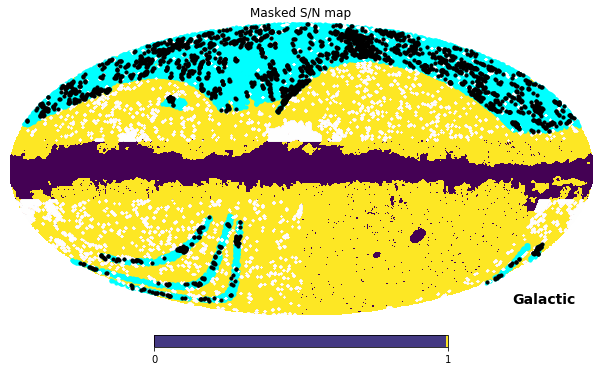

In [38]:
hp.mollview(mask,norm='hist',coord=['G'],title='Masked S/N map')
hp.visufunc.projscatter(amfFull['GLON'],amfFull['GLAT'],c='cyan',lonlat=True,s=10)
hp.visufunc.projscatter(maskedArray.glon,maskedArray.glat,c='w',lonlat=True,s=0.1)
hp.visufunc.projscatter(interLons, interLats,c='k',lonlat=True,s=10)

In [36]:
len(interLons)

2676

---